In [ ]:
function ClickConnect(){
    console.log("Working"); 
    document.querySelector("colab-toolbar-button#connect").click() 
}
setInterval(ClickConnect,60000)

#Data Loading

In [1]:
import os
import pickle
import numpy as np

def load_input_data(storage_folder):

	x_data = None
	data_file = 'data_iq.p'
	data_path = os.path.join(storage_folder, data_file)
	with open(data_path, mode='rb') as storage:
	  x_data = pickle.load(storage, encoding='latin-1')
	
	return x_data

def load_output_data(storage_folder):

	y_data = None
	label_file = 'labels.p'
	label_path = os.path.join(storage_folder, label_file)
	with open(label_path, mode='rb') as storage:
		y_data = pickle.load(storage, encoding='latin-1')

	return y_data

def normalize(x):

	flat_x = x.flatten()
	return ((x - np.mean(flat_x))/np.std(flat_x))
 
def scale(x):

	flat_x = x.flatten()
	return ((x - np.min(flat_x))/(np.max(flat_x) - np.min(flat_x)))


In [2]:
from google.colab import drive

drive.mount('/gdrive/')
!ls /gdrive
folder = '/gdrive/MyDrive/WiTech_Dataset/labeled_data'

Mounted at /gdrive/
MyDrive


In [3]:
# Load 'iq' data.
x_data_iq_data = load_input_data(folder)

# Load the labels.
y_labels_data = load_output_data(folder)

# Models

In [4]:
from keras.layers import *
from keras.models import Sequential
from keras.callbacks import EarlyStopping

In [5]:
def LSTM1D():
  model = Sequential(
    [      
      LSTM(256, return_sequences=True, input_shape = (128, 1)),
      Dropout(0.6),
      BatchNormalization(),
      LeakyReLU(),
      LSTM(256),
      Dropout(0.6),
      BatchNormalization(),
      LeakyReLU(),
      Flatten(),
      Dense(256),
      Dropout(0.6),
      BatchNormalization(),
      LeakyReLU(),
      Dense(64),
      BatchNormalization(),
      LeakyReLU(),
      Dense(15, activation='softmax'),
    ]
  )
  model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
  return model
 
lstm_model = LSTM1D()
print(lstm_model.summary())

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 128, 256)          264192    
_________________________________________________________________
dropout (Dropout)            (None, 128, 256)          0         
_________________________________________________________________
batch_normalization (BatchNo (None, 128, 256)          1024      
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 128, 256)          0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 256)               525312    
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)               0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 256)               1

In [6]:
def LSTM2D():
  model = Sequential(
    [      
      LSTM(256, return_sequences=True, input_shape=(128, 2)),
      Dropout(0.6),
      BatchNormalization(),
      LeakyReLU(),
      LSTM(256),
      Dropout(0.6),
      BatchNormalization(),
      LeakyReLU(),
      Flatten(),
      Dense(256),
      Dropout(0.6),
      BatchNormalization(),
      LeakyReLU(),
      Dense(64),
      BatchNormalization(),
      LeakyReLU(),
      Dense(15, activation='softmax'),
    ]
  )
  model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
  return model
 
lstm_model = LSTM2D()
print(lstm_model.summary())

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_2 (LSTM)                (None, 128, 256)          265216    
_________________________________________________________________
dropout_3 (Dropout)          (None, 128, 256)          0         
_________________________________________________________________
batch_normalization_4 (Batch (None, 128, 256)          1024      
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 128, 256)          0         
_________________________________________________________________
lstm_3 (LSTM)                (None, 256)               525312    
_________________________________________________________________
dropout_4 (Dropout)          (None, 256)               0         
_________________________________________________________________
batch_normalization_5 (Batch (None, 256)              

# Data Exploration

## Flatten Data 

In [ ]:
x_dim = x_data_iq_data.shape
total_num_snapshots = x_dim[0]*x_dim[1]*x_dim[2]
num_snapshots_per_tech = x_dim[1]*x_dim[2]
num_tech = x_dim[0]
num_samples = x_dim[3]
print(num_snapshots_per_tech)

15015


In [ ]:
from keras.utils.np_utils import to_categorical

y_labels = to_categorical(y_labels_data.flatten())
x_data_iq = np.reshape(x_data_iq_data, (total_num_snapshots, x_dim[3], x_dim[4]))

## Data Visualization

In [ ]:
import matplotlib.pyplot as plt
titles = ['Bluetooth CH20', 'Bluetooth CH21', 'Bluetooth CH22', 'Bluetooth CH23', 'Bluetooth CH24', 'Bluetooth CH25', 'Bluetooth CH26', 'Bluetooth CH27', 'Bluetooth CH28', 'Bluetooth CH29', 'WiFi CH3', 'WiFi CH4', 'WiFi CH5', 'ZigBee CH15', 'ZigBee CH16']

iq_view_data = x_data_iq[::num_snapshots_per_tech][:][:]
iq_view_data_complex = np.reshape(iq_view_data.flatten()[::2] + 1j*iq_view_data.flatten()[1::2], (num_tech, num_samples))
iq_view_data_real = np.reshape(iq_view_data.flatten()[::2], (num_tech, num_samples))
iq_view_data_imag = np.reshape(iq_view_data.flatten()[1::2], (num_tech, num_samples))
iq_view_data_abs = np.absolute(iq_view_data_complex)
iq_view_data_angle = np.angle(iq_view_data_complex)

### Magnitude of IQ Data

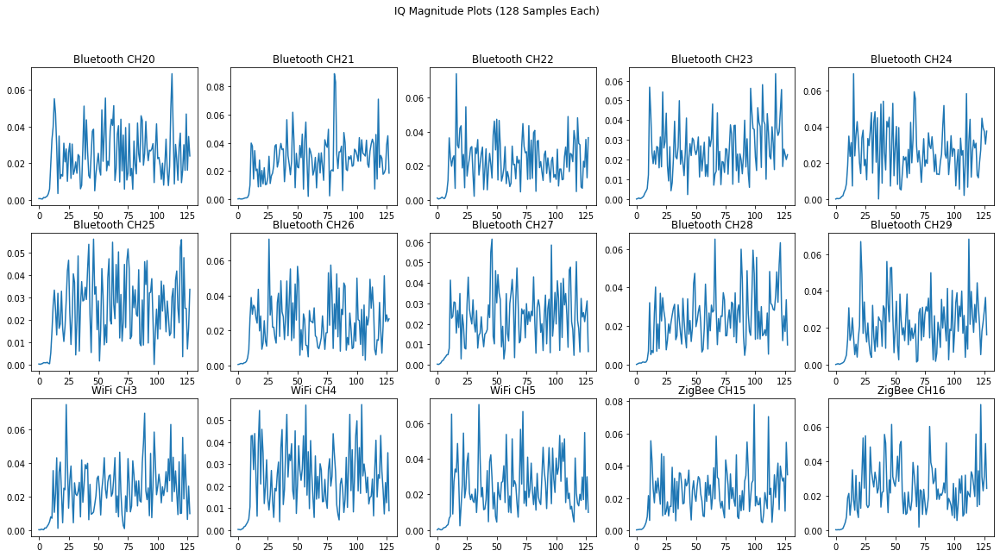

In [ ]:
fig, ax = plt.subplots(3, 5)
fig.suptitle('IQ Magnitude Plots (128 Samples Each)')
fig.set_figheight(10)
fig.set_figwidth(20)

for i in range(num_tech):
  ax[i//5][i%5].plot(iq_view_data_abs[i])
  ax[i//5][i%5].set_title(titles[i])

### Phase of IQ Data

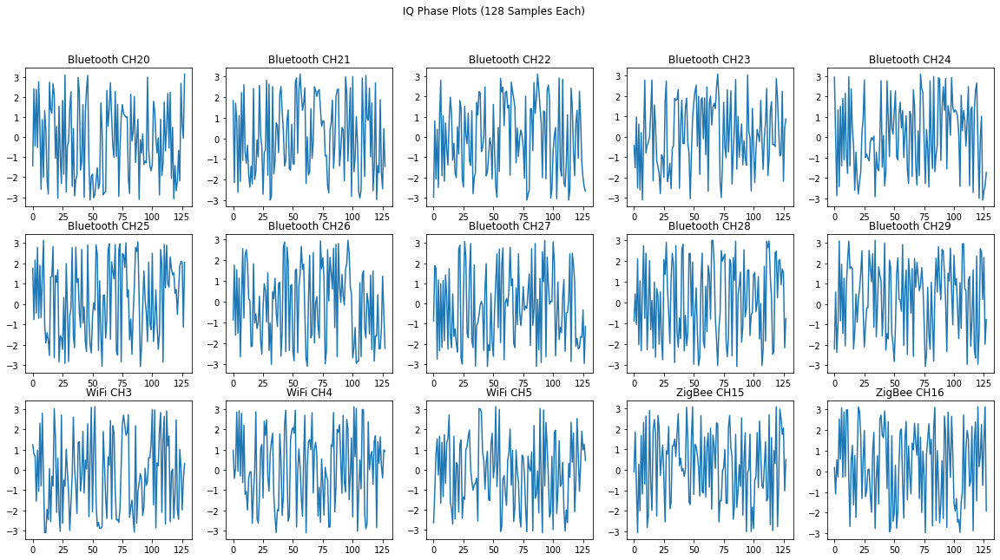

In [ ]:
fig, ax = plt.subplots(3, 5)
fig.suptitle('IQ Phase Plots (128 Samples Each)')
fig.set_figheight(10)
fig.set_figwidth(20)

for i in range(num_tech):
  ax[i//5][i%5].plot(iq_view_data_angle[i])
  ax[i//5][i%5].set_title(titles[i])

### Real Component of IQ Data

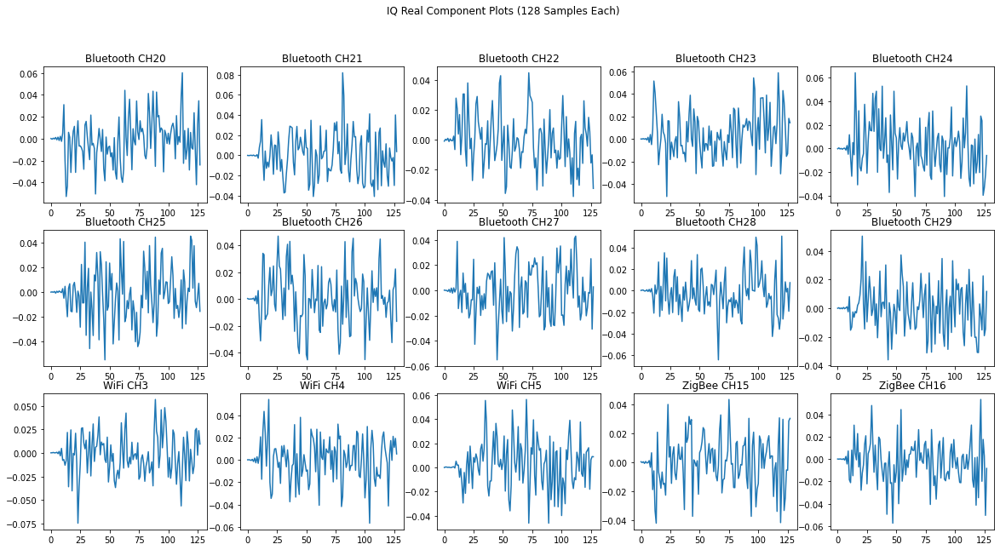

In [ ]:
fig, ax = plt.subplots(3, 5)
fig.suptitle('IQ Real Component Plots (128 Samples Each)')
fig.set_figheight(10)
fig.set_figwidth(20)

for i in range(num_tech):
  ax[i//5][i%5].plot(iq_view_data_real[i])
  ax[i//5][i%5].set_title(titles[i])

### Imaginary Component of IQ Data

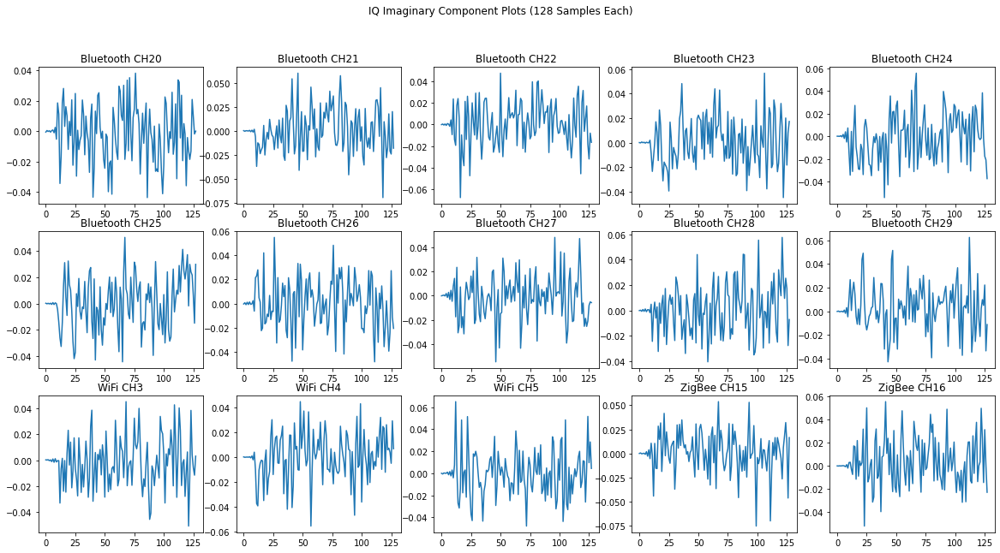

In [ ]:
fig, ax = plt.subplots(3, 5)
fig.suptitle('IQ Imaginary Component Plots (128 Samples Each)')
fig.set_figheight(10)
fig.set_figwidth(20)

for i in range(num_tech):
  ax[i//5][i%5].plot(iq_view_data_imag[i])
  ax[i//5][i%5].set_title(titles[i])

## Training tool-functions

In [7]:
from matplotlib import pyplot

def summarize_model(history):

  pyplot.plot(history.history['accuracy'])
  pyplot.plot(history.history['val_accuracy']) 
  pyplot.title('Model train and validation accuracy')
  pyplot.ylabel('Accuracy')
  pyplot.xlabel('Epoch')
  pyplot.legend(['train', 'validation'], loc='upper right')
  pyplot.show()

  pyplot.plot(history.history['loss'])
  pyplot.plot(history.history['val_loss'])  
  pyplot.title('Model train and validation loss')
  pyplot.ylabel('Loss')
  pyplot.xlabel('Epoch')
  pyplot.legend(['train', 'validation'], loc='upper right')
  pyplot.show()

In [8]:
from sklearn.model_selection import train_test_split
from keras.utils.np_utils import to_categorical

def train_valid_test(x_data, y_labels):

  X_train, X_test_valid, Y_train, Y_test_valid = train_test_split(x_data, y_labels, test_size=0.4)
  X_validation, X_test, Y_validation, Y_test = train_test_split(X_test_valid, Y_test_valid, test_size=0.5)

  return X_train, Y_train, X_validation, Y_validation, X_test,  Y_test

In [9]:
from keras.callbacks import EarlyStopping
ES = EarlyStopping(monitor = 'val_accuracy', mode = 'max', min_delta = 0.001, patience = 60, verbose = 1)

import logging
logging.disable(logging.WARNING)

## Data Format Selection

### Data Pre-processing

In [ ]:
x_dim = x_data_iq_data.shape
total_num_snapshots = x_dim[0]*x_dim[1]*x_dim[2]
num_snapshots_per_tech = x_dim[1]*x_dim[2]
num_tech = x_dim[0]
num_samples = x_dim[3]

x_data_iq = np.reshape(x_data_iq_data, (total_num_snapshots, x_dim[3], x_dim[4]))

In [ ]:
from sklearn.model_selection import train_test_split

iq_data_complex = np.reshape(x_data_iq.flatten()[::2] + 1j*x_data_iq.flatten()[1::2], (total_num_snapshots, num_samples))
iq_data_real = normalize(np.reshape(x_data_iq.flatten()[::2], (total_num_snapshots, num_samples)))
iq_data_imag = normalize(np.reshape(x_data_iq.flatten()[1::2], (total_num_snapshots, num_samples)))
iq_data_abs = scale(np.absolute(iq_data_complex))
iq_data_angle = normalize(np.angle(iq_data_complex))
iq_data_flat = normalize(np.reshape(x_data_iq, (total_num_snapshots, num_samples*2)))
iq_data_2d = normalize(x_data_iq)

In [ ]:
iq_data_ap = np.zeros(shape=(total_num_snapshots, num_samples, 2))

for i in range(total_num_snapshots):
  for j in range(num_samples):
    iq_data_ap[i][j][0] = iq_data_abs[i][j]
    iq_data_ap[i][j][1] = iq_data_angle[i][j]
    
iq_data_ap.shape

(225225, 128, 2)

### Magnitude of IQ Data

Epoch 1/200
132/132 [==============================] - 63s 285ms/step - loss: 2.6627 - accuracy: 0.1010 - val_loss: 2.9506 - val_accuracy: 0.0670
Epoch 2/200
132/132 [==============================] - 38s 285ms/step - loss: 2.4095 - accuracy: 0.1232 - val_loss: 3.0294 - val_accuracy: 0.0655
Epoch 3/200
132/132 [==============================] - 39s 293ms/step - loss: 2.3763 - accuracy: 0.1400 - val_loss: 3.2499 - val_accuracy: 0.0719
Epoch 4/200
132/132 [==============================] - 39s 295ms/step - loss: 2.3134 - accuracy: 0.1600 - val_loss: 2.7603 - val_accuracy: 0.0936
Epoch 5/200
132/132 [==============================] - 40s 300ms/step - loss: 2.3038 - accuracy: 0.1628 - val_loss: 5.1698 - val_accuracy: 0.0973
Epoch 6/200
132/132 [==============================] - 40s 304ms/step - loss: 2.2800 - accuracy: 0.1732 - val_loss: 4.6086 - val_accuracy: 0.1195
Epoch 7/200
132/132 [==============================] - 40s 307ms/step - loss: 2.2394 - accuracy: 0.1859 - val_loss: 5.2387 -

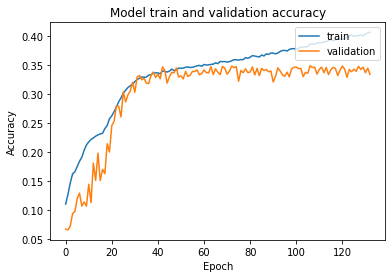

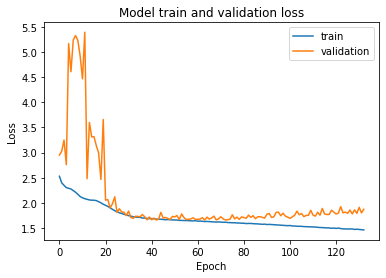

In [ ]:
iq_abs = LSTM1D()

iq_data_abs = np.reshape(iq_data_abs, (total_num_snapshots, num_samples, 1))
# obtain training data
X_train, Y_train, X_validation, Y_validation, X_test,  Y_test = train_valid_test(iq_data_abs, y_labels)

# training 
history = iq_abs.fit(X_train, Y_train, epochs=200, batch_size=1024,  validation_data = (X_validation, Y_validation), shuffle=True, callbacks=[ES])
iq_abs.save("/gdrive/My Drive/Trained Models/iq/iq_abs_allSNR.tf")

# evaluating on test dataset
score = iq_abs.evaluate(X_test, Y_test, verbose=0)
print('\nTest Score = ' + str(score[1]*100) + '\n')

summarize_model(history)

### Phase of IQ Data

Epoch 1/200
132/132 [==============================] - 65s 297ms/step - loss: 2.5822 - accuracy: 0.1351 - val_loss: 2.5617 - val_accuracy: 0.1326
Epoch 2/200
132/132 [==============================] - 41s 307ms/step - loss: 1.7134 - accuracy: 0.3833 - val_loss: 4.6678 - val_accuracy: 0.1169
Epoch 3/200
132/132 [==============================] - 41s 313ms/step - loss: 1.1485 - accuracy: 0.6178 - val_loss: 5.7179 - val_accuracy: 0.2494
Epoch 4/200
132/132 [==============================] - 41s 308ms/step - loss: 0.9440 - accuracy: 0.6928 - val_loss: 1.3741 - val_accuracy: 0.6508
Epoch 5/200
132/132 [==============================] - 41s 312ms/step - loss: 0.8072 - accuracy: 0.7369 - val_loss: 1.0245 - val_accuracy: 0.7186
Epoch 6/200
132/132 [==============================] - 41s 310ms/step - loss: 0.7466 - accuracy: 0.7569 - val_loss: 0.8013 - val_accuracy: 0.7574
Epoch 7/200
132/132 [==============================] - 41s 310ms/step - loss: 0.7031 - accuracy: 0.7718 - val_loss: 0.7601 -

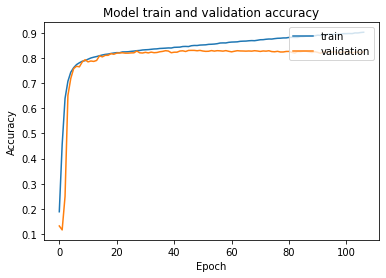

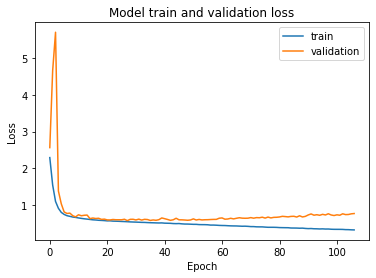

In [ ]:
iq_phase = LSTM1D()


iq_data_angle = np.reshape(iq_data_angle, (total_num_snapshots, num_samples, 1))
# obtain training data
X_train, Y_train, X_validation, Y_validation, X_test,  Y_test = train_valid_test(iq_data_angle, y_labels)

# training 
history = iq_phase.fit(X_train, Y_train, epochs=200, batch_size=1024,  validation_data = (X_validation, Y_validation), shuffle=True, callbacks=[ES])
iq_phase.save("/gdrive/My Drive/Trained Models/iq/iq_phase_allSNR.tf")

# evaluating on test dataset
score = iq_phase.evaluate(X_test, Y_test, verbose=0)
print('\nTest Score = ' + str(score[1]*100) + '\n')

summarize_model(history)







### Real Component of IQ Data

In [ ]:
iq_real = LSTM1D()

iq_data_real = np.reshape(iq_data_real, (total_num_snapshots, num_samples, 1))
# obtain training data
X_train, Y_train, X_validation, Y_validation, X_test,  Y_test = train_valid_test(iq_data_real, y_labels)

# training 
history = iq_real.fit(X_train, Y_train, epochs=200, batch_size=1024,  validation_data = (X_validation, Y_validation), shuffle=True, callbacks=[ES])
iq_real.save("/gdrive/My Drive/Trained Models/iq/iq_real_allSNR.tf")

# evaluating on test dataset
score = iq_real.evaluate(X_test, Y_test, verbose=0)
print('\nTest Score = ' + str(score[1]*100) + '\n')

summarize_model(history)

Epoch 1/200
132/132 [==============================] - 42s 293ms/step - loss: 2.5657 - accuracy: 0.1405 - val_loss: 3.2593 - val_accuracy: 0.0759
Epoch 2/200
132/132 [==============================] - 39s 293ms/step - loss: 1.5586 - accuracy: 0.3283 - val_loss: 5.0689 - val_accuracy: 0.1273
Epoch 3/200
132/132 [==============================] - 39s 295ms/step - loss: 1.3348 - accuracy: 0.3885 - val_loss: 3.8053 - val_accuracy: 0.1881
Epoch 4/200
132/132 [==============================] - 40s 301ms/step - loss: 1.3501 - accuracy: 0.3890 - val_loss: 2.4870 - val_accuracy: 0.2392
Epoch 5/200
132/132 [==============================] - 40s 301ms/step - loss: 1.2828 - accuracy: 0.4007 - val_loss: 1.3593 - val_accuracy: 0.4080
Epoch 6/200
132/132 [==============================] - 40s 300ms/step - loss: 1.2407 - accuracy: 0.4177 - val_loss: 1.2725 - val_accuracy: 0.4258
Epoch 7/200
132/132 [==============================] - 40s 302ms/step - loss: 1.1737 - accuracy: 0.4496 - val_loss: 1.2043 -

TypeError: ignored

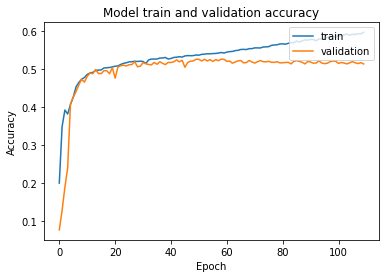

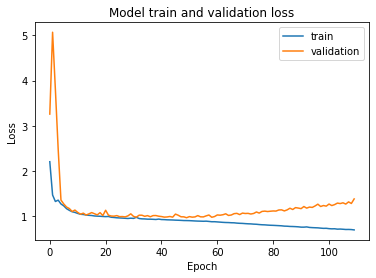

In [ ]:
summarize_model(history)

### Imaginary Component of IQ Data

Epoch 1/200
132/132 [==============================] - 46s 316ms/step - loss: 2.4418 - accuracy: 0.1687 - val_loss: 3.8738 - val_accuracy: 0.0714
Epoch 2/200
132/132 [==============================] - 39s 298ms/step - loss: 1.4738 - accuracy: 0.3287 - val_loss: 4.9423 - val_accuracy: 0.1030
Epoch 3/200
132/132 [==============================] - 40s 301ms/step - loss: 1.3482 - accuracy: 0.3761 - val_loss: 4.5485 - val_accuracy: 0.1419
Epoch 4/200
132/132 [==============================] - 40s 301ms/step - loss: 1.2871 - accuracy: 0.4040 - val_loss: 1.9295 - val_accuracy: 0.3142
Epoch 5/200
132/132 [==============================] - 40s 300ms/step - loss: 1.2510 - accuracy: 0.4153 - val_loss: 1.2891 - val_accuracy: 0.3996
Epoch 6/200
132/132 [==============================] - 40s 302ms/step - loss: 1.2074 - accuracy: 0.4356 - val_loss: 1.4773 - val_accuracy: 0.3761
Epoch 7/200
132/132 [==============================] - 40s 303ms/step - loss: 1.1451 - accuracy: 0.4582 - val_loss: 1.1761 -

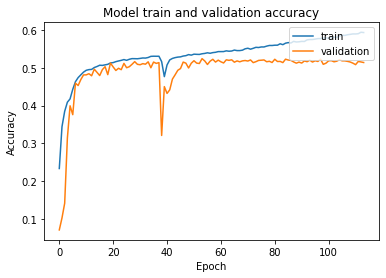

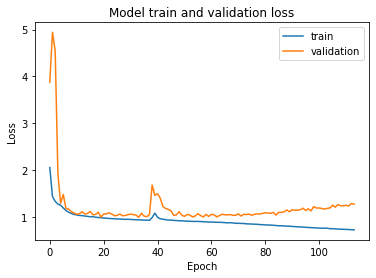

In [ ]:
iq_imag = LSTM1D()

iq_data_imag = np.reshape(iq_data_imag, (total_num_snapshots, num_samples, 1))
# obtain training data
X_train, Y_train, X_validation, Y_validation, X_test,  Y_test = train_valid_test(iq_data_imag, y_labels)

# training 
history = iq_imag.fit(X_train, Y_train, epochs=200, batch_size=1024,  validation_data = (X_validation, Y_validation), shuffle=True, callbacks=[ES])
iq_imag.save("/gdrive/My Drive/Trained Models/iq/iq_imag_allSNR.tf")

# evaluating on test dataset
score = iq_imag.evaluate(X_test, Y_test, verbose=0)
print('\nTest Score = ' + str(score[1]*100) + '\n')

summarize_model(history)

### 2D (Real and Imaginary Components) of IQ Data

Epoch 1/200
132/132 [==============================] - 49s 343ms/step - loss: 2.2155 - accuracy: 0.2768 - val_loss: 3.8379 - val_accuracy: 0.0887
Epoch 2/200
132/132 [==============================] - 42s 319ms/step - loss: 0.9335 - accuracy: 0.6484 - val_loss: 5.1481 - val_accuracy: 0.0822
Epoch 3/200
132/132 [==============================] - 43s 328ms/step - loss: 0.7733 - accuracy: 0.7012 - val_loss: 2.0532 - val_accuracy: 0.3987
Epoch 4/200
132/132 [==============================] - 43s 324ms/step - loss: 0.6936 - accuracy: 0.7354 - val_loss: 0.8890 - val_accuracy: 0.7196
Epoch 5/200
132/132 [==============================] - 43s 326ms/step - loss: 0.6384 - accuracy: 0.7576 - val_loss: 0.6293 - val_accuracy: 0.7675
Epoch 6/200
132/132 [==============================] - 43s 326ms/step - loss: 0.5863 - accuracy: 0.7849 - val_loss: 0.5300 - val_accuracy: 0.8216
Epoch 7/200
132/132 [==============================] - 43s 326ms/step - loss: 0.5148 - accuracy: 0.8292 - val_loss: 0.4735 -

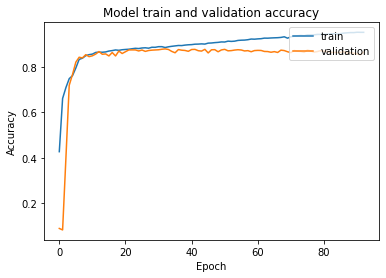

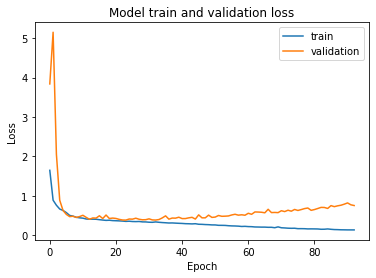

In [ ]:
iq_2d = LSTM2D()

iq_data_2d = np.reshape(iq_data_2d, (total_num_snapshots, num_samples, 2))
# obtain training data
X_train, Y_train, X_validation, Y_validation, X_test,  Y_test = train_valid_test(iq_data_2d, y_labels)

# training 
history = iq_2d.fit(X_train, Y_train, epochs=200, batch_size=1024,  validation_data = (X_validation, Y_validation), shuffle=True, callbacks=[ES])
iq_2d.save("/gdrive/My Drive/Trained Models/iq/iq_2d_allSNR.tf")

# evaluating on test dataset
score = iq_2d.evaluate(X_test, Y_test, verbose=0)
print('\nTest Score = ' + str(score[1]*100) + '\n')

summarize_model(history)

### A/P (Amplitude and Phase Components) of IQ Data

Epoch 1/200
132/132 [==============================] - 46s 320ms/step - loss: 2.4559 - accuracy: 0.1618 - val_loss: 3.5991 - val_accuracy: 0.1277
Epoch 2/200
132/132 [==============================] - 40s 301ms/step - loss: 1.6606 - accuracy: 0.3341 - val_loss: 3.4031 - val_accuracy: 0.1961
Epoch 3/200
132/132 [==============================] - 40s 307ms/step - loss: 1.2370 - accuracy: 0.5199 - val_loss: 2.9964 - val_accuracy: 0.3292
Epoch 4/200
132/132 [==============================] - 40s 305ms/step - loss: 0.9373 - accuracy: 0.6677 - val_loss: 1.6860 - val_accuracy: 0.6115
Epoch 5/200
132/132 [==============================] - 40s 305ms/step - loss: 0.7779 - accuracy: 0.7264 - val_loss: 0.8556 - val_accuracy: 0.7534
Epoch 6/200
132/132 [==============================] - 40s 307ms/step - loss: 0.6666 - accuracy: 0.7714 - val_loss: 0.6035 - val_accuracy: 0.8028
Epoch 7/200
132/132 [==============================] - 40s 306ms/step - loss: 0.6023 - accuracy: 0.7952 - val_loss: 0.6055 -

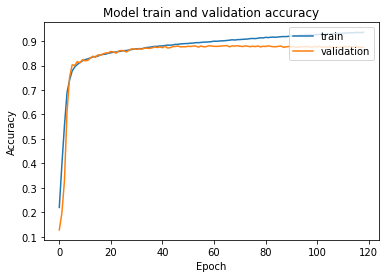

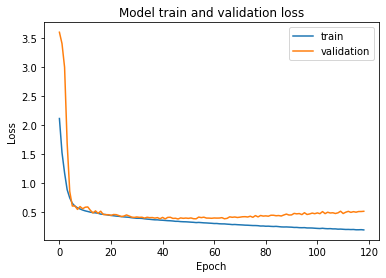

In [ ]:
iq_ap = LSTM2D()

iq_data_ap = np.reshape(iq_data_ap, (total_num_snapshots, num_samples, 2))
# obtain training data
X_train, Y_train, X_validation, Y_validation, X_test,  Y_test = train_valid_test(iq_data_ap, y_labels)

# training 
history = iq_ap.fit(X_train, Y_train, epochs=200, batch_size=1024,  validation_data = (X_validation, Y_validation), shuffle=True, callbacks=[ES])
iq_ap.save("/gdrive/My Drive/Trained Models/iq/iq_ap_allSNR.tf")

# evaluating on test dataset
score = iq_ap.evaluate(X_test, Y_test, verbose=0)
print('\nTest Score = ' + str(score[1]*100) + '\n')

summarize_model(history)

# Training and Analysis

## IQ 2D

### High SNR

In [ ]:
x_dim = x_data_iq_data[:,10:21].shape
total_num_snapshots = x_dim[0]*x_dim[1]*x_dim[2]
num_snapshots_per_tech = x_dim[1]*x_dim[2]
num_tech = x_dim[0]
num_samples = x_dim[3]

x_data_iq_high = np.reshape(x_data_iq_data[:,10:21], (total_num_snapshots, num_samples, 2))
iq_data_2d_high = normalize(x_data_iq_high)
y_labels_high = to_categorical(y_labels_data[:,10:21].flatten())

In [ ]:
iq_2d = LSTM2D()

# obtain training data
X_train, Y_train, X_validation, Y_validation, X_test,  Y_test = train_valid_test(iq_data_2d_high, y_labels_high)

# training 
history = iq_2d.fit(X_train, Y_train, epochs=200, batch_size=1024,  validation_data = (X_validation, Y_validation), shuffle=True, callbacks=[ES])
iq_2d.save("/gdrive/My Drive/Trained Models/iq/iq_2d_highSNR.tf")

# evaluating on test dataset
score = iq_2d.evaluate(X_test, Y_test, verbose=0)
print('\nTest Score = ' + str(score[1]*100) + '\n')

summarize_model(history)

Epoch 1/200
70/70 [==============================] - 70s 305ms/step - loss: 1.8902 - accuracy: 0.3683 - val_loss: 3.6134 - val_accuracy: 0.1396
Epoch 2/200
70/70 [==============================] - 20s 293ms/step - loss: 0.6428 - accuracy: 0.7102 - val_loss: 4.8810 - val_accuracy: 0.0857
Epoch 3/200
70/70 [==============================] - 21s 300ms/step - loss: 0.5351 - accuracy: 0.7585 - val_loss: 4.9182 - val_accuracy: 0.1414
Epoch 4/200
70/70 [==============================] - 21s 304ms/step - loss: 0.3453 - accuracy: 0.8476 - val_loss: 5.4388 - val_accuracy: 0.1313
Epoch 5/200
70/70 [==============================] - 22s 309ms/step - loss: 0.2835 - accuracy: 0.8646 - val_loss: 4.5919 - val_accuracy: 0.3390
Epoch 6/200
70/70 [==============================] - 22s 314ms/step - loss: 0.2808 - accuracy: 0.8731 - val_loss: 4.1827 - val_accuracy: 0.3665
Epoch 7/200
70/70 [==============================] - 22s 315ms/step - loss: 0.2035 - accuracy: 0.9036 - val_loss: 0.8034 - val_accuracy:

TypeError: ignored

In [ ]:
summarize_model(history)

NameError: ignored

### Low SNR

In [ ]:
x_dim = x_data_iq_data[:,0:10].shape
total_num_snapshots = x_dim[0]*x_dim[1]*x_dim[2]
num_snapshots_per_tech = x_dim[1]*x_dim[2]
num_tech = x_dim[0]
num_samples = x_dim[3]

x_data_iq_low = np.reshape(x_data_iq_data[:,0:10], (total_num_snapshots, x_dim[3], x_dim[4]))
iq_data_2d_low = normalize(x_data_iq_low)
y_labels_low = to_categorical(y_labels_data[:,0:10].flatten())

Epoch 1/200
63/63 [==============================] - 24s 303ms/step - loss: 2.8729 - accuracy: 0.0977 - val_loss: 2.4737 - val_accuracy: 0.1159
Epoch 2/200
63/63 [==============================] - 18s 291ms/step - loss: 2.0494 - accuracy: 0.3017 - val_loss: 2.8172 - val_accuracy: 0.1579
Epoch 3/200
63/63 [==============================] - 18s 294ms/step - loss: 1.5210 - accuracy: 0.4538 - val_loss: 3.9624 - val_accuracy: 0.0832
Epoch 4/200
63/63 [==============================] - 18s 294ms/step - loss: 1.3348 - accuracy: 0.5172 - val_loss: 4.6792 - val_accuracy: 0.1034
Epoch 5/200
63/63 [==============================] - 19s 297ms/step - loss: 1.2299 - accuracy: 0.5502 - val_loss: 3.7297 - val_accuracy: 0.1945
Epoch 6/200
63/63 [==============================] - 19s 307ms/step - loss: 1.1631 - accuracy: 0.5713 - val_loss: 3.8773 - val_accuracy: 0.2324
Epoch 7/200
63/63 [==============================] - 19s 309ms/step - loss: 1.0803 - accuracy: 0.6081 - val_loss: 1.9511 - val_accuracy:

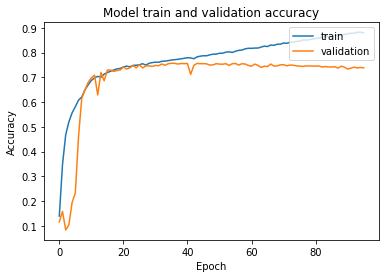

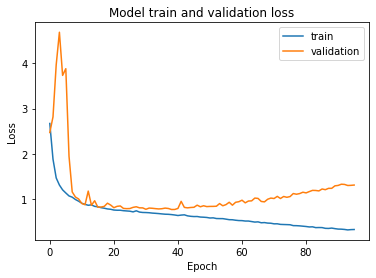

In [ ]:
iq_2d = LSTM2D()

# obtain training data
X_train, Y_train, X_validation, Y_validation, X_test,  Y_test = train_valid_test(iq_data_2d_low, y_labels_low)

# training 
history = iq_2d.fit(X_train, Y_train, epochs=200, batch_size=1024,  validation_data = (X_validation, Y_validation), shuffle=True, callbacks=[ES])
iq_2d.save("/gdrive/My Drive/Trained Models/iq/iq_2d_lowSNR.tf")

# evaluating on test dataset
score = iq_2d.evaluate(X_test, Y_test, verbose=0)
print('\nTest Score = ' + str(score[1]*100) + '\n')

summarize_model(history)

## IQ Phase



### High SNR

In [ ]:
x_dim = x_data_iq_data[:,10:21].shape
total_num_snapshots = x_dim[0]*x_dim[1]*x_dim[2]
num_snapshots_per_tech = x_dim[1]*x_dim[2]
num_tech = x_dim[0]
num_samples = x_dim[3]

iq_data_complex_high = np.reshape(x_data_iq_data[:,10:21].flatten()[::2] + 1j*x_data_iq_data[:,10:21].flatten()[1::2], (total_num_snapshots, num_samples))
iq_data_angle_high = normalize(np.angle(iq_data_complex_high))
iq_data_angle_high = np.reshape(iq_data_angle_high, (total_num_snapshots, num_samples, 1))
y_labels_high = to_categorical(y_labels_data[:,10:21].flatten())

Epoch 1/200
70/70 [==============================] - 27s 335ms/step - loss: 2.5503 - accuracy: 0.1462 - val_loss: 2.7583 - val_accuracy: 0.1004
Epoch 2/200
70/70 [==============================] - 22s 320ms/step - loss: 1.5966 - accuracy: 0.3377 - val_loss: 3.6684 - val_accuracy: 0.0751
Epoch 3/200
70/70 [==============================] - 22s 311ms/step - loss: 1.0052 - accuracy: 0.5844 - val_loss: 3.6629 - val_accuracy: 0.2140
Epoch 4/200
70/70 [==============================] - 22s 310ms/step - loss: 0.6998 - accuracy: 0.7081 - val_loss: 5.8601 - val_accuracy: 0.1417
Epoch 5/200
70/70 [==============================] - 22s 314ms/step - loss: 0.3806 - accuracy: 0.8533 - val_loss: 5.8712 - val_accuracy: 0.2415
Epoch 6/200
70/70 [==============================] - 22s 314ms/step - loss: 0.2630 - accuracy: 0.8992 - val_loss: 4.2633 - val_accuracy: 0.4173
Epoch 7/200
70/70 [==============================] - 22s 314ms/step - loss: 0.2090 - accuracy: 0.9193 - val_loss: 2.4895 - val_accuracy:

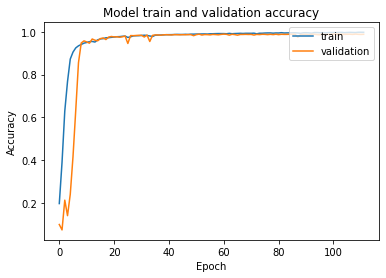

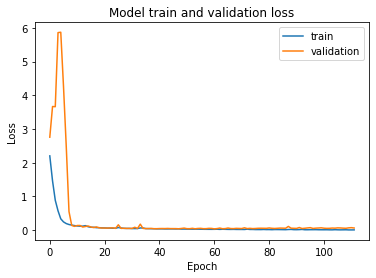

In [ ]:
iq_phase = LSTM1D()

# obtain training data
X_train, Y_train, X_validation, Y_validation, X_test,  Y_test = train_valid_test(iq_data_phase_high, y_labels_high)

# training 
history = iq_phase.fit(X_train, Y_train, epochs=200, batch_size=1024,  validation_data = (X_validation, Y_validation), shuffle=True, callbacks=[ES])
iq_phase.save("/gdrive/My Drive/Trained Models/iq/iq_phase_highSNR.tf")

# evaluating on test dataset
score = iq_phase.evaluate(X_test, Y_test, verbose=0)
print('\nTest Score = ' + str(score[1]*100) + '\n')

summarize_model(history)

### Low SNR

In [ ]:
x_dim = x_data_iq_data[:,0:10].shape
total_num_snapshots = x_dim[0]*x_dim[1]*x_dim[2]
num_snapshots_per_tech = x_dim[1]*x_dim[2]
num_tech = x_dim[0]
num_samples = x_dim[3]

iq_data_complex_low = np.reshape(x_data_iq_data[:,0:10].flatten()[::2] + 1j*x_data_iq_data[:,0:10].flatten()[1::2], (total_num_snapshots, num_samples))
iq_data_angle_low = normalize(np.angle(iq_data_complex_low))
iq_data_angle_low = np.reshape(iq_data_angle_low, (total_num_snapshots, num_samples, 1))
y_labels_low = to_categorical(y_labels_data[:,0:10].flatten())

Epoch 1/200
63/63 [==============================] - 26s 337ms/step - loss: 2.9020 - accuracy: 0.0777 - val_loss: 2.6650 - val_accuracy: 0.0844
Epoch 2/200
63/63 [==============================] - 20s 324ms/step - loss: 2.5218 - accuracy: 0.1225 - val_loss: 2.5464 - val_accuracy: 0.1303
Epoch 3/200
63/63 [==============================] - 20s 315ms/step - loss: 2.4090 - accuracy: 0.1479 - val_loss: 2.6383 - val_accuracy: 0.1021
Epoch 4/200
63/63 [==============================] - 20s 311ms/step - loss: 2.2941 - accuracy: 0.1765 - val_loss: 3.2239 - val_accuracy: 0.0781
Epoch 5/200
63/63 [==============================] - 20s 316ms/step - loss: 2.1490 - accuracy: 0.2241 - val_loss: 5.4515 - val_accuracy: 0.0687
Epoch 6/200
63/63 [==============================] - 20s 317ms/step - loss: 1.9953 - accuracy: 0.3038 - val_loss: 4.9724 - val_accuracy: 0.1024
Epoch 7/200
63/63 [==============================] - 20s 317ms/step - loss: 1.7703 - accuracy: 0.3938 - val_loss: 3.3384 - val_accuracy:

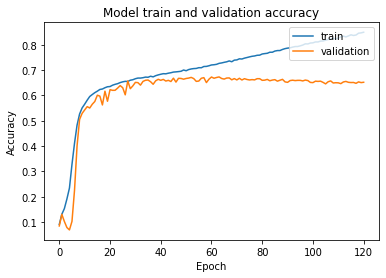

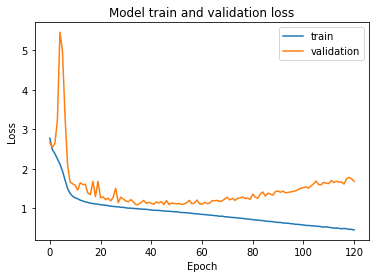

In [ ]:
iq_phase = LSTM1D()

# obtain training data
X_train, Y_train, X_validation, Y_validation, X_test,  Y_test = train_valid_test(iq_data_phase_low, y_labels_low)

# training 
history = iq_phase.fit(X_train, Y_train, epochs=200, batch_size=1024,  validation_data = (X_validation, Y_validation), shuffle=True, callbacks=[ES])
iq_phase.save("/gdrive/My Drive/Trained Models/iq/iq_phase_lowSNR.tf")

# evaluating on test dataset
score = iq_phase.evaluate(X_test, Y_test, verbose=0)
print('\nTest Score = ' + str(score[1]*100) + '\n')

summarize_model(history)

## IQ A/P



### High SNR

In [ ]:
x_dim = x_data_iq_data[:,10:21].shape
total_num_snapshots = x_dim[0]*x_dim[1]*x_dim[2]
num_snapshots_per_tech = x_dim[1]*x_dim[2]
num_tech = x_dim[0]
num_samples = x_dim[3]

iq_data_complex_high = np.reshape(x_data_iq_data[:,10:21].flatten()[::2] + 1j*x_data_iq_data[:,10:21].flatten()[1::2], (total_num_snapshots, num_samples))
iq_data_angle_high = normalize(np.angle(iq_data_complex_high))
iq_data_abs_high = scale(np.absolute(iq_data_complex_high))

iq_data_ap_high = np.zeros(shape=(total_num_snapshots, num_samples, 2))

for i in range(total_num_snapshots):
  for j in range(num_samples):
    iq_data_ap_high[i][j][0] = iq_data_abs_high[i][j]
    iq_data_ap_high[i][j][1] = iq_data_angle_high[i][j]

y_labels_high = to_categorical(y_labels_data[:,10:21].flatten())

Epoch 1/200
70/70 [==============================] - 44s 292ms/step - loss: 2.2519 - accuracy: 0.2026 - val_loss: 3.3546 - val_accuracy: 0.1073
Epoch 2/200
70/70 [==============================] - 19s 279ms/step - loss: 1.2970 - accuracy: 0.3954 - val_loss: 4.1144 - val_accuracy: 0.1279
Epoch 3/200
70/70 [==============================] - 20s 282ms/step - loss: 0.8406 - accuracy: 0.5709 - val_loss: 3.9859 - val_accuracy: 0.2446
Epoch 4/200
70/70 [==============================] - 20s 286ms/step - loss: 0.6780 - accuracy: 0.6525 - val_loss: 5.4750 - val_accuracy: 0.2055
Epoch 5/200
70/70 [==============================] - 20s 289ms/step - loss: 0.4247 - accuracy: 0.7970 - val_loss: 4.3822 - val_accuracy: 0.2779
Epoch 6/200
70/70 [==============================] - 20s 292ms/step - loss: 0.2933 - accuracy: 0.8632 - val_loss: 3.3565 - val_accuracy: 0.5169
Epoch 7/200
70/70 [==============================] - 20s 291ms/step - loss: 0.2269 - accuracy: 0.8867 - val_loss: 0.7878 - val_accuracy:

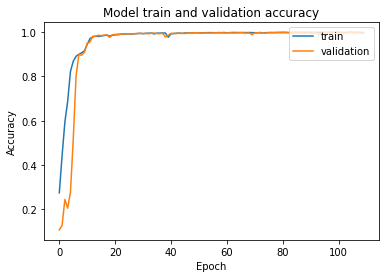

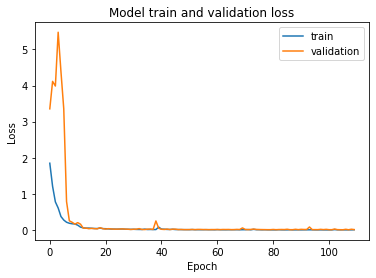

In [ ]:
iq_ap_high = LSTM2D()

# obtain training data
X_train, Y_train, X_validation, Y_validation, X_test,  Y_test = train_valid_test(iq_data_ap_high, y_labels_high)

# training 
history = iq_ap_high.fit(X_train, Y_train, epochs=200, batch_size=1024,  validation_data = (X_validation, Y_validation), shuffle=True, callbacks=[ES])
iq_ap_high.save("/gdrive/My Drive/Trained Models/iq/iq_ap_highSNR.tf")

# evaluating on test dataset
score = iq_ap_high.evaluate(X_test, Y_test, verbose=0)
print('\nTest Score = ' + str(score[1]*100) + '\n')

summarize_model(history)

### Low SNR

In [ ]:
x_dim = x_data_iq_data[:,0:10].shape
total_num_snapshots = x_dim[0]*x_dim[1]*x_dim[2]
num_snapshots_per_tech = x_dim[1]*x_dim[2]
num_tech = x_dim[0]
num_samples = x_dim[3]

iq_data_complex_low = np.reshape(x_data_iq_data[:,0:10].flatten()[::2] + 1j*x_data_iq_data[:,0:10].flatten()[1::2], (total_num_snapshots, num_samples))
iq_data_angle_low = normalize(np.angle(iq_data_complex_low))
iq_data_abs_low = scale(np.absolute(iq_data_complex_low))

iq_data_ap_low = np.zeros(shape=(total_num_snapshots, num_samples, 2))

for i in range(total_num_snapshots):
  for j in range(num_samples):
    iq_data_ap_low[i][j][0] = iq_data_abs_low[i][j]
    iq_data_ap_low[i][j][1] = iq_data_angle_low[i][j]

y_labels_low = to_categorical(y_labels_data[:,0:10].flatten())

Epoch 1/200
63/63 [==============================] - 24s 317ms/step - loss: 2.9207 - accuracy: 0.0780 - val_loss: 2.7099 - val_accuracy: 0.0739
Epoch 2/200
63/63 [==============================] - 19s 307ms/step - loss: 2.5148 - accuracy: 0.1285 - val_loss: 2.6400 - val_accuracy: 0.1056
Epoch 3/200
63/63 [==============================] - 19s 300ms/step - loss: 2.3306 - accuracy: 0.1629 - val_loss: 3.1370 - val_accuracy: 0.1074
Epoch 4/200
63/63 [==============================] - 19s 296ms/step - loss: 2.1455 - accuracy: 0.2040 - val_loss: 2.9940 - val_accuracy: 0.1520
Epoch 5/200
63/63 [==============================] - 19s 298ms/step - loss: 2.0140 - accuracy: 0.2404 - val_loss: 5.5697 - val_accuracy: 0.0829
Epoch 6/200
63/63 [==============================] - 19s 301ms/step - loss: 1.9154 - accuracy: 0.2988 - val_loss: 5.4989 - val_accuracy: 0.0761
Epoch 7/200
63/63 [==============================] - 19s 301ms/step - loss: 1.7107 - accuracy: 0.3775 - val_loss: 4.5468 - val_accuracy:

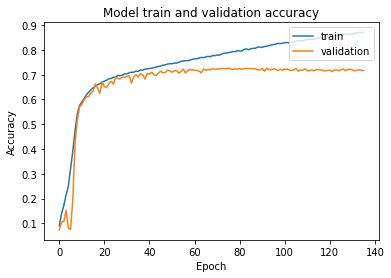

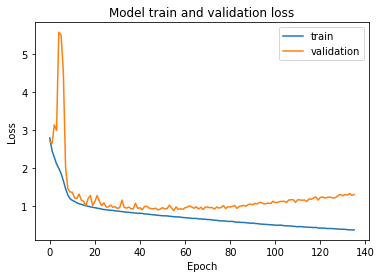

In [ ]:
iq_ap_low = LSTM2D()

# obtain training data
X_train, Y_train, X_validation, Y_validation, X_test,  Y_test = train_valid_test(iq_data_ap_low, y_labels_low)

# training 
history = iq_ap_low.fit(X_train, Y_train, epochs=200, batch_size=1024,  validation_data = (X_validation, Y_validation), shuffle=True, callbacks=[ES])
iq_ap_low.save("/gdrive/My Drive/Trained Models/iq/iq_ap_lowSNR.tf")

# evaluating on test dataset
score = iq_ap_low.evaluate(X_test, Y_test, verbose=0)
print('\nTest Score = ' + str(score[1]*100) + '\n')

summarize_model(history)

# Transfer learning

## Helper functions

In [10]:
from matplotlib import pyplot

def summarize_model(history, i):

  pyplot.plot(history.history['accuracy'])
  pyplot.plot(history.history['val_accuracy']) 
  pyplot.title('Model train and validation accuracy - SNR ' + str(2*i-20))
  pyplot.ylabel('Accuracy')
  pyplot.xlabel('Epoch')
  pyplot.legend(['train', 'validation'], loc='upper right')
  pyplot.show()

  pyplot.plot(history.history['loss'])
  pyplot.plot(history.history['val_loss'])  
  pyplot.title('Model train and validation loss - SNR ' + str(2*i-20))
  pyplot.ylabel('Loss')
  pyplot.xlabel('Epoch')
  pyplot.legend(['train', 'validation'], loc='upper right')
  pyplot.show()

In [11]:
from keras import models
score_arr = [0, 0]

def train_data_2D(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i):
  
  print("\nTraining SNR = "+str(2*i-20)+" Data\n")
  model_curr = LSTM2D()
  history = model_curr.fit(X_train_curr, Y_train_curr, validation_data = (X_validation_curr, Y_validation_curr), epochs=200, batch_size=1024)

  score = model_curr.evaluate(X_test_curr, Y_test_curr, verbose=0)
  print('\nEvaluating on Test data : Score of SNR ' + str(2*i-20) + ' = ' + str(score[1]*100) +'\n')
  score_ = score[1]*100
  summarize_model(history, i)

  del history, model_curr
  return score_

def train_data_1D(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i):
  
  print("\nTraining SNR = "+str(2*i-20)+" Data\n")
  model_curr = LSTM1D()
  history = model_curr.fit(X_train_curr, Y_train_curr, validation_data = (X_validation_curr, Y_validation_curr), epochs=200, batch_size=1024)

  score = model_curr.evaluate(X_test_curr, Y_test_curr, verbose=0)
  print('\nEvaluating on Test data : Score of SNR ' + str(2*i-20) + ' = ' + str(score[1]*100) +'\n')
  score_ = score[1]*100
  summarize_model(history, i)

  del history, model_curr
  return score_

def train_data_on_all_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, model_folder, i):
  
  all_snr_model = models.load_model(model_folder)
  score = all_snr_model.evaluate(X_test_curr, Y_test_curr, verbose=0)
  print('\nScore of SNR on All SNR model without Transfer Learning ' + str(2*i-20) + ' = ' + str(score[1]*100))
  score_arr[0] = score[1]*100

  print("\nTraining SNR = "+str(2*i-20)+" Data on a pre-trained All SNR model\n")
  history = all_snr_model.fit(X_train_curr, Y_train_curr, validation_data = (X_validation_curr, Y_validation_curr), epochs=200, batch_size=1024, callbacks=[ES])

  score = all_snr_model.evaluate(X_test_curr, Y_test_curr, verbose=0)
  print('\nEvaluating on Test data : Score of SNR ' + str(2*i-20) + ' = ' + str(score[1]*100) +'\n')
  score_arr[1] = score[1]*100
  summarize_model(history, i)

  del history, all_snr_model
  return score_arr

def train_data_on_high_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, model_folder, i):
  
  high_snr_model = models.load_model(model_folder)
  score = high_snr_model.evaluate(X_test_curr, Y_test_curr, verbose=0)
  print('Score of SNR on High SNR model without Transfer Learning ' + str(2*i-20) + ' = ' + str(score[1]*100))
  score_arr[0] = score[1]*100

  print("\nTraining SNR = "+str(2*i-20)+" Data on a pre-trained High SNR model\n")
  history = high_snr_model.fit(X_train_curr, Y_train_curr, validation_data = (X_validation_curr, Y_validation_curr), epochs=200, batch_size=1024, callbacks=[ES])

  score = high_snr_model.evaluate(X_test_curr, Y_test_curr, verbose=0)
  print('\nEvaluating on Test data : Score of SNR ' + str(2*i-20) + ' = ' + str(score[1]*100) +'\n')
  score_arr[1] = score[1]*100
  summarize_model(history, i)

  del history, high_snr_model
  return score_arr

def train_data_on_low_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, model_folder, i):
  
  low_snr_model = models.load_model(model_folder)
  score = low_snr_model.evaluate(X_test_curr, Y_test_curr, verbose=0)
  print('Score of SNR on low SNR model without Transfer Learning ' + str(2*i-20) + ' = ' + str(score[1]*100))
  score_arr[0] = score[1]*100

  print("\nTraining SNR = "+str(2*i-20)+" Data on a pre-trained Low SNR model\n")
  history = low_snr_model.fit(X_train_curr, Y_train_curr, validation_data = (X_validation_curr, Y_validation_curr), epochs=200, batch_size=1024, callbacks=[ES])

  score = low_snr_model.evaluate(X_test_curr, Y_test_curr, verbose=0)
  print('\nEvaluating on Test data : Score of SNR ' + str(2*i-20) + ' = ' + str(score[1]*100) +'\n')
  score_arr[1] = score[1]*100
  summarize_model(history, i)

  del history, low_snr_model
  return score_arr

In [12]:
x_dim = x_data_iq_data.shape
total_num_snapshots = x_dim[0]*x_dim[1]*x_dim[2]
num_snapshots_per_tech = x_dim[1]*x_dim[2]
num_tech = x_dim[0]
num_samples = x_dim[3]

## IQ 2D

In [ ]:
scores_without_tf_2d = np.zeros(shape=(10,1))
scores_tf_allsnr_2d = np.zeros(shape=(2,10))
scores_tf_highsnr_2d = np.zeros(shape=(2,10))
scores_tf_lowsnr_2d = np.zeros(shape=(2,10))

In [ ]:
model_folder_all = "/gdrive/My Drive/Trained Models/iq/iq_2d_allSNR.tf"
model_folder_high = "/gdrive/My Drive/Trained Models/iq/iq_2d_highSNR.tf"
model_folder_low = "/gdrive/My Drive/Trained Models/iq/iq_2d_lowSNR.tf"


Training SNR = -20 Data

Epoch 1/200
7/7 [==============================] - 7s 431ms/step - loss: 3.0586 - accuracy: 0.0633 - val_loss: 2.7086 - val_accuracy: 0.0587
Epoch 2/200
7/7 [==============================] - 2s 275ms/step - loss: 2.9827 - accuracy: 0.0655 - val_loss: 2.7091 - val_accuracy: 0.0611
Epoch 3/200
7/7 [==============================] - 2s 273ms/step - loss: 2.9127 - accuracy: 0.0710 - val_loss: 2.7098 - val_accuracy: 0.0578
Epoch 4/200
7/7 [==============================] - 2s 273ms/step - loss: 2.8783 - accuracy: 0.0786 - val_loss: 2.7107 - val_accuracy: 0.0564
Epoch 5/200
7/7 [==============================] - 2s 275ms/step - loss: 2.8656 - accuracy: 0.0680 - val_loss: 2.7117 - val_accuracy: 0.0573
Epoch 6/200
7/7 [==============================] - 2s 275ms/step - loss: 2.8397 - accuracy: 0.0717 - val_loss: 2.7129 - val_accuracy: 0.0615
Epoch 7/200
7/7 [==============================] - 2s 278ms/step - loss: 2.8027 - accuracy: 0.0787 - val_loss: 2.7139 - val_accu

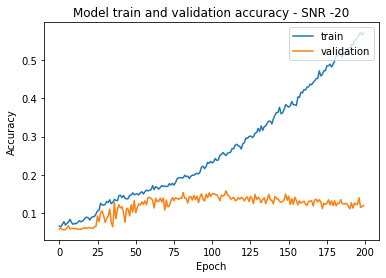

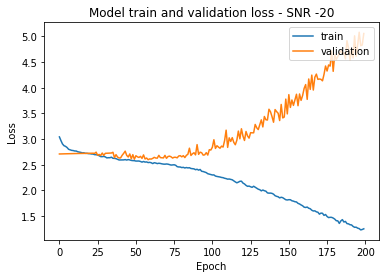


Score of SNR on All SNR model without Transfer Learning -20 = 13.286712765693665

Training SNR = -20 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 6s 275ms/step - loss: 5.3250 - accuracy: 0.2378 - val_loss: 6.3602 - val_accuracy: 0.0821
Epoch 2/200
7/7 [==============================] - 2s 271ms/step - loss: 4.1760 - accuracy: 0.2168 - val_loss: 5.1506 - val_accuracy: 0.0890
Epoch 3/200
7/7 [==============================] - 2s 273ms/step - loss: 3.5063 - accuracy: 0.2222 - val_loss: 4.3558 - val_accuracy: 0.0937
Epoch 4/200
7/7 [==============================] - 2s 275ms/step - loss: 3.0245 - accuracy: 0.2412 - val_loss: 3.8436 - val_accuracy: 0.1105
Epoch 5/200
7/7 [==============================] - 2s 274ms/step - loss: 2.7936 - accuracy: 0.2542 - val_loss: 3.4564 - val_accuracy: 0.1114
Epoch 6/200
7/7 [==============================] - 2s 275ms/step - loss: 2.6373 - accuracy: 0.2594 - val_loss: 3.1973 - val_accuracy: 0.1184
Epoch 7/200
7/7

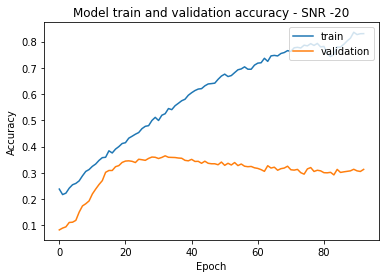

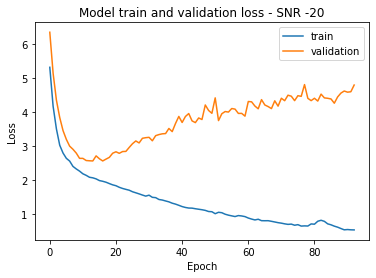

Score of SNR on High SNR model without Transfer Learning -20 = 6.620046496391296

Training SNR = -20 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 6s 278ms/step - loss: 9.0146 - accuracy: 0.0870 - val_loss: 15.4168 - val_accuracy: 0.0998
Epoch 2/200
7/7 [==============================] - 2s 273ms/step - loss: 7.5546 - accuracy: 0.0915 - val_loss: 18.0326 - val_accuracy: 0.0909
Epoch 3/200
7/7 [==============================] - 2s 274ms/step - loss: 6.6857 - accuracy: 0.0870 - val_loss: 17.0456 - val_accuracy: 0.0834
Epoch 4/200
7/7 [==============================] - 2s 275ms/step - loss: 5.8769 - accuracy: 0.0836 - val_loss: 15.4054 - val_accuracy: 0.0718
Epoch 5/200
7/7 [==============================] - 2s 276ms/step - loss: 5.2362 - accuracy: 0.0869 - val_loss: 13.5051 - val_accuracy: 0.0643
Epoch 6/200
7/7 [==============================] - 2s 277ms/step - loss: 4.6557 - accuracy: 0.0793 - val_loss: 11.5272 - val_accuracy: 0.0657
Epoch 7/2

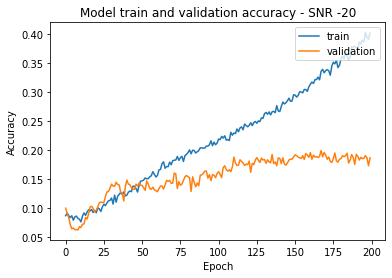

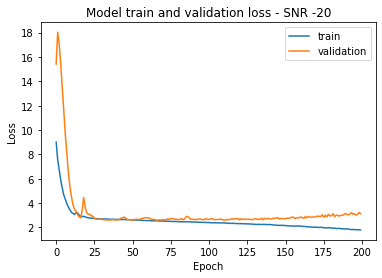

Score of SNR on low SNR model without Transfer Learning -20 = 27.13286578655243

Training SNR = -20 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 5s 277ms/step - loss: 3.9021 - accuracy: 0.3078 - val_loss: 3.4346 - val_accuracy: 0.2000
Epoch 2/200
7/7 [==============================] - 2s 274ms/step - loss: 2.9634 - accuracy: 0.3141 - val_loss: 2.5299 - val_accuracy: 0.2667
Epoch 3/200
7/7 [==============================] - 2s 275ms/step - loss: 2.5937 - accuracy: 0.3461 - val_loss: 2.4456 - val_accuracy: 0.2825
Epoch 4/200
7/7 [==============================] - 2s 276ms/step - loss: 2.3433 - accuracy: 0.3551 - val_loss: 2.3705 - val_accuracy: 0.3138
Epoch 5/200
7/7 [==============================] - 2s 275ms/step - loss: 2.1201 - accuracy: 0.3876 - val_loss: 2.4097 - val_accuracy: 0.3427
Epoch 6/200
7/7 [==============================] - 2s 279ms/step - loss: 2.0492 - accuracy: 0.3952 - val_loss: 2.2985 - val_accuracy: 0.3660
Epoch 7/200
7/7 [

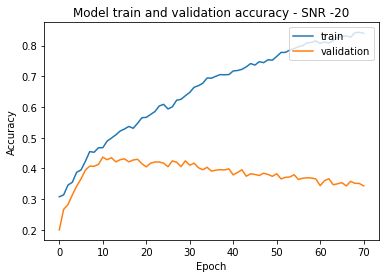

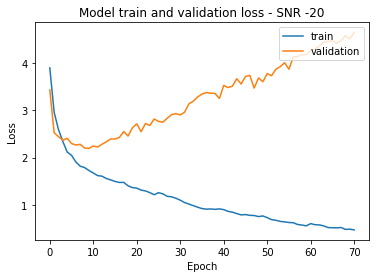

[[11.65501177]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]] [[13.28671277  0.          0.          0.          0.          0.
   0.          0.          0.          0.        ]
 [30.39627075  0.          0.          0.          0.          0.
   0.          0.          0.          0.        ]] [[ 6.6200465  0.         0.         0.         0.         0.
   0.         0.         0.         0.       ]
 [18.8811183  0.         0.         0.         0.         0.
   0.         0.         0.         0.       ]] [[27.13286579  0.          0.          0.          0.          0.
   0.          0.          0.          0.        ]
 [32.587412    0.          0.          0.          0.          0.
   0.          0.          0.          0.        ]]

Training SNR = -18 Data

Epoch 1/200
7/7 [==============================] - 7s 590ms/step - loss: 3.0693 - accuracy: 0.0742 - val_loss: 2.7078 - val_accuracy: 0.

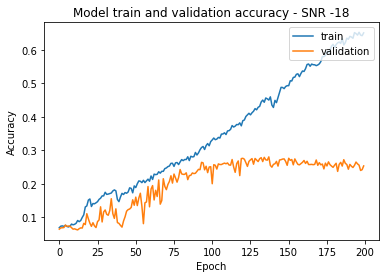

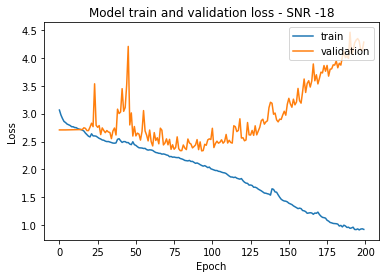


Score of SNR on All SNR model without Transfer Learning -18 = 22.750583291053772

Training SNR = -18 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 6s 277ms/step - loss: 3.4619 - accuracy: 0.4196 - val_loss: 4.0750 - val_accuracy: 0.1921
Epoch 2/200
7/7 [==============================] - 2s 275ms/step - loss: 2.5285 - accuracy: 0.4490 - val_loss: 2.8942 - val_accuracy: 0.2429
Epoch 3/200
7/7 [==============================] - 2s 274ms/step - loss: 2.0431 - accuracy: 0.4737 - val_loss: 2.3201 - val_accuracy: 0.3035
Epoch 4/200
7/7 [==============================] - 2s 277ms/step - loss: 1.8044 - accuracy: 0.5044 - val_loss: 2.0822 - val_accuracy: 0.3739
Epoch 5/200
7/7 [==============================] - 2s 276ms/step - loss: 1.6489 - accuracy: 0.5287 - val_loss: 2.0315 - val_accuracy: 0.3632
Epoch 6/200
7/7 [==============================] - 2s 277ms/step - loss: 1.5661 - accuracy: 0.5294 - val_loss: 1.9200 - val_accuracy: 0.4070
Epoch 7/200
7/7

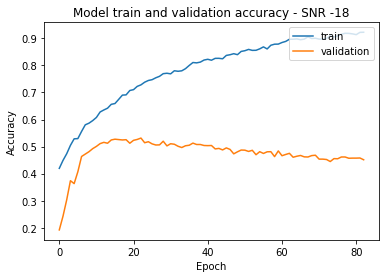

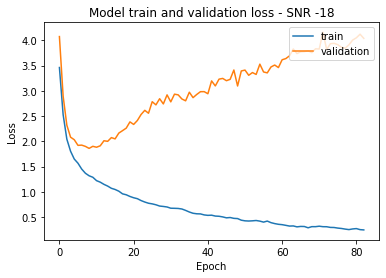

Score of SNR on High SNR model without Transfer Learning -18 = 6.899766623973846

Training SNR = -18 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 6s 276ms/step - loss: 8.4193 - accuracy: 0.1085 - val_loss: 17.4356 - val_accuracy: 0.1063
Epoch 2/200
7/7 [==============================] - 2s 291ms/step - loss: 7.0602 - accuracy: 0.1257 - val_loss: 17.0712 - val_accuracy: 0.1049
Epoch 3/200
7/7 [==============================] - 2s 274ms/step - loss: 6.0368 - accuracy: 0.1225 - val_loss: 16.4998 - val_accuracy: 0.1110
Epoch 4/200
7/7 [==============================] - 2s 275ms/step - loss: 5.4485 - accuracy: 0.1190 - val_loss: 12.7476 - val_accuracy: 0.0928
Epoch 5/200
7/7 [==============================] - 2s 277ms/step - loss: 4.8977 - accuracy: 0.1298 - val_loss: 11.1501 - val_accuracy: 0.0886
Epoch 6/200
7/7 [==============================] - 2s 277ms/step - loss: 4.3950 - accuracy: 0.1361 - val_loss: 9.8560 - val_accuracy: 0.0779
Epoch 7/20

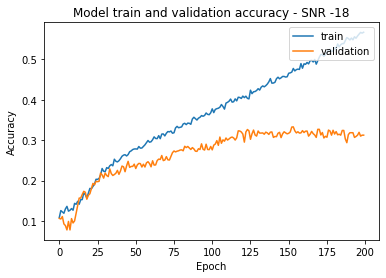

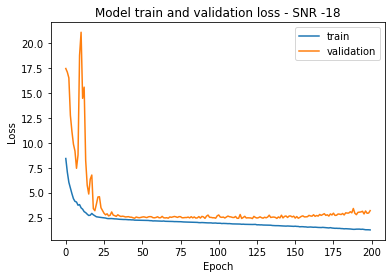

Score of SNR on low SNR model without Transfer Learning -18 = 45.45454680919647

Training SNR = -18 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 6s 275ms/step - loss: 2.1968 - accuracy: 0.5265 - val_loss: 1.9156 - val_accuracy: 0.4699
Epoch 2/200
7/7 [==============================] - 2s 276ms/step - loss: 1.7415 - accuracy: 0.5518 - val_loss: 1.6745 - val_accuracy: 0.5366
Epoch 3/200
7/7 [==============================] - 2s 275ms/step - loss: 1.5413 - accuracy: 0.5719 - val_loss: 1.6510 - val_accuracy: 0.5441
Epoch 4/200
7/7 [==============================] - 2s 276ms/step - loss: 1.3787 - accuracy: 0.6009 - val_loss: 1.6354 - val_accuracy: 0.5608
Epoch 5/200
7/7 [==============================] - 2s 277ms/step - loss: 1.2831 - accuracy: 0.6155 - val_loss: 1.6601 - val_accuracy: 0.5683
Epoch 6/200
7/7 [==============================] - 2s 277ms/step - loss: 1.2030 - accuracy: 0.6322 - val_loss: 1.6286 - val_accuracy: 0.5841
Epoch 7/200
7/7 [

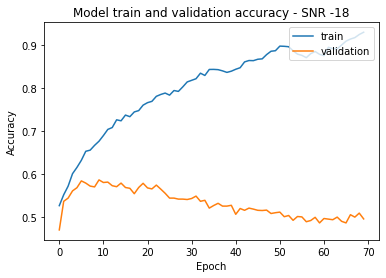

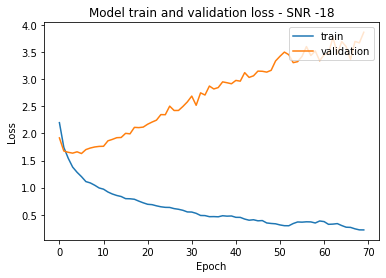

[[11.65501177]
 [27.4125874 ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]] [[13.28671277 22.75058329  0.          0.          0.          0.
   0.          0.          0.          0.        ]
 [30.39627075 47.22610712  0.          0.          0.          0.
   0.          0.          0.          0.        ]] [[ 6.6200465   6.89976662  0.          0.          0.          0.
   0.          0.          0.          0.        ]
 [18.8811183  31.79487288  0.          0.          0.          0.
   0.          0.          0.          0.        ]] [[27.13286579 45.45454681  0.          0.          0.          0.
   0.          0.          0.          0.        ]
 [32.587412   49.3706286   0.          0.          0.          0.
   0.          0.          0.          0.        ]]

Training SNR = -16 Data

Epoch 1/200
7/7 [==============================] - 7s 434ms/step - loss: 3.0825 - accuracy: 0.0700 - val_loss: 2.7082 

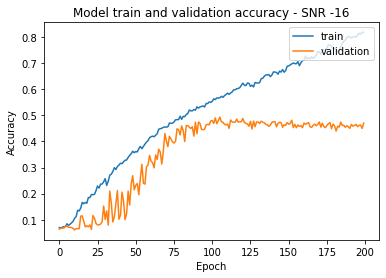

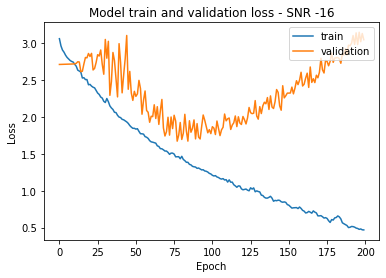


Score of SNR on All SNR model without Transfer Learning -16 = 40.23309946060181

Training SNR = -16 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 6s 278ms/step - loss: 1.7841 - accuracy: 0.6580 - val_loss: 1.5081 - val_accuracy: 0.5967
Epoch 2/200
7/7 [==============================] - 2s 277ms/step - loss: 1.2228 - accuracy: 0.6886 - val_loss: 1.2773 - val_accuracy: 0.6117
Epoch 3/200
7/7 [==============================] - 2s 275ms/step - loss: 1.0071 - accuracy: 0.7024 - val_loss: 1.1975 - val_accuracy: 0.6420
Epoch 4/200
7/7 [==============================] - 2s 277ms/step - loss: 0.9100 - accuracy: 0.7287 - val_loss: 1.0602 - val_accuracy: 0.6797
Epoch 5/200
7/7 [==============================] - 2s 277ms/step - loss: 0.8243 - accuracy: 0.7455 - val_loss: 1.0441 - val_accuracy: 0.6867
Epoch 6/200
7/7 [==============================] - 2s 279ms/step - loss: 0.7440 - accuracy: 0.7613 - val_loss: 1.0943 - val_accuracy: 0.6904
Epoch 7/200
7/7 

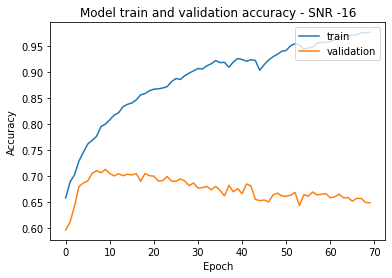

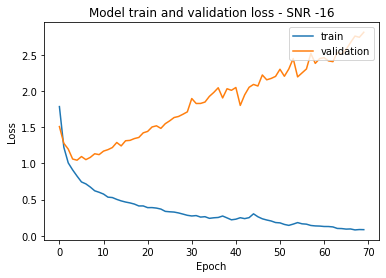

Score of SNR on High SNR model without Transfer Learning -16 = 7.459207624197006

Training SNR = -16 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 6s 279ms/step - loss: 7.4964 - accuracy: 0.1455 - val_loss: 15.0076 - val_accuracy: 0.1436
Epoch 2/200
7/7 [==============================] - 2s 273ms/step - loss: 5.8258 - accuracy: 0.1882 - val_loss: 13.6040 - val_accuracy: 0.1422
Epoch 3/200
7/7 [==============================] - 2s 277ms/step - loss: 4.6383 - accuracy: 0.2124 - val_loss: 10.8390 - val_accuracy: 0.2047
Epoch 4/200
7/7 [==============================] - 2s 277ms/step - loss: 3.9605 - accuracy: 0.2180 - val_loss: 9.4622 - val_accuracy: 0.1585
Epoch 5/200
7/7 [==============================] - 2s 279ms/step - loss: 3.3572 - accuracy: 0.2465 - val_loss: 8.4657 - val_accuracy: 0.2033
Epoch 6/200
7/7 [==============================] - 2s 279ms/step - loss: 3.0249 - accuracy: 0.2454 - val_loss: 7.7356 - val_accuracy: 0.1916
Epoch 7/200


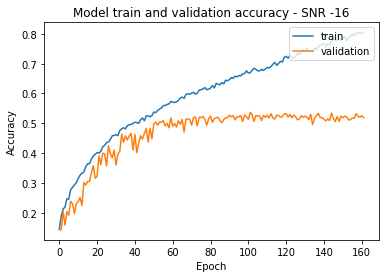

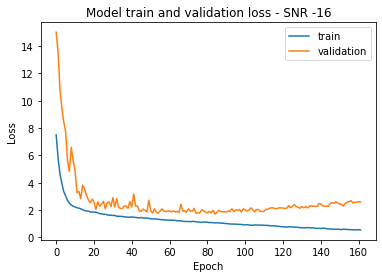

Score of SNR on low SNR model without Transfer Learning -16 = 67.31934547424316

Training SNR = -16 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 6s 280ms/step - loss: 1.2619 - accuracy: 0.6813 - val_loss: 1.0649 - val_accuracy: 0.6942
Epoch 2/200
7/7 [==============================] - 2s 274ms/step - loss: 1.0362 - accuracy: 0.6974 - val_loss: 1.0269 - val_accuracy: 0.7096
Epoch 3/200
7/7 [==============================] - 2s 275ms/step - loss: 0.9020 - accuracy: 0.7181 - val_loss: 1.0084 - val_accuracy: 0.7063
Epoch 4/200
7/7 [==============================] - 2s 276ms/step - loss: 0.8293 - accuracy: 0.7330 - val_loss: 1.0117 - val_accuracy: 0.7189
Epoch 5/200
7/7 [==============================] - 2s 278ms/step - loss: 0.7842 - accuracy: 0.7399 - val_loss: 1.0456 - val_accuracy: 0.7161
Epoch 6/200
7/7 [==============================] - 2s 278ms/step - loss: 0.7222 - accuracy: 0.7566 - val_loss: 1.0742 - val_accuracy: 0.7207
Epoch 7/200
7/7 [

In [ ]:
for i in range(0, 2):

  x_data_iq_curr = np.reshape(x_data_iq_data[:,i], (x_dim[0]*x_dim[2], x_dim[3], x_dim[4]))
  x_data_iq_curr = normalize(x_data_iq_curr)
  y_data_iq_curr = to_categorical(y_labels_data[:,i].flatten())

  X_train_curr, X_test_valid_curr, Y_train_curr, Y_test_valid_curr = train_test_split(x_data_iq_curr, y_data_iq_curr, test_size=0.4)
  X_validation_curr, X_test_curr, Y_validation_curr, Y_test_curr = train_test_split(X_test_valid_curr, Y_test_valid_curr, test_size=0.5)

  scores_without_tf_2d[i] = train_data_2D(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)
  scores_tf_allsnr_2d[:,i] = train_data_on_all_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, model_folder_all, i)
  scores_tf_highsnr_2d[:,i] = train_data_on_high_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, model_folder_high, i)
  scores_tf_lowsnr_2d[:,i] = train_data_on_low_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, model_folder_low, i)

  print(scores_without_tf_2d, scores_tf_allsnr_2d, scores_tf_highsnr_2d, scores_tf_lowsnr_2d)


Training SNR = -16 Data

Epoch 1/200
7/7 [==============================] - 7s 427ms/step - loss: 3.0334 - accuracy: 0.0739 - val_loss: 2.7081 - val_accuracy: 0.0583
Epoch 2/200
7/7 [==============================] - 2s 274ms/step - loss: 2.9533 - accuracy: 0.0705 - val_loss: 2.7084 - val_accuracy: 0.0545
Epoch 3/200
7/7 [==============================] - 2s 274ms/step - loss: 2.9127 - accuracy: 0.0701 - val_loss: 2.7089 - val_accuracy: 0.0555
Epoch 4/200
7/7 [==============================] - 2s 275ms/step - loss: 2.8531 - accuracy: 0.0748 - val_loss: 2.7089 - val_accuracy: 0.0555
Epoch 5/200
7/7 [==============================] - 2s 276ms/step - loss: 2.8418 - accuracy: 0.0689 - val_loss: 2.7091 - val_accuracy: 0.0578
Epoch 6/200
7/7 [==============================] - 2s 276ms/step - loss: 2.8044 - accuracy: 0.0759 - val_loss: 2.7094 - val_accuracy: 0.0592
Epoch 7/200
7/7 [==============================] - 2s 278ms/step - loss: 2.7717 - accuracy: 0.0823 - val_loss: 2.7100 - val_accu

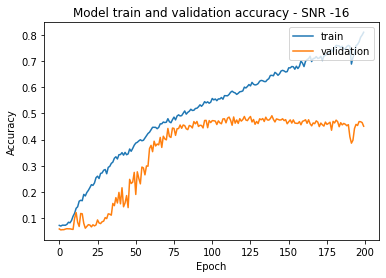

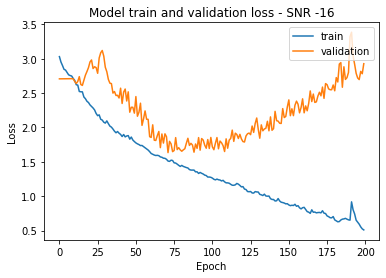


Score of SNR on All SNR model without Transfer Learning -16 = 41.67832136154175

Training SNR = -16 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 6s 277ms/step - loss: 1.7787 - accuracy: 0.6503 - val_loss: 1.6254 - val_accuracy: 0.5921
Epoch 2/200
7/7 [==============================] - 2s 273ms/step - loss: 1.2081 - accuracy: 0.6954 - val_loss: 1.3033 - val_accuracy: 0.6238
Epoch 3/200
7/7 [==============================] - 2s 275ms/step - loss: 1.0265 - accuracy: 0.7010 - val_loss: 1.1894 - val_accuracy: 0.6415
Epoch 4/200
7/7 [==============================] - 2s 277ms/step - loss: 0.9117 - accuracy: 0.7287 - val_loss: 1.1419 - val_accuracy: 0.6597
Epoch 5/200
7/7 [==============================] - 2s 278ms/step - loss: 0.8179 - accuracy: 0.7378 - val_loss: 1.1215 - val_accuracy: 0.6774
Epoch 6/200
7/7 [==============================] - 2s 280ms/step - loss: 0.7639 - accuracy: 0.7601 - val_loss: 1.0815 - val_accuracy: 0.6965
Epoch 7/200
7/7 

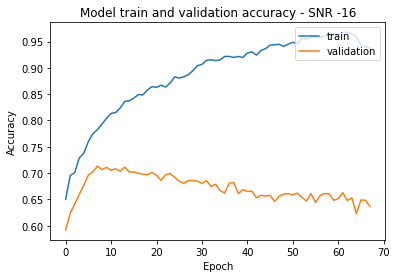

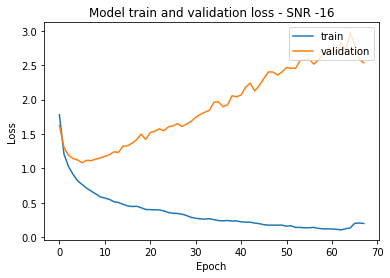

Score of SNR on High SNR model without Transfer Learning -16 = 7.179487496614456

Training SNR = -16 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 6s 277ms/step - loss: 7.4916 - accuracy: 0.1584 - val_loss: 15.3152 - val_accuracy: 0.1483
Epoch 2/200
7/7 [==============================] - 2s 271ms/step - loss: 5.8629 - accuracy: 0.1747 - val_loss: 13.7866 - val_accuracy: 0.1562
Epoch 3/200
7/7 [==============================] - 2s 274ms/step - loss: 4.7280 - accuracy: 0.2138 - val_loss: 10.4089 - val_accuracy: 0.1758
Epoch 4/200
7/7 [==============================] - 2s 276ms/step - loss: 4.0098 - accuracy: 0.2387 - val_loss: 10.7420 - val_accuracy: 0.1967
Epoch 5/200
7/7 [==============================] - 2s 276ms/step - loss: 3.5030 - accuracy: 0.2236 - val_loss: 9.4858 - val_accuracy: 0.1925
Epoch 6/200
7/7 [==============================] - 2s 279ms/step - loss: 3.0989 - accuracy: 0.2491 - val_loss: 9.2316 - val_accuracy: 0.2075
Epoch 7/200

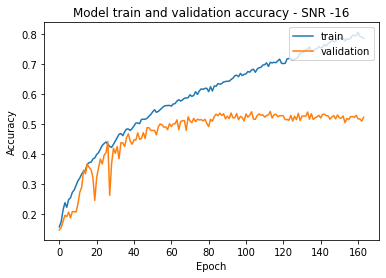

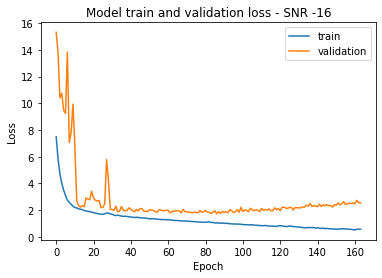

Score of SNR on low SNR model without Transfer Learning -16 = 67.83216595649719

Training SNR = -16 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 6s 278ms/step - loss: 1.2476 - accuracy: 0.6923 - val_loss: 1.2043 - val_accuracy: 0.6676
Epoch 2/200
7/7 [==============================] - 2s 274ms/step - loss: 1.0648 - accuracy: 0.6755 - val_loss: 1.1409 - val_accuracy: 0.6643
Epoch 3/200
7/7 [==============================] - 2s 274ms/step - loss: 0.9489 - accuracy: 0.7051 - val_loss: 1.0653 - val_accuracy: 0.7054
Epoch 4/200
7/7 [==============================] - 2s 276ms/step - loss: 0.8409 - accuracy: 0.7319 - val_loss: 1.1427 - val_accuracy: 0.7002
Epoch 5/200
7/7 [==============================] - 2s 278ms/step - loss: 0.7883 - accuracy: 0.7459 - val_loss: 1.0918 - val_accuracy: 0.7007
Epoch 6/200
7/7 [==============================] - 2s 277ms/step - loss: 0.7256 - accuracy: 0.7632 - val_loss: 1.1425 - val_accuracy: 0.7100
Epoch 7/200
7/7 [

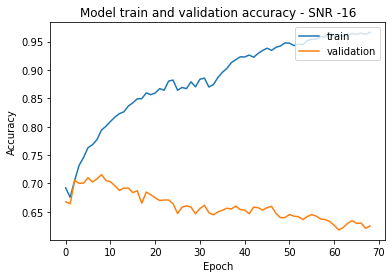

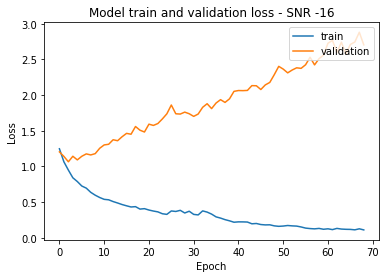

[[ 0.        ]
 [ 0.        ]
 [46.62004709]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]] [[ 0.          0.         41.67832136  0.          0.          0.
   0.          0.          0.          0.        ]
 [ 0.          0.         66.20046496  0.          0.          0.
   0.          0.          0.          0.        ]] [[ 0.          0.          7.1794875   0.          0.          0.
   0.          0.          0.          0.        ]
 [ 0.          0.         52.63403058  0.          0.          0.
   0.          0.          0.          0.        ]] [[ 0.          0.         67.83216596  0.          0.          0.
   0.          0.          0.          0.        ]
 [ 0.          0.         64.75524306  0.          0.          0.
   0.          0.          0.          0.        ]]

Training SNR = -14 Data

Epoch 1/200
7/7 [==============================] - 7s 434ms/step - loss: 3.0599 - accuracy: 0.0639 - val_loss: 2.7082 

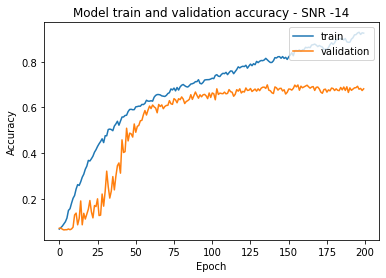

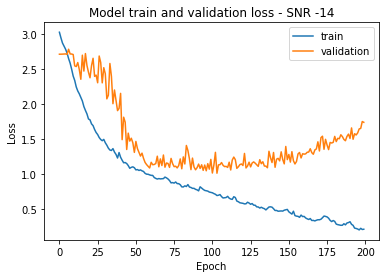


Score of SNR on All SNR model without Transfer Learning -14 = 67.8787887096405

Training SNR = -14 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 6s 275ms/step - loss: 0.8143 - accuracy: 0.8140 - val_loss: 0.7242 - val_accuracy: 0.7855
Epoch 2/200
7/7 [==============================] - 2s 275ms/step - loss: 0.6158 - accuracy: 0.8132 - val_loss: 0.6317 - val_accuracy: 0.7907
Epoch 3/200
7/7 [==============================] - 2s 275ms/step - loss: 0.5421 - accuracy: 0.8180 - val_loss: 0.5686 - val_accuracy: 0.8135
Epoch 4/200
7/7 [==============================] - 2s 277ms/step - loss: 0.4497 - accuracy: 0.8396 - val_loss: 0.5363 - val_accuracy: 0.8298
Epoch 5/200
7/7 [==============================] - 2s 278ms/step - loss: 0.4072 - accuracy: 0.8570 - val_loss: 0.5264 - val_accuracy: 0.8373
Epoch 6/200
7/7 [==============================] - 2s 280ms/step - loss: 0.3756 - accuracy: 0.8646 - val_loss: 0.5236 - val_accuracy: 0.8378
Epoch 7/200
7/7 [

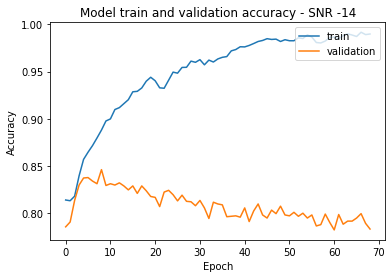

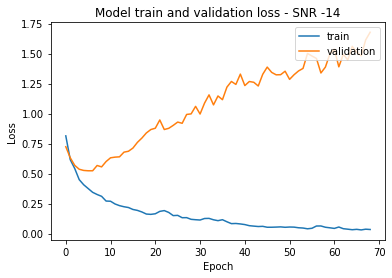

Score of SNR on High SNR model without Transfer Learning -14 = 8.344988524913788

Training SNR = -14 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 6s 277ms/step - loss: 6.2045 - accuracy: 0.2368 - val_loss: 14.1985 - val_accuracy: 0.1776
Epoch 2/200
7/7 [==============================] - 2s 274ms/step - loss: 4.1546 - accuracy: 0.3229 - val_loss: 9.0879 - val_accuracy: 0.3077
Epoch 3/200
7/7 [==============================] - 2s 273ms/step - loss: 3.1103 - accuracy: 0.3905 - val_loss: 7.0738 - val_accuracy: 0.3077
Epoch 4/200
7/7 [==============================] - 2s 275ms/step - loss: 2.5920 - accuracy: 0.3882 - val_loss: 6.1686 - val_accuracy: 0.3343
Epoch 5/200
7/7 [==============================] - 2s 275ms/step - loss: 2.1981 - accuracy: 0.4440 - val_loss: 6.9162 - val_accuracy: 0.3282
Epoch 6/200
7/7 [==============================] - 2s 276ms/step - loss: 1.8943 - accuracy: 0.4695 - val_loss: 5.1505 - val_accuracy: 0.3669
Epoch 7/200
7/

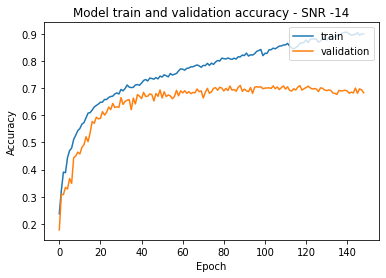

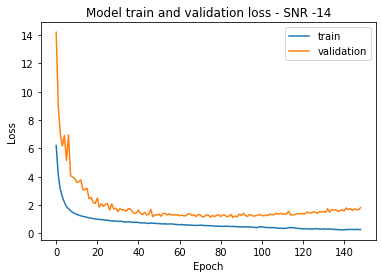

Score of SNR on low SNR model without Transfer Learning -14 = 82.42424130439758

Training SNR = -14 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 6s 277ms/step - loss: 0.6623 - accuracy: 0.8028 - val_loss: 0.6236 - val_accuracy: 0.8149
Epoch 2/200
7/7 [==============================] - 2s 294ms/step - loss: 0.5380 - accuracy: 0.8145 - val_loss: 0.5684 - val_accuracy: 0.8177
Epoch 3/200
7/7 [==============================] - 2s 275ms/step - loss: 0.4813 - accuracy: 0.8297 - val_loss: 0.6058 - val_accuracy: 0.8172
Epoch 4/200
7/7 [==============================] - 2s 279ms/step - loss: 0.4229 - accuracy: 0.8465 - val_loss: 0.6031 - val_accuracy: 0.8154
Epoch 5/200
7/7 [==============================] - 2s 281ms/step - loss: 0.3888 - accuracy: 0.8533 - val_loss: 0.6224 - val_accuracy: 0.8140
Epoch 6/200
7/7 [==============================] - 2s 280ms/step - loss: 0.3631 - accuracy: 0.8648 - val_loss: 0.6184 - val_accuracy: 0.8168
Epoch 7/200
7/7 [

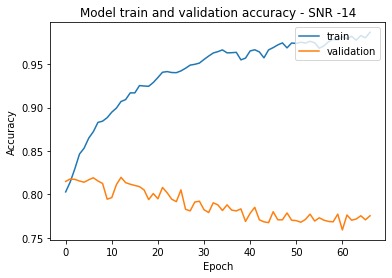

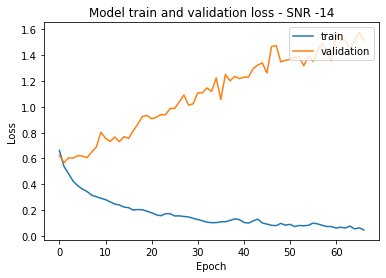

[[ 0.        ]
 [ 0.        ]
 [46.62004709]
 [67.41258502]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]] [[ 0.          0.         41.67832136 67.87878871  0.          0.
   0.          0.          0.          0.        ]
 [ 0.          0.         66.20046496 79.62703705  0.          0.
   0.          0.          0.          0.        ]] [[ 0.          0.          7.1794875   8.34498852  0.          0.
   0.          0.          0.          0.        ]
 [ 0.          0.         52.63403058 69.74359155  0.          0.
   0.          0.          0.          0.        ]] [[ 0.          0.         67.83216596 82.4242413   0.          0.
   0.          0.          0.          0.        ]
 [ 0.          0.         64.75524306 77.94871926  0.          0.
   0.          0.          0.          0.        ]]

Training SNR = -12 Data

Epoch 1/200
7/7 [==============================] - 7s 441ms/step - loss: 3.0379 - accuracy: 0.0779 - val_loss: 2.7065 

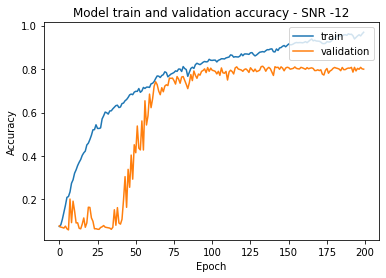

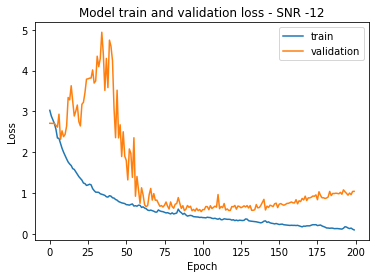


Score of SNR on All SNR model without Transfer Learning -12 = 89.1841471195221

Training SNR = -12 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 6s 279ms/step - loss: 0.3621 - accuracy: 0.8968 - val_loss: 0.3788 - val_accuracy: 0.8848
Epoch 2/200
7/7 [==============================] - 2s 273ms/step - loss: 0.2921 - accuracy: 0.9012 - val_loss: 0.3252 - val_accuracy: 0.8848
Epoch 3/200
7/7 [==============================] - 2s 275ms/step - loss: 0.2426 - accuracy: 0.9114 - val_loss: 0.3039 - val_accuracy: 0.8946
Epoch 4/200
7/7 [==============================] - 2s 277ms/step - loss: 0.2119 - accuracy: 0.9231 - val_loss: 0.3238 - val_accuracy: 0.8900
Epoch 5/200
7/7 [==============================] - 2s 279ms/step - loss: 0.2011 - accuracy: 0.9291 - val_loss: 0.3538 - val_accuracy: 0.8895
Epoch 6/200
7/7 [==============================] - 2s 278ms/step - loss: 0.1814 - accuracy: 0.9354 - val_loss: 0.3371 - val_accuracy: 0.8918
Epoch 7/200
7/7 [

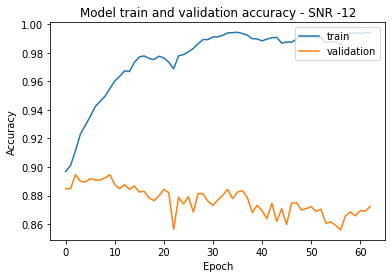

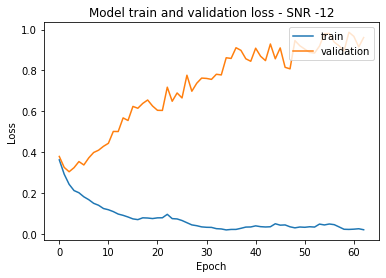

Score of SNR on High SNR model without Transfer Learning -12 = 11.608391255140305

Training SNR = -12 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 6s 278ms/step - loss: 4.6271 - accuracy: 0.3818 - val_loss: 7.4575 - val_accuracy: 0.3632
Epoch 2/200
7/7 [==============================] - 2s 277ms/step - loss: 2.4822 - accuracy: 0.5335 - val_loss: 5.0017 - val_accuracy: 0.4340
Epoch 3/200
7/7 [==============================] - 2s 277ms/step - loss: 1.6827 - accuracy: 0.6048 - val_loss: 4.8891 - val_accuracy: 0.4042
Epoch 4/200
7/7 [==============================] - 2s 278ms/step - loss: 1.3949 - accuracy: 0.6395 - val_loss: 2.9150 - val_accuracy: 0.5431
Epoch 5/200
7/7 [==============================] - 2s 280ms/step - loss: 1.1498 - accuracy: 0.6755 - val_loss: 3.0347 - val_accuracy: 0.5431
Epoch 6/200
7/7 [==============================] - 2s 277ms/step - loss: 1.0358 - accuracy: 0.6915 - val_loss: 2.5673 - val_accuracy: 0.6298
Epoch 7/200
7/

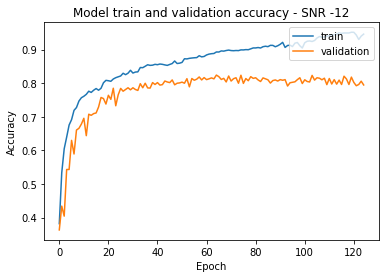

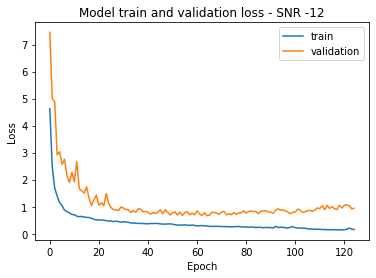

Score of SNR on low SNR model without Transfer Learning -12 = 85.8275055885315

Training SNR = -12 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 5s 278ms/step - loss: 0.3849 - accuracy: 0.8634 - val_loss: 0.3852 - val_accuracy: 0.8671
Epoch 2/200
7/7 [==============================] - 2s 272ms/step - loss: 0.2948 - accuracy: 0.8867 - val_loss: 0.3628 - val_accuracy: 0.8793
Epoch 3/200
7/7 [==============================] - 2s 273ms/step - loss: 0.2644 - accuracy: 0.8984 - val_loss: 0.3501 - val_accuracy: 0.8830
Epoch 4/200
7/7 [==============================] - 2s 275ms/step - loss: 0.2359 - accuracy: 0.9085 - val_loss: 0.3572 - val_accuracy: 0.8890
Epoch 5/200
7/7 [==============================] - 2s 274ms/step - loss: 0.2125 - accuracy: 0.9184 - val_loss: 0.3729 - val_accuracy: 0.8862
Epoch 6/200
7/7 [==============================] - 2s 277ms/step - loss: 0.1952 - accuracy: 0.9215 - val_loss: 0.3735 - val_accuracy: 0.8844
Epoch 7/200
7/7 [=

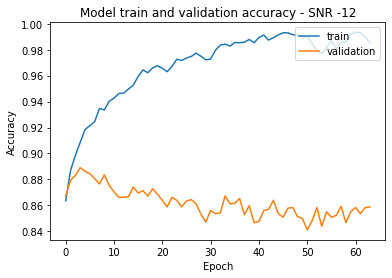

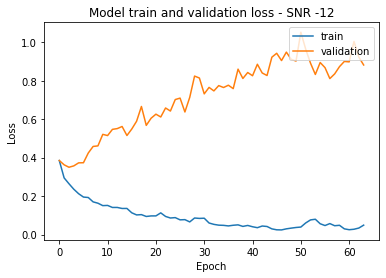

[[ 0.        ]
 [ 0.        ]
 [46.62004709]
 [67.41258502]
 [80.65267801]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]] [[ 0.          0.         41.67832136 67.87878871 89.18414712  0.
   0.          0.          0.          0.        ]
 [ 0.          0.         66.20046496 79.62703705 87.97202706  0.
   0.          0.          0.          0.        ]] [[ 0.          0.          7.1794875   8.34498852 11.60839126  0.
   0.          0.          0.          0.        ]
 [ 0.          0.         52.63403058 69.74359155 81.258744    0.
   0.          0.          0.          0.        ]] [[ 0.          0.         67.83216596 82.4242413  85.82750559  0.
   0.          0.          0.          0.        ]
 [ 0.          0.         64.75524306 77.94871926 84.94172692  0.
   0.          0.          0.          0.        ]]


In [ ]:
for i in range(2, 5):

  x_data_iq_curr = np.reshape(x_data_iq_data[:,i], (x_dim[0]*x_dim[2], x_dim[3], x_dim[4]))
  x_data_iq_curr = normalize(x_data_iq_curr)
  y_data_iq_curr = to_categorical(y_labels_data[:,i].flatten())

  X_train_curr, X_test_valid_curr, Y_train_curr, Y_test_valid_curr = train_test_split(x_data_iq_curr, y_data_iq_curr, test_size=0.4)
  X_validation_curr, X_test_curr, Y_validation_curr, Y_test_curr = train_test_split(X_test_valid_curr, Y_test_valid_curr, test_size=0.5)

  scores_without_tf_2d[i] = train_data_2D(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)
  scores_tf_allsnr_2d[:,i] = train_data_on_all_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, model_folder_all, i)
  scores_tf_highsnr_2d[:,i] = train_data_on_high_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, model_folder_high, i)
  scores_tf_lowsnr_2d[:,i] = train_data_on_low_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, model_folder_low, i)

  print(scores_without_tf_2d, scores_tf_allsnr_2d, scores_tf_highsnr_2d, scores_tf_lowsnr_2d)


Training SNR = -10 Data

Epoch 1/200
7/7 [==============================] - 7s 431ms/step - loss: 3.0779 - accuracy: 0.0730 - val_loss: 2.7072 - val_accuracy: 0.0671
Epoch 2/200
7/7 [==============================] - 2s 271ms/step - loss: 2.9105 - accuracy: 0.0937 - val_loss: 2.7068 - val_accuracy: 0.0634
Epoch 3/200
7/7 [==============================] - 2s 272ms/step - loss: 2.7912 - accuracy: 0.1266 - val_loss: 2.7063 - val_accuracy: 0.0676
Epoch 4/200
7/7 [==============================] - 2s 271ms/step - loss: 2.6419 - accuracy: 0.1575 - val_loss: 2.6980 - val_accuracy: 0.0555
Epoch 5/200
7/7 [==============================] - 2s 272ms/step - loss: 2.4174 - accuracy: 0.2069 - val_loss: 2.5182 - val_accuracy: 0.1935
Epoch 6/200
7/7 [==============================] - 2s 271ms/step - loss: 2.2217 - accuracy: 0.2488 - val_loss: 2.4420 - val_accuracy: 0.1562
Epoch 7/200
7/7 [==============================] - 2s 274ms/step - loss: 2.0166 - accuracy: 0.3008 - val_loss: 2.4565 - val_accu

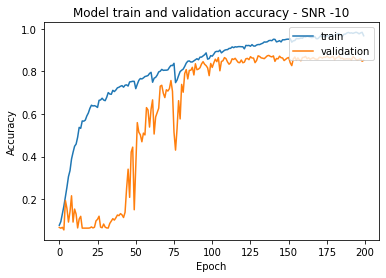

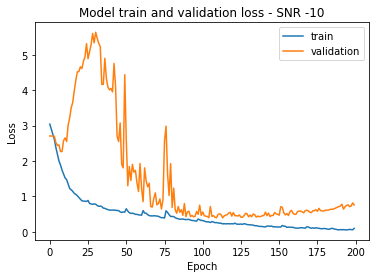


Score of SNR on All SNR model without Transfer Learning -10 = 93.84615421295166

Training SNR = -10 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 6s 276ms/step - loss: 0.2368 - accuracy: 0.9220 - val_loss: 0.2342 - val_accuracy: 0.9193
Epoch 2/200
7/7 [==============================] - 2s 275ms/step - loss: 0.1734 - accuracy: 0.9352 - val_loss: 0.2053 - val_accuracy: 0.9235
Epoch 3/200
7/7 [==============================] - 2s 274ms/step - loss: 0.1480 - accuracy: 0.9413 - val_loss: 0.1953 - val_accuracy: 0.9347
Epoch 4/200
7/7 [==============================] - 2s 276ms/step - loss: 0.1345 - accuracy: 0.9493 - val_loss: 0.2337 - val_accuracy: 0.9184
Epoch 5/200
7/7 [==============================] - 2s 278ms/step - loss: 0.1254 - accuracy: 0.9566 - val_loss: 0.2144 - val_accuracy: 0.9277
Epoch 6/200
7/7 [==============================] - 2s 277ms/step - loss: 0.1063 - accuracy: 0.9608 - val_loss: 0.2264 - val_accuracy: 0.9291
Epoch 7/200
7/7 

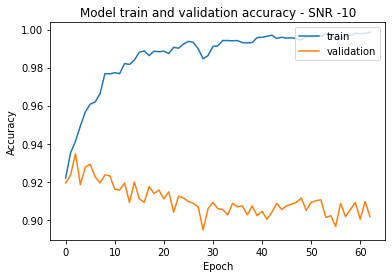

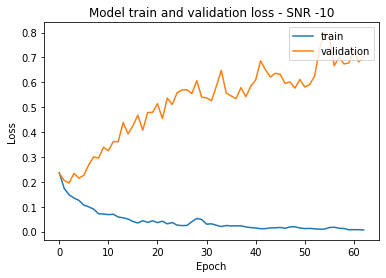

Score of SNR on High SNR model without Transfer Learning -10 = 21.86480164527893

Training SNR = -10 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 6s 279ms/step - loss: 2.7663 - accuracy: 0.6037 - val_loss: 2.8404 - val_accuracy: 0.6834
Epoch 2/200
7/7 [==============================] - 2s 274ms/step - loss: 1.2650 - accuracy: 0.7517 - val_loss: 3.3486 - val_accuracy: 0.5981
Epoch 3/200
7/7 [==============================] - 2s 276ms/step - loss: 0.7706 - accuracy: 0.7899 - val_loss: 1.9341 - val_accuracy: 0.7072
Epoch 4/200
7/7 [==============================] - 2s 276ms/step - loss: 0.6414 - accuracy: 0.8062 - val_loss: 1.9393 - val_accuracy: 0.7315
Epoch 5/200
7/7 [==============================] - 2s 277ms/step - loss: 0.5609 - accuracy: 0.8333 - val_loss: 2.2844 - val_accuracy: 0.7291
Epoch 6/200
7/7 [==============================] - 2s 278ms/step - loss: 0.5062 - accuracy: 0.8379 - val_loss: 1.9541 - val_accuracy: 0.7403
Epoch 7/200
7/7

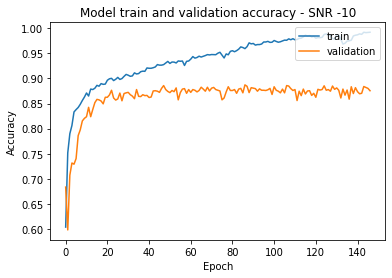

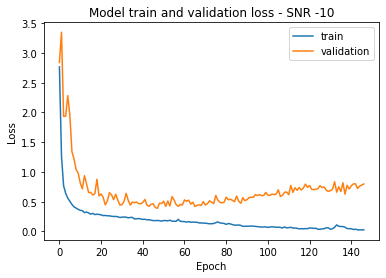

Score of SNR on low SNR model without Transfer Learning -10 = 87.50582933425903

Training SNR = -10 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 5s 275ms/step - loss: 0.2744 - accuracy: 0.8922 - val_loss: 0.2278 - val_accuracy: 0.9096
Epoch 2/200
7/7 [==============================] - 2s 275ms/step - loss: 0.2186 - accuracy: 0.9072 - val_loss: 0.2847 - val_accuracy: 0.9026
Epoch 3/200
7/7 [==============================] - 2s 275ms/step - loss: 0.1875 - accuracy: 0.9223 - val_loss: 0.2638 - val_accuracy: 0.9026
Epoch 4/200
7/7 [==============================] - 2s 275ms/step - loss: 0.1819 - accuracy: 0.9218 - val_loss: 0.2801 - val_accuracy: 0.9030
Epoch 5/200
7/7 [==============================] - 2s 277ms/step - loss: 0.1717 - accuracy: 0.9274 - val_loss: 0.2715 - val_accuracy: 0.9114
Epoch 6/200
7/7 [==============================] - 2s 276ms/step - loss: 0.1584 - accuracy: 0.9363 - val_loss: 0.2808 - val_accuracy: 0.9124
Epoch 7/200
7/7 [

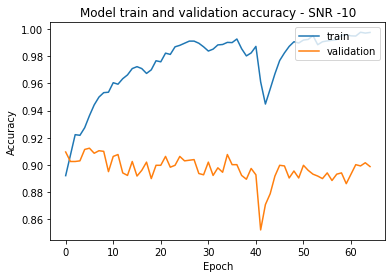

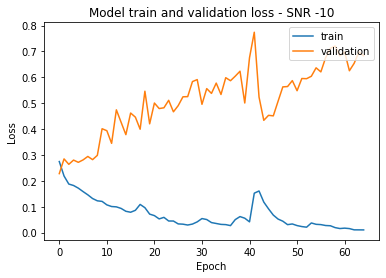

[[ 0.        ]
 [ 0.        ]
 [46.62004709]
 [67.41258502]
 [80.65267801]
 [86.80652976]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]] [[ 0.          0.         41.67832136 67.87878871 89.18414712 93.84615421
   0.          0.          0.          0.        ]
 [ 0.          0.         66.20046496 79.62703705 87.97202706 91.51515365
   0.          0.          0.          0.        ]] [[ 0.          0.          7.1794875   8.34498852 11.60839126 21.86480165
   0.          0.          0.          0.        ]
 [ 0.          0.         52.63403058 69.74359155 81.258744   87.83217072
   0.          0.          0.          0.        ]] [[ 0.          0.         67.83216596 82.4242413  85.82750559 87.50582933
   0.          0.          0.          0.        ]
 [ 0.          0.         64.75524306 77.94871926 84.94172692 90.25641084
   0.          0.          0.          0.        ]]

Training SNR = -8 Data

Epoch 1/200
7/7 [==============================] - 7s 440ms/step - loss

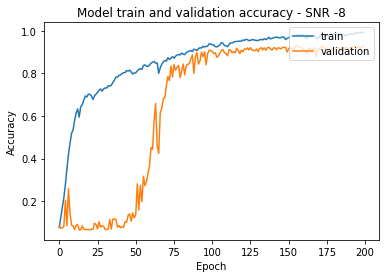

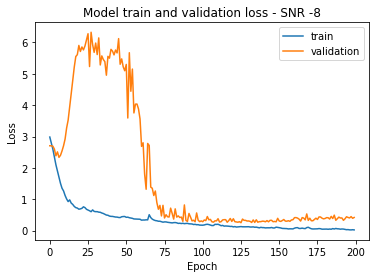


Score of SNR on All SNR model without Transfer Learning -8 = 94.21911239624023

Training SNR = -8 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 6s 277ms/step - loss: 0.1619 - accuracy: 0.9442 - val_loss: 0.1216 - val_accuracy: 0.9548
Epoch 2/200
7/7 [==============================] - 2s 276ms/step - loss: 0.1372 - accuracy: 0.9497 - val_loss: 0.1167 - val_accuracy: 0.9594
Epoch 3/200
7/7 [==============================] - 2s 277ms/step - loss: 0.1103 - accuracy: 0.9584 - val_loss: 0.1252 - val_accuracy: 0.9566
Epoch 4/200
7/7 [==============================] - 2s 277ms/step - loss: 0.0857 - accuracy: 0.9695 - val_loss: 0.1205 - val_accuracy: 0.9608
Epoch 5/200
7/7 [==============================] - 2s 279ms/step - loss: 0.0734 - accuracy: 0.9730 - val_loss: 0.1399 - val_accuracy: 0.9590
Epoch 6/200
7/7 [==============================] - 2s 281ms/step - loss: 0.0630 - accuracy: 0.9779 - val_loss: 0.1572 - val_accuracy: 0.9557
Epoch 7/200
7/7 [=

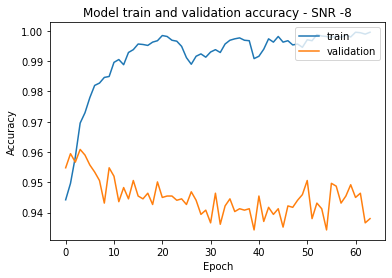

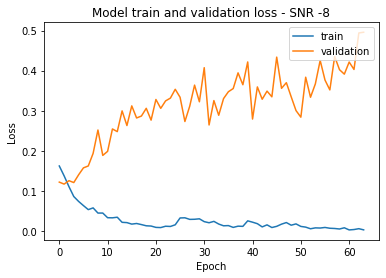

Score of SNR on High SNR model without Transfer Learning -8 = 44.988346099853516

Training SNR = -8 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 6s 279ms/step - loss: 1.3390 - accuracy: 0.7994 - val_loss: 1.6762 - val_accuracy: 0.7991
Epoch 2/200
7/7 [==============================] - 2s 274ms/step - loss: 0.5723 - accuracy: 0.8690 - val_loss: 1.0924 - val_accuracy: 0.8340
Epoch 3/200
7/7 [==============================] - 2s 278ms/step - loss: 0.3939 - accuracy: 0.8872 - val_loss: 0.6909 - val_accuracy: 0.8480
Epoch 4/200
7/7 [==============================] - 2s 279ms/step - loss: 0.3311 - accuracy: 0.8968 - val_loss: 0.5916 - val_accuracy: 0.8713
Epoch 5/200
7/7 [==============================] - 2s 279ms/step - loss: 0.2714 - accuracy: 0.9116 - val_loss: 0.5686 - val_accuracy: 0.8811
Epoch 6/200
7/7 [==============================] - 2s 280ms/step - loss: 0.2232 - accuracy: 0.9235 - val_loss: 0.5663 - val_accuracy: 0.8923
Epoch 7/200
7/7 

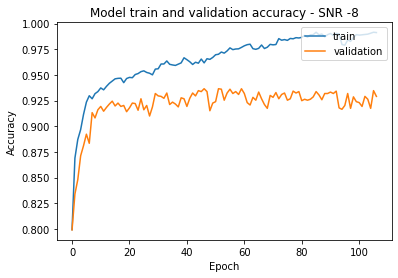

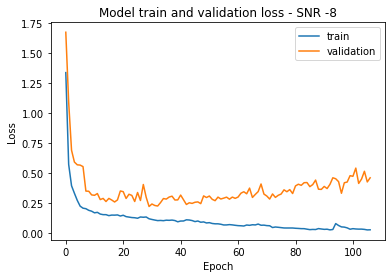

Score of SNR on low SNR model without Transfer Learning -8 = 87.78554797172546

Training SNR = -8 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 6s 280ms/step - loss: 0.2017 - accuracy: 0.9193 - val_loss: 0.2343 - val_accuracy: 0.9198
Epoch 2/200
7/7 [==============================] - 2s 278ms/step - loss: 0.1477 - accuracy: 0.9394 - val_loss: 0.1796 - val_accuracy: 0.9394
Epoch 3/200
7/7 [==============================] - 2s 278ms/step - loss: 0.1306 - accuracy: 0.9497 - val_loss: 0.2358 - val_accuracy: 0.9231
Epoch 4/200
7/7 [==============================] - 2s 279ms/step - loss: 0.1179 - accuracy: 0.9545 - val_loss: 0.1832 - val_accuracy: 0.9385
Epoch 5/200
7/7 [==============================] - 2s 281ms/step - loss: 0.1083 - accuracy: 0.9582 - val_loss: 0.2128 - val_accuracy: 0.9352
Epoch 6/200
7/7 [==============================] - 2s 279ms/step - loss: 0.0985 - accuracy: 0.9638 - val_loss: 0.2034 - val_accuracy: 0.9408
Epoch 7/200
7/7 [==

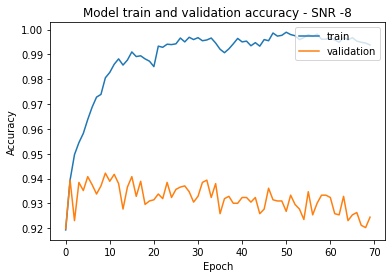

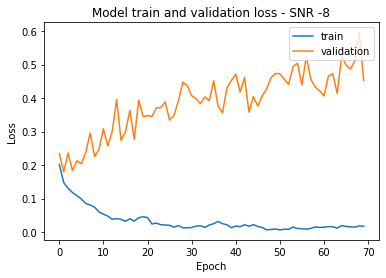

[[ 0.        ]
 [ 0.        ]
 [46.62004709]
 [67.41258502]
 [80.65267801]
 [86.80652976]
 [92.86713004]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]] [[ 0.          0.         41.67832136 67.87878871 89.18414712 93.84615421
  94.2191124   0.          0.          0.        ]
 [ 0.          0.         66.20046496 79.62703705 87.97202706 91.51515365
  94.07925606  0.          0.          0.        ]] [[ 0.          0.          7.1794875   8.34498852 11.60839126 21.86480165
  44.9883461   0.          0.          0.        ]
 [ 0.          0.         52.63403058 69.74359155 81.258744   87.83217072
  93.37995052  0.          0.          0.        ]] [[ 0.          0.         67.83216596 82.4242413  85.82750559 87.50582933
  87.78554797  0.          0.          0.        ]
 [ 0.          0.         64.75524306 77.94871926 84.94172692 90.25641084
  92.26107001  0.          0.          0.        ]]


In [ ]:
for i in range(5, 7):

  x_data_iq_curr = np.reshape(x_data_iq_data[:,i], (x_dim[0]*x_dim[2], x_dim[3], x_dim[4]))
  x_data_iq_curr = normalize(x_data_iq_curr)
  y_data_iq_curr = to_categorical(y_labels_data[:,i].flatten())

  X_train_curr, X_test_valid_curr, Y_train_curr, Y_test_valid_curr = train_test_split(x_data_iq_curr, y_data_iq_curr, test_size=0.4)
  X_validation_curr, X_test_curr, Y_validation_curr, Y_test_curr = train_test_split(X_test_valid_curr, Y_test_valid_curr, test_size=0.5)

  scores_without_tf_2d[i] = train_data_2D(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)
  scores_tf_allsnr_2d[:,i] = train_data_on_all_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, model_folder_all, i)
  scores_tf_highsnr_2d[:,i] = train_data_on_high_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, model_folder_high, i)
  scores_tf_lowsnr_2d[:,i] = train_data_on_low_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, model_folder_low, i)

  print(scores_without_tf_2d, scores_tf_allsnr_2d, scores_tf_highsnr_2d, scores_tf_lowsnr_2d)


Training SNR = -6 Data

Epoch 1/200
7/7 [==============================] - 8s 450ms/step - loss: 3.0499 - accuracy: 0.0769 - val_loss: 2.7041 - val_accuracy: 0.0723
Epoch 2/200
7/7 [==============================] - 2s 292ms/step - loss: 2.7136 - accuracy: 0.1429 - val_loss: 2.7017 - val_accuracy: 0.0629
Epoch 3/200
7/7 [==============================] - 2s 274ms/step - loss: 2.4520 - accuracy: 0.1959 - val_loss: 2.6849 - val_accuracy: 0.0648
Epoch 4/200
7/7 [==============================] - 2s 273ms/step - loss: 2.1617 - accuracy: 0.2563 - val_loss: 2.5276 - val_accuracy: 0.2000
Epoch 5/200
7/7 [==============================] - 2s 275ms/step - loss: 1.8952 - accuracy: 0.3427 - val_loss: 2.4491 - val_accuracy: 0.1869
Epoch 6/200
7/7 [==============================] - 2s 274ms/step - loss: 1.6953 - accuracy: 0.3994 - val_loss: 2.5534 - val_accuracy: 0.1319
Epoch 7/200
7/7 [==============================] - 2s 277ms/step - loss: 1.4581 - accuracy: 0.4735 - val_loss: 2.4579 - val_accur

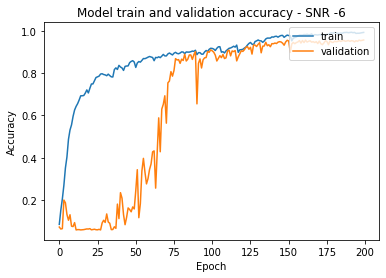

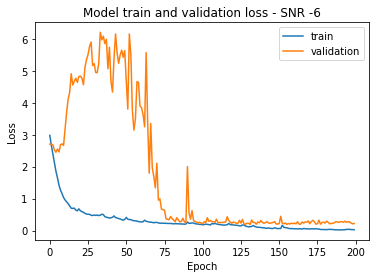


Score of SNR on All SNR model without Transfer Learning -6 = 94.91841197013855

Training SNR = -6 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 6s 277ms/step - loss: 0.1236 - accuracy: 0.9556 - val_loss: 0.0837 - val_accuracy: 0.9692
Epoch 2/200
7/7 [==============================] - 2s 275ms/step - loss: 0.0921 - accuracy: 0.9658 - val_loss: 0.0996 - val_accuracy: 0.9646
Epoch 3/200
7/7 [==============================] - 2s 275ms/step - loss: 0.0773 - accuracy: 0.9691 - val_loss: 0.1195 - val_accuracy: 0.9622
Epoch 4/200
7/7 [==============================] - 2s 275ms/step - loss: 0.0562 - accuracy: 0.9815 - val_loss: 0.1117 - val_accuracy: 0.9664
Epoch 5/200
7/7 [==============================] - 2s 278ms/step - loss: 0.0448 - accuracy: 0.9860 - val_loss: 0.1524 - val_accuracy: 0.9594
Epoch 6/200
7/7 [==============================] - 2s 279ms/step - loss: 0.0422 - accuracy: 0.9859 - val_loss: 0.1309 - val_accuracy: 0.9688
Epoch 7/200
7/7 [=

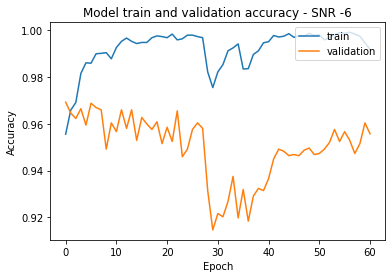

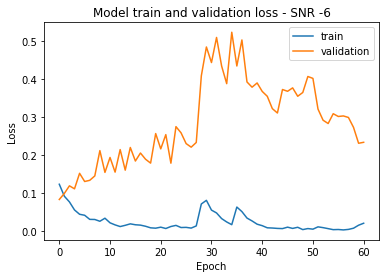

Score of SNR on High SNR model without Transfer Learning -6 = 75.24475455284119

Training SNR = -6 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 6s 280ms/step - loss: 0.6054 - accuracy: 0.9078 - val_loss: 0.7198 - val_accuracy: 0.8932
Epoch 2/200
7/7 [==============================] - 2s 275ms/step - loss: 0.2989 - accuracy: 0.9308 - val_loss: 0.5209 - val_accuracy: 0.9035
Epoch 3/200
7/7 [==============================] - 2s 275ms/step - loss: 0.1841 - accuracy: 0.9400 - val_loss: 0.3825 - val_accuracy: 0.9110
Epoch 4/200
7/7 [==============================] - 2s 275ms/step - loss: 0.1488 - accuracy: 0.9483 - val_loss: 0.3022 - val_accuracy: 0.9189
Epoch 5/200
7/7 [==============================] - 2s 278ms/step - loss: 0.1283 - accuracy: 0.9510 - val_loss: 0.2535 - val_accuracy: 0.9315
Epoch 6/200
7/7 [==============================] - 2s 278ms/step - loss: 0.1250 - accuracy: 0.9570 - val_loss: 0.2200 - val_accuracy: 0.9394
Epoch 7/200
7/7 [

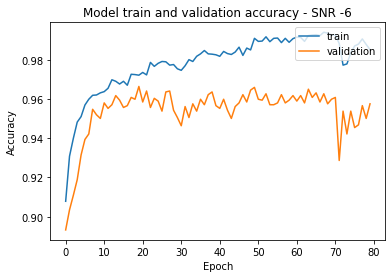

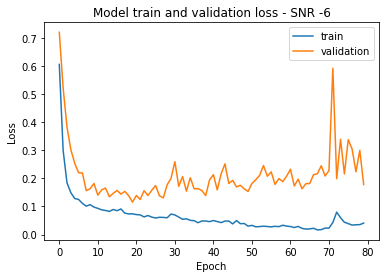

Score of SNR on low SNR model without Transfer Learning -6 = 88.76456618309021

Training SNR = -6 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 6s 278ms/step - loss: 0.1622 - accuracy: 0.9360 - val_loss: 0.1499 - val_accuracy: 0.9450
Epoch 2/200
7/7 [==============================] - 2s 273ms/step - loss: 0.1189 - accuracy: 0.9524 - val_loss: 0.1560 - val_accuracy: 0.9487
Epoch 3/200
7/7 [==============================] - 2s 277ms/step - loss: 0.0995 - accuracy: 0.9627 - val_loss: 0.1291 - val_accuracy: 0.9599
Epoch 4/200
7/7 [==============================] - 2s 278ms/step - loss: 0.0894 - accuracy: 0.9692 - val_loss: 0.1239 - val_accuracy: 0.9641
Epoch 5/200
7/7 [==============================] - 2s 277ms/step - loss: 0.0721 - accuracy: 0.9761 - val_loss: 0.1110 - val_accuracy: 0.9660
Epoch 6/200
7/7 [==============================] - 2s 278ms/step - loss: 0.0627 - accuracy: 0.9778 - val_loss: 0.1112 - val_accuracy: 0.9655
Epoch 7/200
7/7 [==

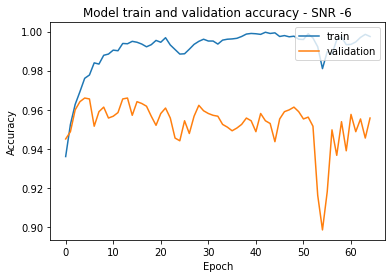

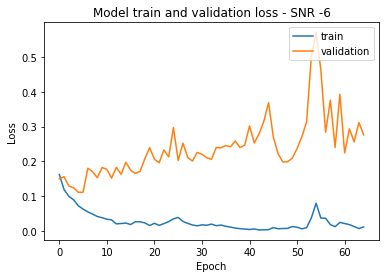

[[ 0.        ]
 [ 0.        ]
 [46.62004709]
 [67.41258502]
 [80.65267801]
 [86.80652976]
 [92.86713004]
 [95.52447796]
 [ 0.        ]
 [ 0.        ]] [[ 0.          0.         41.67832136 67.87878871 89.18414712 93.84615421
  94.2191124  94.91841197  0.          0.        ]
 [ 0.          0.         66.20046496 79.62703705 87.97202706 91.51515365
  94.07925606 96.27039433  0.          0.        ]] [[ 0.          0.          7.1794875   8.34498852 11.60839126 21.86480165
  44.9883461  75.24475455  0.          0.        ]
 [ 0.          0.         52.63403058 69.74359155 81.258744   87.83217072
  93.37995052 96.17715478  0.          0.        ]] [[ 0.          0.         67.83216596 82.4242413  85.82750559 87.50582933
  87.78554797 88.76456618  0.          0.        ]
 [ 0.          0.         64.75524306 77.94871926 84.94172692 90.25641084
  92.26107001 95.6177175   0.          0.        ]]

Training SNR = -4 Data

Epoch 1/200
7/7 [==============================] - 7s 442ms/step - loss

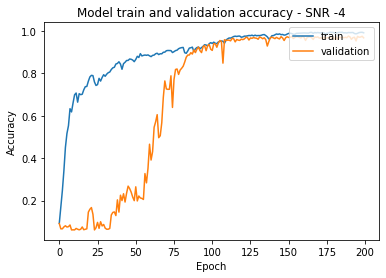

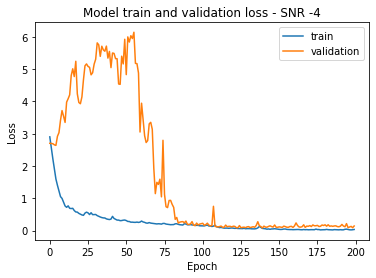


Score of SNR on All SNR model without Transfer Learning -4 = 96.22377753257751

Training SNR = -4 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 6s 278ms/step - loss: 0.0906 - accuracy: 0.9681 - val_loss: 0.0614 - val_accuracy: 0.9762
Epoch 2/200
7/7 [==============================] - 2s 276ms/step - loss: 0.0589 - accuracy: 0.9826 - val_loss: 0.0430 - val_accuracy: 0.9855
Epoch 3/200
7/7 [==============================] - 2s 275ms/step - loss: 0.0370 - accuracy: 0.9873 - val_loss: 0.0775 - val_accuracy: 0.9758
Epoch 4/200
7/7 [==============================] - 2s 276ms/step - loss: 0.0332 - accuracy: 0.9894 - val_loss: 0.0834 - val_accuracy: 0.9753
Epoch 5/200
7/7 [==============================] - 2s 274ms/step - loss: 0.0280 - accuracy: 0.9899 - val_loss: 0.0896 - val_accuracy: 0.9786
Epoch 6/200
7/7 [==============================] - 2s 277ms/step - loss: 0.0206 - accuracy: 0.9935 - val_loss: 0.0619 - val_accuracy: 0.9841
Epoch 7/200
7/7 [=

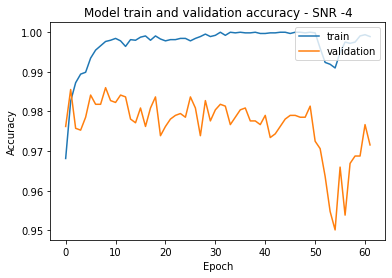

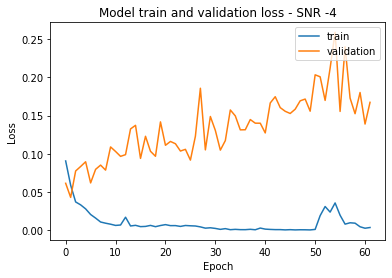

Score of SNR on High SNR model without Transfer Learning -4 = 93.61305236816406

Training SNR = -4 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 6s 278ms/step - loss: 0.1717 - accuracy: 0.9666 - val_loss: 0.1134 - val_accuracy: 0.9776
Epoch 2/200
7/7 [==============================] - 2s 274ms/step - loss: 0.0942 - accuracy: 0.9722 - val_loss: 0.0862 - val_accuracy: 0.9800
Epoch 3/200
7/7 [==============================] - 2s 276ms/step - loss: 0.0744 - accuracy: 0.9740 - val_loss: 0.0785 - val_accuracy: 0.9809
Epoch 4/200
7/7 [==============================] - 2s 278ms/step - loss: 0.0575 - accuracy: 0.9786 - val_loss: 0.0905 - val_accuracy: 0.9781
Epoch 5/200
7/7 [==============================] - 2s 278ms/step - loss: 0.0594 - accuracy: 0.9789 - val_loss: 0.1224 - val_accuracy: 0.9739
Epoch 6/200
7/7 [==============================] - 2s 278ms/step - loss: 0.0537 - accuracy: 0.9824 - val_loss: 0.0776 - val_accuracy: 0.9814
Epoch 7/200
7/7 [

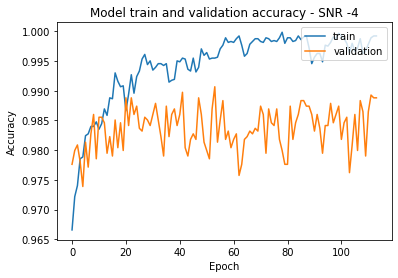

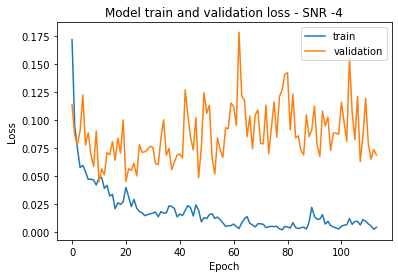

Score of SNR on low SNR model without Transfer Learning -4 = 86.89976930618286

Training SNR = -4 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 5s 279ms/step - loss: 0.1356 - accuracy: 0.9514 - val_loss: 0.0873 - val_accuracy: 0.9711
Epoch 2/200
7/7 [==============================] - 2s 275ms/step - loss: 0.0923 - accuracy: 0.9680 - val_loss: 0.0896 - val_accuracy: 0.9772
Epoch 3/200
7/7 [==============================] - 2s 278ms/step - loss: 0.0667 - accuracy: 0.9784 - val_loss: 0.0891 - val_accuracy: 0.9767
Epoch 4/200
7/7 [==============================] - 2s 276ms/step - loss: 0.0536 - accuracy: 0.9826 - val_loss: 0.0875 - val_accuracy: 0.9753
Epoch 5/200
7/7 [==============================] - 2s 279ms/step - loss: 0.0584 - accuracy: 0.9798 - val_loss: 0.0592 - val_accuracy: 0.9828
Epoch 6/200
7/7 [==============================] - 2s 281ms/step - loss: 0.0404 - accuracy: 0.9877 - val_loss: 0.0826 - val_accuracy: 0.9781
Epoch 7/200
7/7 [==

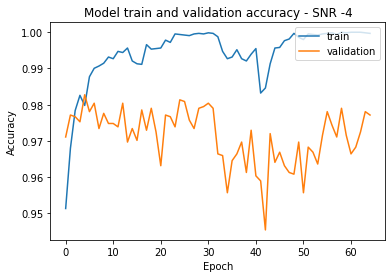

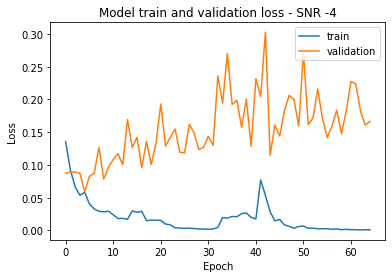

[[ 0.        ]
 [ 0.        ]
 [46.62004709]
 [67.41258502]
 [80.65267801]
 [86.80652976]
 [92.86713004]
 [95.52447796]
 [96.36363387]
 [ 0.        ]] [[ 0.          0.         41.67832136 67.87878871 89.18414712 93.84615421
  94.2191124  94.91841197 96.22377753  0.        ]
 [ 0.          0.         66.20046496 79.62703705 87.97202706 91.51515365
  94.07925606 96.27039433 96.31701708  0.        ]] [[ 0.          0.          7.1794875   8.34498852 11.60839126 21.86480165
  44.9883461  75.24475455 93.61305237  0.        ]
 [ 0.          0.         52.63403058 69.74359155 81.258744   87.83217072
  93.37995052 96.17715478 98.04195762  0.        ]] [[ 0.          0.         67.83216596 82.4242413  85.82750559 87.50582933
  87.78554797 88.76456618 86.89976931  0.        ]
 [ 0.          0.         64.75524306 77.94871926 84.94172692 90.25641084
  92.26107001 95.6177175  96.78321481  0.        ]]

Training SNR = -2 Data

Epoch 1/200
7/7 [==============================] - 7s 442ms/step - loss

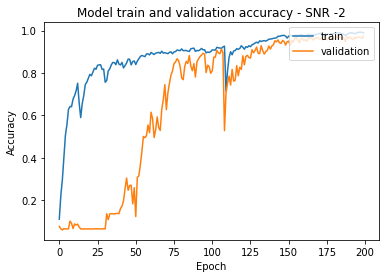

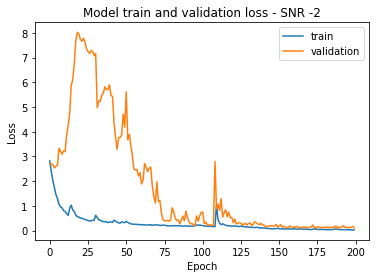


Score of SNR on All SNR model without Transfer Learning -2 = 96.13053798675537

Training SNR = -2 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 6s 277ms/step - loss: 0.0698 - accuracy: 0.9758 - val_loss: 0.0442 - val_accuracy: 0.9855
Epoch 2/200
7/7 [==============================] - 2s 274ms/step - loss: 0.0339 - accuracy: 0.9896 - val_loss: 0.0379 - val_accuracy: 0.9888
Epoch 3/200
7/7 [==============================] - 2s 278ms/step - loss: 0.0167 - accuracy: 0.9947 - val_loss: 0.0390 - val_accuracy: 0.9888
Epoch 4/200
7/7 [==============================] - 2s 277ms/step - loss: 0.0138 - accuracy: 0.9947 - val_loss: 0.0439 - val_accuracy: 0.9893
Epoch 5/200
7/7 [==============================] - 2s 277ms/step - loss: 0.0077 - accuracy: 0.9984 - val_loss: 0.0397 - val_accuracy: 0.9911
Epoch 6/200
7/7 [==============================] - 2s 279ms/step - loss: 0.0064 - accuracy: 0.9983 - val_loss: 0.0472 - val_accuracy: 0.9916
Epoch 7/200
7/7 [=

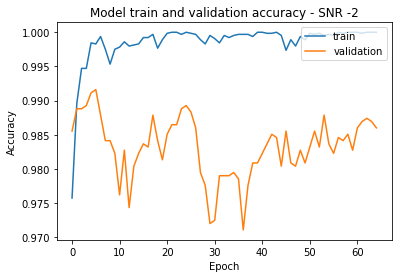

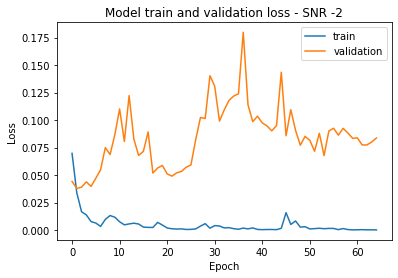

Score of SNR on High SNR model without Transfer Learning -2 = 98.27505946159363

Training SNR = -2 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 6s 278ms/step - loss: 0.0526 - accuracy: 0.9901 - val_loss: 0.1065 - val_accuracy: 0.9795
Epoch 2/200
7/7 [==============================] - 2s 275ms/step - loss: 0.0329 - accuracy: 0.9899 - val_loss: 0.0387 - val_accuracy: 0.9897
Epoch 3/200
7/7 [==============================] - 2s 275ms/step - loss: 0.0444 - accuracy: 0.9891 - val_loss: 0.1651 - val_accuracy: 0.9688
Epoch 4/200
7/7 [==============================] - 2s 278ms/step - loss: 0.0319 - accuracy: 0.9907 - val_loss: 0.0681 - val_accuracy: 0.9814
Epoch 5/200
7/7 [==============================] - 2s 279ms/step - loss: 0.0295 - accuracy: 0.9927 - val_loss: 0.1326 - val_accuracy: 0.9753
Epoch 6/200
7/7 [==============================] - 2s 278ms/step - loss: 0.0240 - accuracy: 0.9924 - val_loss: 0.0978 - val_accuracy: 0.9800
Epoch 7/200
7/7 [

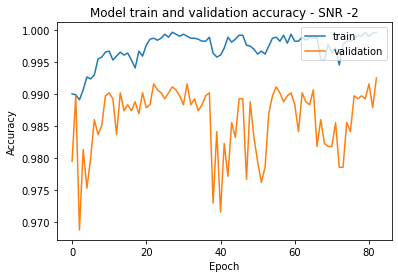

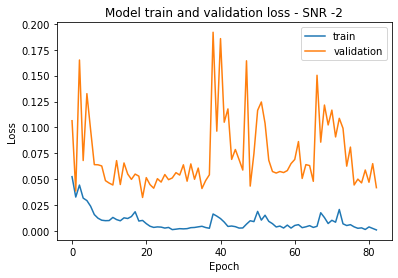

Score of SNR on low SNR model without Transfer Learning -2 = 86.80652976036072

Training SNR = -2 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 6s 273ms/step - loss: 0.1104 - accuracy: 0.9632 - val_loss: 0.1278 - val_accuracy: 0.9683
Epoch 2/200
7/7 [==============================] - 2s 270ms/step - loss: 0.0695 - accuracy: 0.9756 - val_loss: 0.0861 - val_accuracy: 0.9776
Epoch 3/200
7/7 [==============================] - 2s 270ms/step - loss: 0.0421 - accuracy: 0.9855 - val_loss: 0.0737 - val_accuracy: 0.9823
Epoch 4/200
7/7 [==============================] - 2s 272ms/step - loss: 0.0375 - accuracy: 0.9869 - val_loss: 0.0638 - val_accuracy: 0.9814
Epoch 5/200
7/7 [==============================] - 2s 273ms/step - loss: 0.0287 - accuracy: 0.9916 - val_loss: 0.0843 - val_accuracy: 0.9790
Epoch 6/200
7/7 [==============================] - 2s 272ms/step - loss: 0.0234 - accuracy: 0.9911 - val_loss: 0.0618 - val_accuracy: 0.9832
Epoch 7/200
7/7 [==

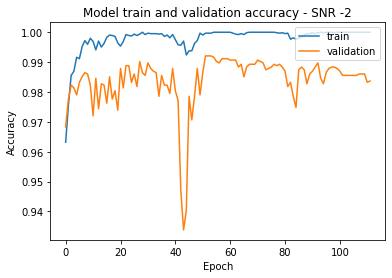

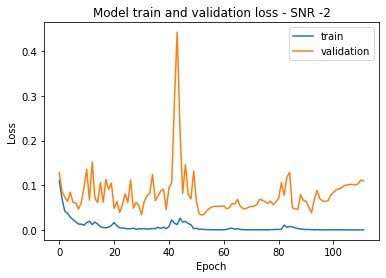

[[ 0.        ]
 [ 0.        ]
 [46.62004709]
 [67.41258502]
 [80.65267801]
 [86.80652976]
 [92.86713004]
 [95.52447796]
 [96.36363387]
 [97.15617895]] [[ 0.          0.         41.67832136 67.87878871 89.18414712 93.84615421
  94.2191124  94.91841197 96.22377753 96.13053799]
 [ 0.          0.         66.20046496 79.62703705 87.97202706 91.51515365
  94.07925606 96.27039433 96.31701708 98.64801764]] [[ 0.          0.          7.1794875   8.34498852 11.60839126 21.86480165
  44.9883461  75.24475455 93.61305237 98.27505946]
 [ 0.          0.         52.63403058 69.74359155 81.258744   87.83217072
  93.37995052 96.17715478 98.04195762 99.25407767]] [[ 0.          0.         67.83216596 82.4242413  85.82750559 87.50582933
  87.78554797 88.76456618 86.89976931 86.80652976]
 [ 0.          0.         64.75524306 77.94871926 84.94172692 90.25641084
  92.26107001 95.6177175  96.78321481 98.64801764]]


In [ ]:
for i in range(7, 10):

  x_data_iq_curr = np.reshape(x_data_iq_data[:,i], (x_dim[0]*x_dim[2], x_dim[3], x_dim[4]))
  x_data_iq_curr = normalize(x_data_iq_curr)
  y_data_iq_curr = to_categorical(y_labels_data[:,i].flatten())

  X_train_curr, X_test_valid_curr, Y_train_curr, Y_test_valid_curr = train_test_split(x_data_iq_curr, y_data_iq_curr, test_size=0.4)
  X_validation_curr, X_test_curr, Y_validation_curr, Y_test_curr = train_test_split(X_test_valid_curr, Y_test_valid_curr, test_size=0.5)

  scores_without_tf_2d[i] = train_data_2D(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)
  scores_tf_allsnr_2d[:,i] = train_data_on_all_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, model_folder_all, i)
  scores_tf_highsnr_2d[:,i] = train_data_on_high_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, model_folder_high, i)
  scores_tf_lowsnr_2d[:,i] = train_data_on_low_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, model_folder_low, i)

  print(scores_without_tf_2d, scores_tf_allsnr_2d, scores_tf_highsnr_2d, scores_tf_lowsnr_2d)

## IQ Phase

In [ ]:
scores_without_tf_angle = np.zeros(shape=(10,1))
scores_tf_allsnr_angle = np.zeros(shape=(2,10))
scores_tf_highsnr_angle = np.zeros(shape=(2,10))
scores_tf_lowsnr_angle = np.zeros(shape=(2,10))

In [ ]:
model_folder_all = "/gdrive/My Drive/Trained Models/iq/iq_phase_allSNR.tf"
model_folder_high = "/gdrive/My Drive/Trained Models/iq/iq_phase_highSNR.tf"
model_folder_low = "/gdrive/My Drive/Trained Models/iq/iq_phase_lowSNR.tf"


Training SNR = -20 Data

Epoch 1/200
7/7 [==============================] - 7s 457ms/step - loss: 3.0583 - accuracy: 0.0600 - val_loss: 2.7080 - val_accuracy: 0.0760
Epoch 2/200
7/7 [==============================] - 2s 296ms/step - loss: 2.9805 - accuracy: 0.0656 - val_loss: 2.7080 - val_accuracy: 0.0718
Epoch 3/200
7/7 [==============================] - 2s 296ms/step - loss: 2.9202 - accuracy: 0.0697 - val_loss: 2.7078 - val_accuracy: 0.0769
Epoch 4/200
7/7 [==============================] - 2s 296ms/step - loss: 2.8813 - accuracy: 0.0668 - val_loss: 2.7081 - val_accuracy: 0.0760
Epoch 5/200
7/7 [==============================] - 2s 295ms/step - loss: 2.8402 - accuracy: 0.0673 - val_loss: 2.7083 - val_accuracy: 0.0821
Epoch 6/200
7/7 [==============================] - 2s 296ms/step - loss: 2.8308 - accuracy: 0.0724 - val_loss: 2.7081 - val_accuracy: 0.0830
Epoch 7/200
7/7 [==============================] - 2s 300ms/step - loss: 2.8089 - accuracy: 0.0675 - val_loss: 2.7079 - val_accu

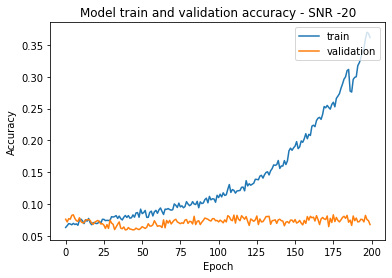

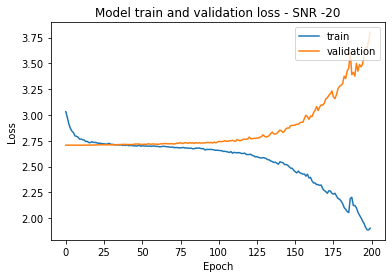


Score of SNR on All SNR model without Transfer Learning -20 = 41.585081815719604

Training SNR = -20 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 6s 282ms/step - loss: 3.8934 - accuracy: 0.3399 - val_loss: 2.2505 - val_accuracy: 0.3548
Epoch 2/200
7/7 [==============================] - 2s 279ms/step - loss: 3.3344 - accuracy: 0.3439 - val_loss: 2.3669 - val_accuracy: 0.3245
Epoch 3/200
7/7 [==============================] - 2s 278ms/step - loss: 3.0532 - accuracy: 0.3503 - val_loss: 2.3291 - val_accuracy: 0.3287
Epoch 4/200
7/7 [==============================] - 2s 281ms/step - loss: 2.8562 - accuracy: 0.3448 - val_loss: 2.3283 - val_accuracy: 0.3217
Epoch 5/200
7/7 [==============================] - 2s 284ms/step - loss: 2.7013 - accuracy: 0.3419 - val_loss: 2.2302 - val_accuracy: 0.3380
Epoch 6/200
7/7 [==============================] - 2s 284ms/step - loss: 2.4913 - accuracy: 0.3632 - val_loss: 2.2796 - val_accuracy: 0.3352
Epoch 7/200
7/7

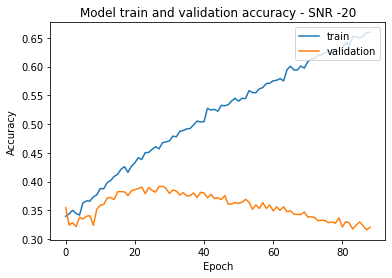

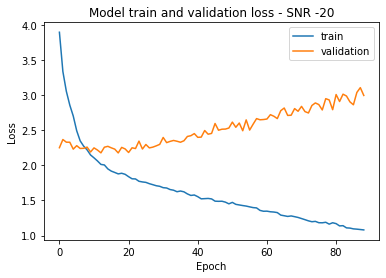

Score of SNR on High SNR model without Transfer Learning -20 = 7.878787815570831

Training SNR = -20 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 7s 283ms/step - loss: 8.0038 - accuracy: 0.0808 - val_loss: 18.1313 - val_accuracy: 0.0751
Epoch 2/200
7/7 [==============================] - 2s 281ms/step - loss: 6.3363 - accuracy: 0.0765 - val_loss: 16.5878 - val_accuracy: 0.0765
Epoch 3/200
7/7 [==============================] - 2s 283ms/step - loss: 5.5189 - accuracy: 0.0785 - val_loss: 14.8714 - val_accuracy: 0.0755
Epoch 4/200
7/7 [==============================] - 2s 284ms/step - loss: 5.0027 - accuracy: 0.0720 - val_loss: 13.2557 - val_accuracy: 0.0760
Epoch 5/200
7/7 [==============================] - 2s 286ms/step - loss: 4.4886 - accuracy: 0.0789 - val_loss: 11.7982 - val_accuracy: 0.0765
Epoch 6/200
7/7 [==============================] - 2s 288ms/step - loss: 3.9925 - accuracy: 0.0726 - val_loss: 10.0862 - val_accuracy: 0.0760
Epoch 7/2

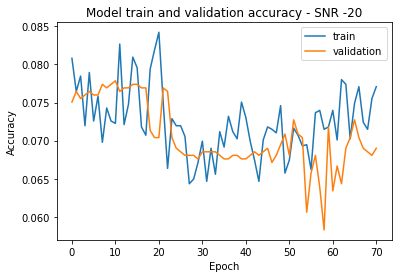

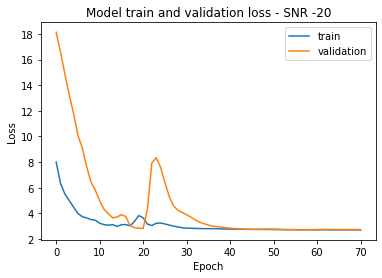

Score of SNR on low SNR model without Transfer Learning -20 = 49.184149503707886

Training SNR = -20 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 6s 280ms/step - loss: 3.0829 - accuracy: 0.4120 - val_loss: 2.3128 - val_accuracy: 0.3855
Epoch 2/200
7/7 [==============================] - 2s 279ms/step - loss: 2.6205 - accuracy: 0.4266 - val_loss: 2.3846 - val_accuracy: 0.4210
Epoch 3/200
7/7 [==============================] - 2s 296ms/step - loss: 2.3377 - accuracy: 0.4468 - val_loss: 2.2969 - val_accuracy: 0.4084
Epoch 4/200
7/7 [==============================] - 2s 281ms/step - loss: 2.1405 - accuracy: 0.4642 - val_loss: 2.2990 - val_accuracy: 0.4098
Epoch 5/200
7/7 [==============================] - 2s 282ms/step - loss: 1.9950 - accuracy: 0.4688 - val_loss: 2.2618 - val_accuracy: 0.4159
Epoch 6/200
7/7 [==============================] - 2s 285ms/step - loss: 1.8931 - accuracy: 0.4763 - val_loss: 2.3334 - val_accuracy: 0.4471
Epoch 7/200
7/7 

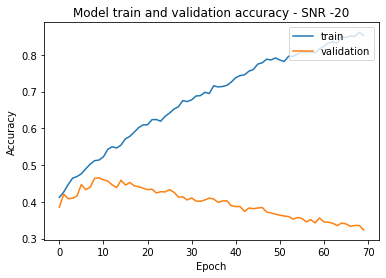

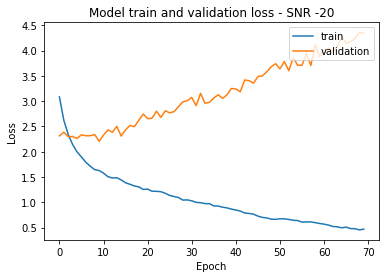

[[6.15384616]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]] [[41.58508182  0.          0.          0.          0.          0.
   0.          0.          0.          0.        ]
 [33.3799541   0.          0.          0.          0.          0.
   0.          0.          0.          0.        ]] [[7.87878782 0.         0.         0.         0.         0.
  0.         0.         0.         0.        ]
 [7.64568746 0.         0.         0.         0.         0.
  0.         0.         0.         0.        ]] [[49.1841495   0.          0.          0.          0.          0.
   0.          0.          0.          0.        ]
 [33.93939435  0.          0.          0.          0.          0.
   0.          0.          0.          0.        ]]

Training SNR = -18 Data

Epoch 1/200
7/7 [==============================] - 7s 457ms/step - loss: 3.0714 - accuracy: 0.0656 - val_loss: 2.7080 - val_accuracy: 0.0653
Epoch 2

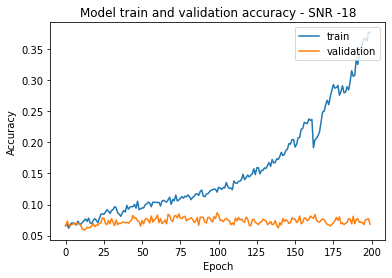

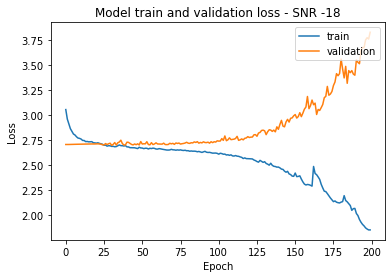


Score of SNR on All SNR model without Transfer Learning -18 = 48.578089475631714

Training SNR = -18 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 6s 284ms/step - loss: 2.8012 - accuracy: 0.4553 - val_loss: 2.0020 - val_accuracy: 0.4634
Epoch 2/200
7/7 [==============================] - 2s 282ms/step - loss: 2.4040 - accuracy: 0.4542 - val_loss: 1.9797 - val_accuracy: 0.4597
Epoch 3/200
7/7 [==============================] - 2s 284ms/step - loss: 2.1594 - accuracy: 0.4558 - val_loss: 2.0542 - val_accuracy: 0.4438
Epoch 4/200
7/7 [==============================] - 2s 288ms/step - loss: 2.0079 - accuracy: 0.4706 - val_loss: 2.0948 - val_accuracy: 0.4420
Epoch 5/200
7/7 [==============================] - 2s 290ms/step - loss: 1.8883 - accuracy: 0.4670 - val_loss: 2.0543 - val_accuracy: 0.4527
Epoch 6/200
7/7 [==============================] - 2s 286ms/step - loss: 1.7918 - accuracy: 0.4855 - val_loss: 2.2476 - val_accuracy: 0.4555
Epoch 7/200
7/7

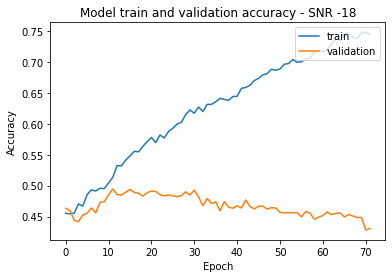

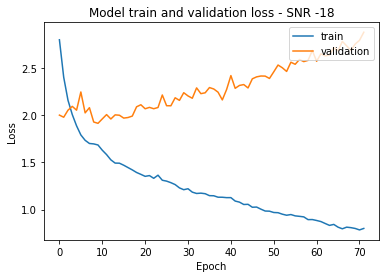

Score of SNR on High SNR model without Transfer Learning -18 = 6.480186432600021

Training SNR = -18 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 6s 283ms/step - loss: 7.8135 - accuracy: 0.0853 - val_loss: 18.0347 - val_accuracy: 0.0732
Epoch 2/200
7/7 [==============================] - 2s 298ms/step - loss: 6.0256 - accuracy: 0.0814 - val_loss: 16.4120 - val_accuracy: 0.0741
Epoch 3/200
7/7 [==============================] - 2s 283ms/step - loss: 5.2663 - accuracy: 0.0777 - val_loss: 14.3647 - val_accuracy: 0.0713
Epoch 4/200
7/7 [==============================] - 2s 286ms/step - loss: 4.8492 - accuracy: 0.0760 - val_loss: 12.1580 - val_accuracy: 0.0718
Epoch 5/200
7/7 [==============================] - 2s 290ms/step - loss: 4.4979 - accuracy: 0.0746 - val_loss: 10.3700 - val_accuracy: 0.0713
Epoch 6/200
7/7 [==============================] - 2s 290ms/step - loss: 4.0258 - accuracy: 0.0740 - val_loss: 8.8087 - val_accuracy: 0.0713
Epoch 7/20

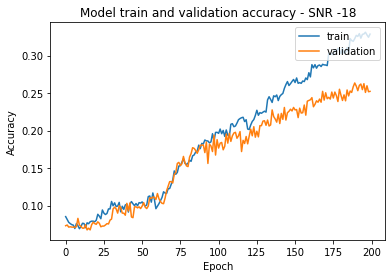

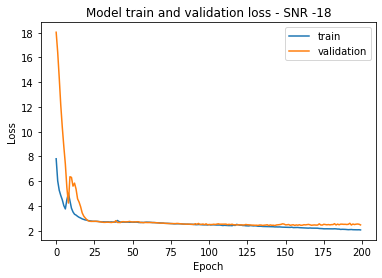

Score of SNR on low SNR model without Transfer Learning -18 = 57.62237906455994

Training SNR = -18 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 6s 284ms/step - loss: 2.2229 - accuracy: 0.5119 - val_loss: 1.8840 - val_accuracy: 0.4834
Epoch 2/200
7/7 [==============================] - 2s 286ms/step - loss: 1.9559 - accuracy: 0.5120 - val_loss: 1.8122 - val_accuracy: 0.5538
Epoch 3/200
7/7 [==============================] - 2s 286ms/step - loss: 1.7753 - accuracy: 0.5409 - val_loss: 1.7637 - val_accuracy: 0.5301
Epoch 4/200
7/7 [==============================] - 2s 285ms/step - loss: 1.6236 - accuracy: 0.5540 - val_loss: 1.8589 - val_accuracy: 0.5329
Epoch 5/200
7/7 [==============================] - 2s 290ms/step - loss: 1.4971 - accuracy: 0.5655 - val_loss: 1.7448 - val_accuracy: 0.5636
Epoch 6/200
7/7 [==============================] - 2s 292ms/step - loss: 1.4327 - accuracy: 0.5838 - val_loss: 1.7829 - val_accuracy: 0.5706
Epoch 7/200
7/7 [

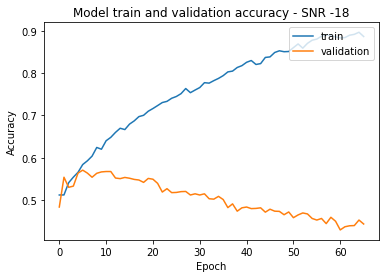

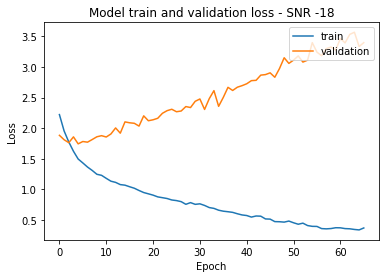

[[6.15384616]
 [7.73892775]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]] [[41.58508182 48.57808948  0.          0.          0.          0.
   0.          0.          0.          0.        ]
 [33.3799541  43.12354326  0.          0.          0.          0.
   0.          0.          0.          0.        ]] [[ 7.87878782  6.48018643  0.          0.          0.          0.
   0.          0.          0.          0.        ]
 [ 7.64568746 24.10256416  0.          0.          0.          0.
   0.          0.          0.          0.        ]] [[49.1841495  57.62237906  0.          0.          0.          0.
   0.          0.          0.          0.        ]
 [33.93939435 42.28438139  0.          0.          0.          0.
   0.          0.          0.          0.        ]]

Training SNR = -16 Data

Epoch 1/200
7/7 [==============================] - 8s 454ms/step - loss: 3.0777 - accuracy: 0.0711 - val_loss: 2.7083 - val_accu

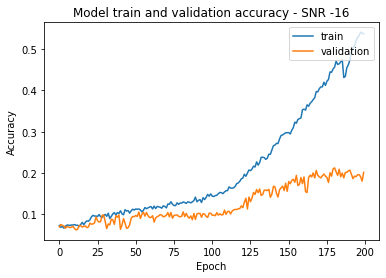

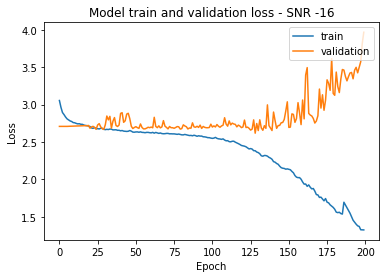


Score of SNR on All SNR model without Transfer Learning -16 = 63.96270394325256

Training SNR = -16 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 7s 282ms/step - loss: 1.8011 - accuracy: 0.5733 - val_loss: 1.4136 - val_accuracy: 0.5874
Epoch 2/200
7/7 [==============================] - 2s 282ms/step - loss: 1.5518 - accuracy: 0.5726 - val_loss: 1.3428 - val_accuracy: 0.5963
Epoch 3/200
7/7 [==============================] - 2s 285ms/step - loss: 1.4339 - accuracy: 0.5823 - val_loss: 1.3725 - val_accuracy: 0.6070
Epoch 4/200
7/7 [==============================] - 2s 286ms/step - loss: 1.3120 - accuracy: 0.6026 - val_loss: 1.3567 - val_accuracy: 0.6089
Epoch 5/200
7/7 [==============================] - 2s 288ms/step - loss: 1.2620 - accuracy: 0.6099 - val_loss: 1.3283 - val_accuracy: 0.6275
Epoch 6/200
7/7 [==============================] - 2s 290ms/step - loss: 1.2064 - accuracy: 0.6292 - val_loss: 1.3901 - val_accuracy: 0.6103
Epoch 7/200
7/7 

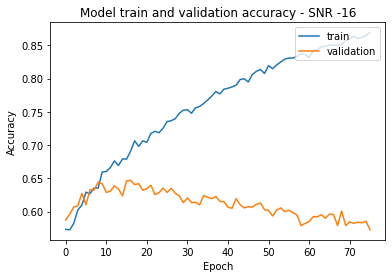

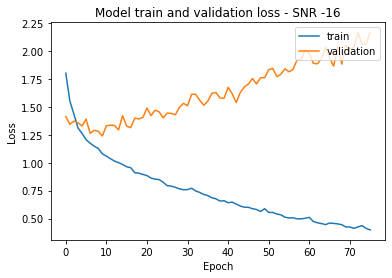

Score of SNR on High SNR model without Transfer Learning -16 = 6.7132867872715

Training SNR = -16 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 6s 287ms/step - loss: 7.5212 - accuracy: 0.1096 - val_loss: 16.2529 - val_accuracy: 0.0793
Epoch 2/200
7/7 [==============================] - 2s 284ms/step - loss: 5.8230 - accuracy: 0.1158 - val_loss: 15.0132 - val_accuracy: 0.0830
Epoch 3/200
7/7 [==============================] - 2s 284ms/step - loss: 5.1318 - accuracy: 0.1159 - val_loss: 13.3894 - val_accuracy: 0.0839
Epoch 4/200
7/7 [==============================] - 2s 287ms/step - loss: 4.3378 - accuracy: 0.1308 - val_loss: 11.0088 - val_accuracy: 0.0937
Epoch 5/200
7/7 [==============================] - 2s 290ms/step - loss: 4.1026 - accuracy: 0.1358 - val_loss: 9.9950 - val_accuracy: 0.0956
Epoch 6/200
7/7 [==============================] - 2s 289ms/step - loss: 3.6462 - accuracy: 0.1294 - val_loss: 7.6187 - val_accuracy: 0.0979
Epoch 7/200
7

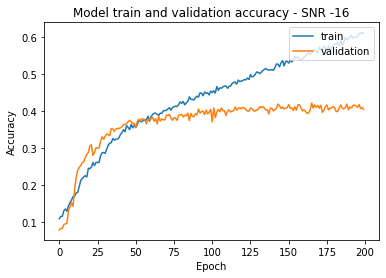

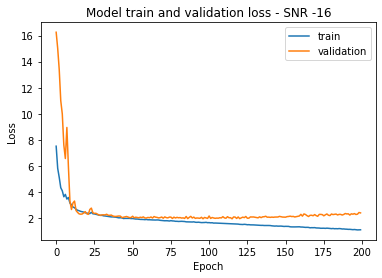

Score of SNR on low SNR model without Transfer Learning -16 = 68.67132782936096

Training SNR = -16 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 7s 289ms/step - loss: 1.5814 - accuracy: 0.6085 - val_loss: 1.3074 - val_accuracy: 0.6466
Epoch 2/200
7/7 [==============================] - 2s 285ms/step - loss: 1.3148 - accuracy: 0.6312 - val_loss: 1.2889 - val_accuracy: 0.6620
Epoch 3/200
7/7 [==============================] - 2s 287ms/step - loss: 1.2112 - accuracy: 0.6510 - val_loss: 1.4104 - val_accuracy: 0.6438
Epoch 4/200
7/7 [==============================] - 2s 289ms/step - loss: 1.1159 - accuracy: 0.6558 - val_loss: 1.2942 - val_accuracy: 0.6606
Epoch 5/200
7/7 [==============================] - 2s 290ms/step - loss: 1.0575 - accuracy: 0.6827 - val_loss: 1.2731 - val_accuracy: 0.6704
Epoch 6/200
7/7 [==============================] - 2s 293ms/step - loss: 0.9666 - accuracy: 0.6936 - val_loss: 1.3009 - val_accuracy: 0.6690
Epoch 7/200
7/7 [

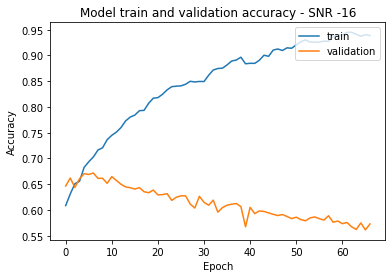

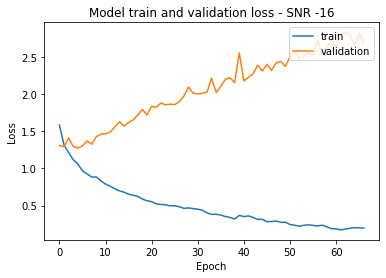

[[ 6.15384616]
 [ 7.73892775]
 [21.30536139]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]] [[41.58508182 48.57808948 63.96270394  0.          0.          0.
   0.          0.          0.          0.        ]
 [33.3799541  43.12354326 58.55478048  0.          0.          0.
   0.          0.          0.          0.        ]] [[ 7.87878782  6.48018643  6.71328679  0.          0.          0.
   0.          0.          0.          0.        ]
 [ 7.64568746 24.10256416 41.39860272  0.          0.          0.
   0.          0.          0.          0.        ]] [[49.1841495  57.62237906 68.67132783  0.          0.          0.
   0.          0.          0.          0.        ]
 [33.93939435 42.28438139 57.34265447  0.          0.          0.
   0.          0.          0.          0.        ]]

Training SNR = -14 Data

Epoch 1/200
7/7 [==============================] - 7s 453ms/step - loss: 3.0734 - accuracy: 0.0681 - val_loss: 2.7082 

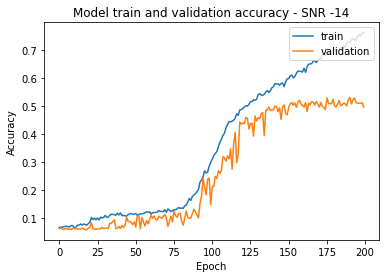

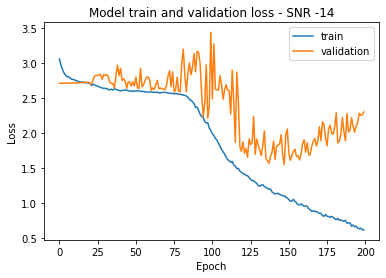


Score of SNR on All SNR model without Transfer Learning -14 = 75.10489225387573

Training SNR = -14 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 6s 283ms/step - loss: 1.0667 - accuracy: 0.7040 - val_loss: 0.8221 - val_accuracy: 0.7436
Epoch 2/200
7/7 [==============================] - 2s 283ms/step - loss: 0.8908 - accuracy: 0.7184 - val_loss: 0.8887 - val_accuracy: 0.7371
Epoch 3/200
7/7 [==============================] - 2s 283ms/step - loss: 0.8236 - accuracy: 0.7316 - val_loss: 0.9015 - val_accuracy: 0.7403
Epoch 4/200
7/7 [==============================] - 2s 285ms/step - loss: 0.7655 - accuracy: 0.7459 - val_loss: 0.8846 - val_accuracy: 0.7459
Epoch 5/200
7/7 [==============================] - 2s 287ms/step - loss: 0.7293 - accuracy: 0.7582 - val_loss: 0.8846 - val_accuracy: 0.7375
Epoch 6/200
7/7 [==============================] - 2s 287ms/step - loss: 0.6956 - accuracy: 0.7646 - val_loss: 0.8912 - val_accuracy: 0.7427
Epoch 7/200
7/7 

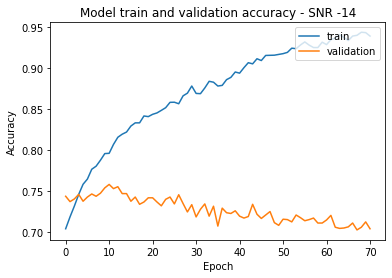

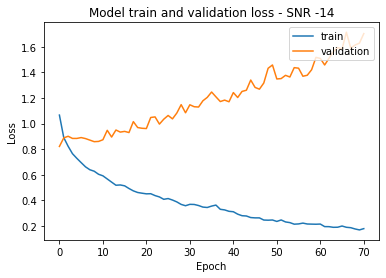

Score of SNR on High SNR model without Transfer Learning -14 = 8.344988524913788

Training SNR = -14 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 6s 282ms/step - loss: 6.5259 - accuracy: 0.1857 - val_loss: 11.8491 - val_accuracy: 0.1646
Epoch 2/200
7/7 [==============================] - 2s 281ms/step - loss: 4.8765 - accuracy: 0.2465 - val_loss: 10.6787 - val_accuracy: 0.1254
Epoch 3/200
7/7 [==============================] - 2s 282ms/step - loss: 3.9822 - accuracy: 0.2707 - val_loss: 7.4718 - val_accuracy: 0.1748
Epoch 4/200
7/7 [==============================] - 2s 283ms/step - loss: 3.3348 - accuracy: 0.3060 - val_loss: 5.6618 - val_accuracy: 0.2163
Epoch 5/200
7/7 [==============================] - 2s 284ms/step - loss: 2.8948 - accuracy: 0.3313 - val_loss: 4.1398 - val_accuracy: 0.2788
Epoch 6/200
7/7 [==============================] - 2s 287ms/step - loss: 2.5289 - accuracy: 0.3605 - val_loss: 3.2680 - val_accuracy: 0.3240
Epoch 7/200
7

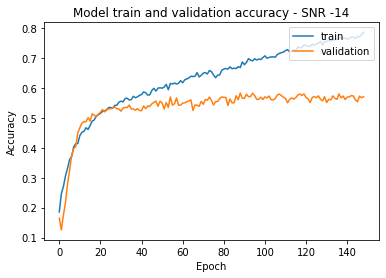

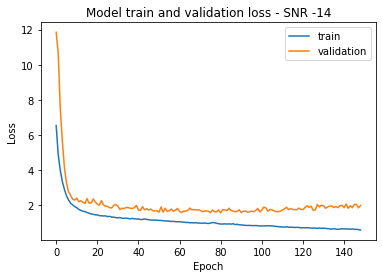

Score of SNR on low SNR model without Transfer Learning -14 = 78.69464159011841

Training SNR = -14 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 6s 282ms/step - loss: 0.9267 - accuracy: 0.7364 - val_loss: 0.8316 - val_accuracy: 0.7487
Epoch 2/200
7/7 [==============================] - 2s 280ms/step - loss: 0.7716 - accuracy: 0.7504 - val_loss: 0.8391 - val_accuracy: 0.7580
Epoch 3/200
7/7 [==============================] - 2s 282ms/step - loss: 0.7227 - accuracy: 0.7678 - val_loss: 0.8388 - val_accuracy: 0.7604
Epoch 4/200
7/7 [==============================] - 2s 281ms/step - loss: 0.6467 - accuracy: 0.7880 - val_loss: 0.8903 - val_accuracy: 0.7534
Epoch 5/200
7/7 [==============================] - 2s 285ms/step - loss: 0.5998 - accuracy: 0.7981 - val_loss: 0.8714 - val_accuracy: 0.7678
Epoch 6/200
7/7 [==============================] - 2s 286ms/step - loss: 0.5581 - accuracy: 0.8076 - val_loss: 0.9219 - val_accuracy: 0.7524
Epoch 7/200
7/7 [

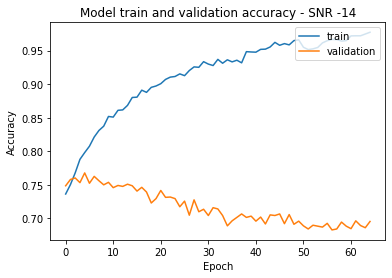

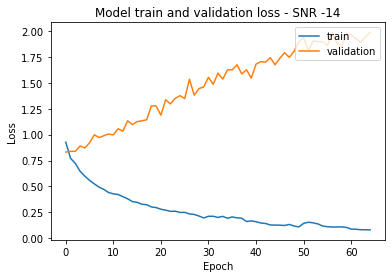

[[ 6.15384616]
 [ 7.73892775]
 [21.30536139]
 [53.79953384]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]] [[41.58508182 48.57808948 63.96270394 75.10489225  0.          0.
   0.          0.          0.          0.        ]
 [33.3799541  43.12354326 58.55478048 69.5104897   0.          0.
   0.          0.          0.          0.        ]] [[ 7.87878782  6.48018643  6.71328679  8.34498852  0.          0.
   0.          0.          0.          0.        ]
 [ 7.64568746 24.10256416 41.39860272 58.32167864  0.          0.
   0.          0.          0.          0.        ]] [[49.1841495  57.62237906 68.67132783 78.69464159  0.          0.
   0.          0.          0.          0.        ]
 [33.93939435 42.28438139 57.34265447 70.16317248  0.          0.
   0.          0.          0.          0.        ]]

Training SNR = -12 Data

Epoch 1/200
7/7 [==============================] - 7s 455ms/step - loss: 3.0661 - accuracy: 0.0721 - val_loss: 2.7084 

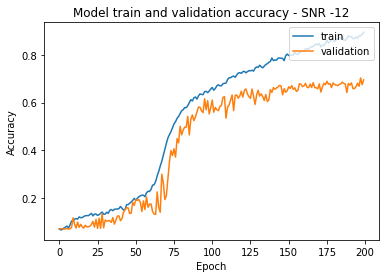

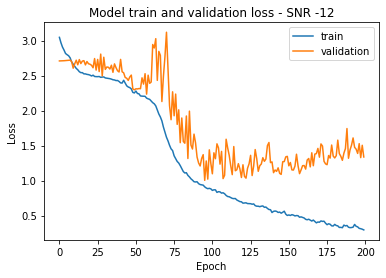


Score of SNR on All SNR model without Transfer Learning -12 = 85.17482280731201

Training SNR = -12 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 6s 285ms/step - loss: 0.6041 - accuracy: 0.8120 - val_loss: 0.4929 - val_accuracy: 0.8359
Epoch 2/200
7/7 [==============================] - 2s 282ms/step - loss: 0.5027 - accuracy: 0.8260 - val_loss: 0.5043 - val_accuracy: 0.8252
Epoch 3/200
7/7 [==============================] - 2s 282ms/step - loss: 0.4574 - accuracy: 0.8401 - val_loss: 0.5268 - val_accuracy: 0.8219
Epoch 4/200
7/7 [==============================] - 2s 283ms/step - loss: 0.4206 - accuracy: 0.8466 - val_loss: 0.4951 - val_accuracy: 0.8331
Epoch 5/200
7/7 [==============================] - 2s 286ms/step - loss: 0.3719 - accuracy: 0.8617 - val_loss: 0.5317 - val_accuracy: 0.8359
Epoch 6/200
7/7 [==============================] - 2s 286ms/step - loss: 0.3603 - accuracy: 0.8724 - val_loss: 0.5046 - val_accuracy: 0.8373
Epoch 7/200
7/7 

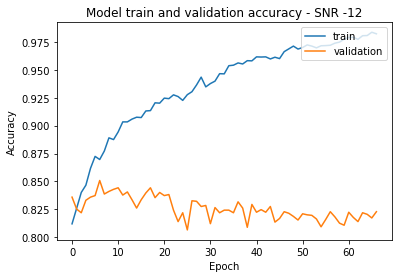

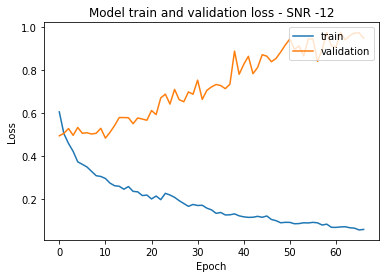

Score of SNR on High SNR model without Transfer Learning -12 = 12.261072546243668

Training SNR = -12 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 6s 284ms/step - loss: 4.8248 - accuracy: 0.3503 - val_loss: 3.8642 - val_accuracy: 0.4755
Epoch 2/200
7/7 [==============================] - 2s 281ms/step - loss: 3.0204 - accuracy: 0.4948 - val_loss: 2.9558 - val_accuracy: 0.4695
Epoch 3/200
7/7 [==============================] - 2s 284ms/step - loss: 2.4058 - accuracy: 0.4949 - val_loss: 2.2747 - val_accuracy: 0.5142
Epoch 4/200
7/7 [==============================] - 2s 285ms/step - loss: 1.8702 - accuracy: 0.5548 - val_loss: 1.7872 - val_accuracy: 0.5753
Epoch 5/200
7/7 [==============================] - 2s 283ms/step - loss: 1.6840 - accuracy: 0.5681 - val_loss: 1.7941 - val_accuracy: 0.5497
Epoch 6/200
7/7 [==============================] - 2s 287ms/step - loss: 1.5550 - accuracy: 0.5598 - val_loss: 1.6720 - val_accuracy: 0.5897
Epoch 7/200
7/

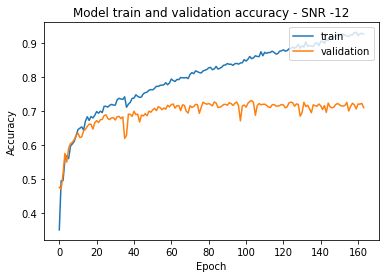

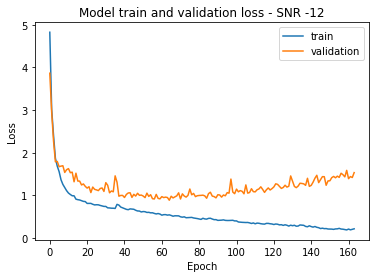

Score of SNR on low SNR model without Transfer Learning -12 = 86.57342791557312

Training SNR = -12 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 7s 285ms/step - loss: 0.5524 - accuracy: 0.8239 - val_loss: 0.5327 - val_accuracy: 0.8247
Epoch 2/200
7/7 [==============================] - 2s 284ms/step - loss: 0.4477 - accuracy: 0.8454 - val_loss: 0.5925 - val_accuracy: 0.8224
Epoch 3/200
7/7 [==============================] - 2s 286ms/step - loss: 0.3975 - accuracy: 0.8612 - val_loss: 0.5559 - val_accuracy: 0.8308
Epoch 4/200
7/7 [==============================] - 2s 290ms/step - loss: 0.3584 - accuracy: 0.8699 - val_loss: 0.5774 - val_accuracy: 0.8308
Epoch 5/200
7/7 [==============================] - 2s 289ms/step - loss: 0.3303 - accuracy: 0.8777 - val_loss: 0.6651 - val_accuracy: 0.8256
Epoch 6/200
7/7 [==============================] - 2s 290ms/step - loss: 0.2950 - accuracy: 0.8873 - val_loss: 0.6901 - val_accuracy: 0.8200
Epoch 7/200
7/7 [

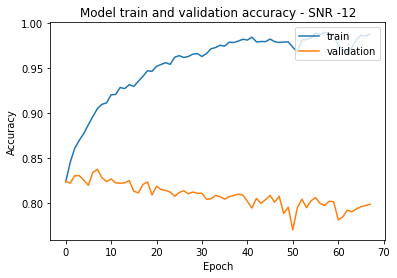

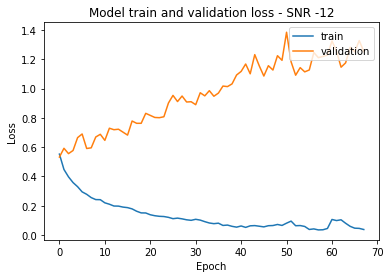

[[ 6.15384616]
 [ 7.73892775]
 [21.30536139]
 [53.79953384]
 [69.32401061]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]] [[41.58508182 48.57808948 63.96270394 75.10489225 85.17482281  0.
   0.          0.          0.          0.        ]
 [33.3799541  43.12354326 58.55478048 69.5104897  82.5641036   0.
   0.          0.          0.          0.        ]] [[ 7.87878782  6.48018643  6.71328679  8.34498852 12.26107255  0.
   0.          0.          0.          0.        ]
 [ 7.64568746 24.10256416 41.39860272 58.32167864 72.54078984  0.
   0.          0.          0.          0.        ]] [[49.1841495  57.62237906 68.67132783 78.69464159 86.57342792  0.
   0.          0.          0.          0.        ]
 [33.93939435 42.28438139 57.34265447 70.16317248 81.21212125  0.
   0.          0.          0.          0.        ]]


In [ ]:
for i in range(0, 5):

  iq_data_complex = np.reshape(x_data_iq_data[:,i].flatten()[::2] + 1j*x_data_iq_data[:,i].flatten()[1::2], (x_dim[0]*x_dim[2], num_samples))
  iq_data_angle_curr = normalize(np.angle(iq_data_complex))
  iq_data_angle_curr = np.reshape(iq_data_angle_curr, (x_dim[0]*x_dim[2], num_samples, 1))
  y_labels_curr = to_categorical(y_labels_data[:,i].flatten())

  X_train_curr, X_test_valid_curr, Y_train_curr, Y_test_valid_curr = train_test_split(iq_data_angle_curr, y_labels_curr, test_size=0.4)
  X_validation_curr, X_test_curr, Y_validation_curr, Y_test_curr = train_test_split(X_test_valid_curr, Y_test_valid_curr, test_size=0.5)

  scores_without_tf_angle[i] = train_data_1D(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)
  scores_tf_allsnr_angle[:,i] = train_data_on_all_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, model_folder_all, i)
  scores_tf_highsnr_angle[:,i] = train_data_on_high_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, model_folder_high, i)
  scores_tf_lowsnr_angle[:,i] = train_data_on_low_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, model_folder_low, i)

  print(scores_without_tf_angle, scores_tf_allsnr_angle, scores_tf_highsnr_angle, scores_tf_lowsnr_angle)


Training SNR = -10 Data

Epoch 1/200
7/7 [==============================] - 11s 772ms/step - loss: 3.0624 - accuracy: 0.0706 - val_loss: 2.7079 - val_accuracy: 0.0625
Epoch 2/200
7/7 [==============================] - 3s 496ms/step - loss: 2.9509 - accuracy: 0.0780 - val_loss: 2.7080 - val_accuracy: 0.0676
Epoch 3/200
7/7 [==============================] - 4s 504ms/step - loss: 2.9106 - accuracy: 0.0670 - val_loss: 2.7085 - val_accuracy: 0.0681
Epoch 4/200
7/7 [==============================] - 4s 552ms/step - loss: 2.8451 - accuracy: 0.0814 - val_loss: 2.7096 - val_accuracy: 0.0699
Epoch 5/200
7/7 [==============================] - 3s 495ms/step - loss: 2.8149 - accuracy: 0.0788 - val_loss: 2.7119 - val_accuracy: 0.0657
Epoch 6/200
7/7 [==============================] - 4s 500ms/step - loss: 2.7673 - accuracy: 0.0883 - val_loss: 2.7156 - val_accuracy: 0.0648
Epoch 7/200
7/7 [==============================] - 4s 504ms/step - loss: 2.6766 - accuracy: 0.1103 - val_loss: 2.6687 - val_acc

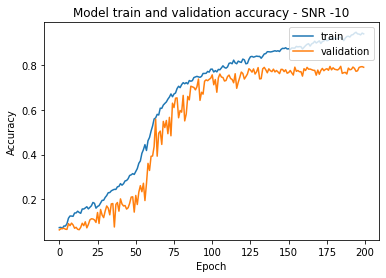

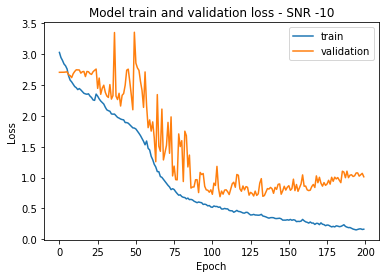


Score of SNR on All SNR model without Transfer Learning -10 = 88.29836845397949

Training SNR = -10 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 9s 504ms/step - loss: 0.3824 - accuracy: 0.8761 - val_loss: 0.3932 - val_accuracy: 0.8802
Epoch 2/200
7/7 [==============================] - 4s 506ms/step - loss: 0.3189 - accuracy: 0.8900 - val_loss: 0.3174 - val_accuracy: 0.8998
Epoch 3/200
7/7 [==============================] - 4s 504ms/step - loss: 0.2830 - accuracy: 0.8934 - val_loss: 0.3676 - val_accuracy: 0.8816
Epoch 4/200
7/7 [==============================] - 3s 496ms/step - loss: 0.2537 - accuracy: 0.9046 - val_loss: 0.3278 - val_accuracy: 0.8951
Epoch 5/200
7/7 [==============================] - 4s 506ms/step - loss: 0.2266 - accuracy: 0.9117 - val_loss: 0.3208 - val_accuracy: 0.8988
Epoch 6/200
7/7 [==============================] - 4s 510ms/step - loss: 0.2100 - accuracy: 0.9166 - val_loss: 0.3551 - val_accuracy: 0.8890
Epoch 7/200
7/7 

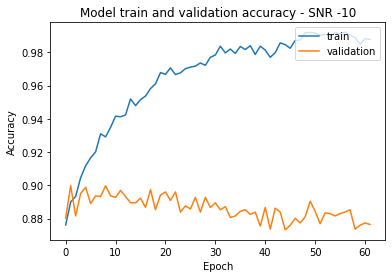

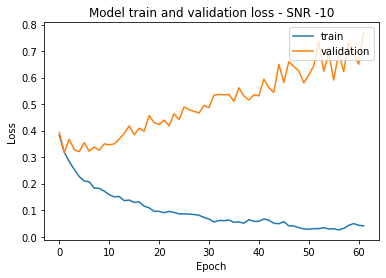

Score of SNR on High SNR model without Transfer Learning -10 = 24.708624184131622

Training SNR = -10 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 8s 511ms/step - loss: 3.1134 - accuracy: 0.5461 - val_loss: 2.0244 - val_accuracy: 0.6699
Epoch 2/200
7/7 [==============================] - 3s 503ms/step - loss: 1.7916 - accuracy: 0.6752 - val_loss: 1.3912 - val_accuracy: 0.6825
Epoch 3/200
7/7 [==============================] - 4s 504ms/step - loss: 1.2890 - accuracy: 0.6814 - val_loss: 1.0899 - val_accuracy: 0.6965
Epoch 4/200
7/7 [==============================] - 4s 562ms/step - loss: 1.0357 - accuracy: 0.7077 - val_loss: 0.9720 - val_accuracy: 0.7221
Epoch 5/200
7/7 [==============================] - 3s 499ms/step - loss: 0.9283 - accuracy: 0.7293 - val_loss: 0.9326 - val_accuracy: 0.7361
Epoch 6/200
7/7 [==============================] - 4s 559ms/step - loss: 0.8006 - accuracy: 0.7411 - val_loss: 0.9109 - val_accuracy: 0.7394
Epoch 7/200
7/

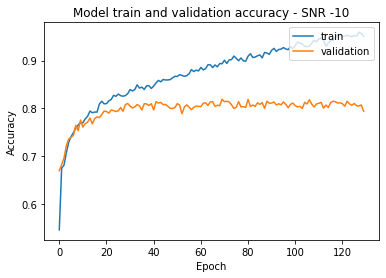

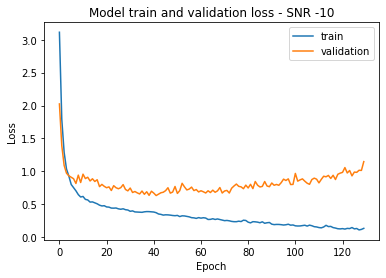

Score of SNR on low SNR model without Transfer Learning -10 = 88.95105123519897

Training SNR = -10 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 8s 507ms/step - loss: 0.3475 - accuracy: 0.8814 - val_loss: 0.3080 - val_accuracy: 0.9002
Epoch 2/200
7/7 [==============================] - 4s 504ms/step - loss: 0.2863 - accuracy: 0.8937 - val_loss: 0.3411 - val_accuracy: 0.8900
Epoch 3/200
7/7 [==============================] - 3s 497ms/step - loss: 0.2548 - accuracy: 0.9016 - val_loss: 0.2954 - val_accuracy: 0.9030
Epoch 4/200
7/7 [==============================] - 4s 502ms/step - loss: 0.2155 - accuracy: 0.9175 - val_loss: 0.3307 - val_accuracy: 0.8946
Epoch 5/200
7/7 [==============================] - 4s 504ms/step - loss: 0.1955 - accuracy: 0.9246 - val_loss: 0.3243 - val_accuracy: 0.9012
Epoch 6/200
7/7 [==============================] - 4s 506ms/step - loss: 0.1825 - accuracy: 0.9312 - val_loss: 0.3467 - val_accuracy: 0.8988
Epoch 7/200
7/7 [

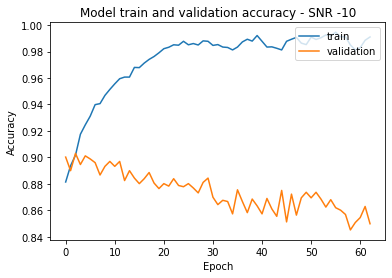

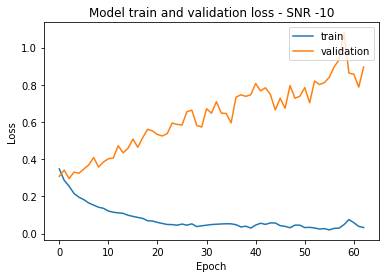

[[ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [78.97436023]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]] [[ 0.          0.          0.          0.          0.         88.29836845
   0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.          0.         86.85314655
   0.          0.          0.          0.        ]] [[ 0.          0.          0.          0.          0.         24.70862418
   0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.          0.         79.34731841
   0.          0.          0.          0.        ]] [[ 0.          0.          0.          0.          0.         88.95105124
   0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.          0.         85.5011642
   0.          0.          0.          0.        ]]

Training SNR = -8 Data

Epoch 1/200
7/7 [==============================] - 10s 721ms/step - loss

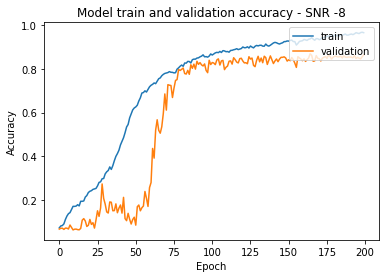

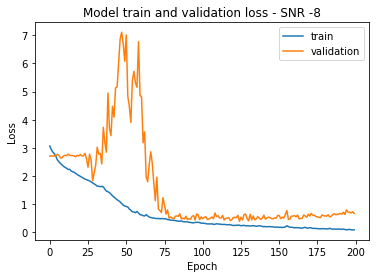


Score of SNR on All SNR model without Transfer Learning -8 = 92.26107001304626

Training SNR = -8 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 10s 510ms/step - loss: 0.2761 - accuracy: 0.9119 - val_loss: 0.2184 - val_accuracy: 0.9282
Epoch 2/200
7/7 [==============================] - 3s 497ms/step - loss: 0.2029 - accuracy: 0.9265 - val_loss: 0.2013 - val_accuracy: 0.9291
Epoch 3/200
7/7 [==============================] - 3s 502ms/step - loss: 0.1828 - accuracy: 0.9267 - val_loss: 0.1918 - val_accuracy: 0.9315
Epoch 4/200
7/7 [==============================] - 3s 495ms/step - loss: 0.1555 - accuracy: 0.9392 - val_loss: 0.1931 - val_accuracy: 0.9343
Epoch 5/200
7/7 [==============================] - 4s 504ms/step - loss: 0.1416 - accuracy: 0.9476 - val_loss: 0.2018 - val_accuracy: 0.9352
Epoch 6/200
7/7 [==============================] - 3s 502ms/step - loss: 0.1313 - accuracy: 0.9534 - val_loss: 0.2183 - val_accuracy: 0.9338
Epoch 7/200
7/7 [

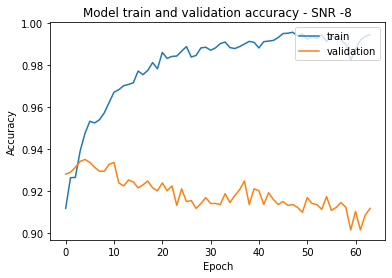

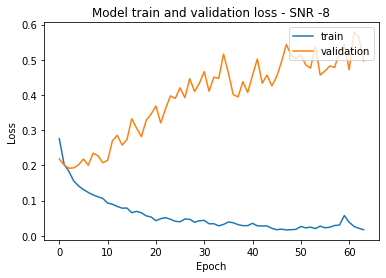

Score of SNR on High SNR model without Transfer Learning -8 = 57.48251676559448

Training SNR = -8 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 8s 504ms/step - loss: 1.5859 - accuracy: 0.7442 - val_loss: 1.4219 - val_accuracy: 0.7660
Epoch 2/200
7/7 [==============================] - 3s 494ms/step - loss: 0.9591 - accuracy: 0.7950 - val_loss: 0.6744 - val_accuracy: 0.8145
Epoch 3/200
7/7 [==============================] - 3s 493ms/step - loss: 0.6856 - accuracy: 0.8113 - val_loss: 0.5528 - val_accuracy: 0.8205
Epoch 4/200
7/7 [==============================] - 3s 497ms/step - loss: 0.5459 - accuracy: 0.8244 - val_loss: 0.5106 - val_accuracy: 0.8378
Epoch 5/200
7/7 [==============================] - 3s 501ms/step - loss: 0.4782 - accuracy: 0.8426 - val_loss: 0.5136 - val_accuracy: 0.8476
Epoch 6/200
7/7 [==============================] - 3s 500ms/step - loss: 0.4294 - accuracy: 0.8440 - val_loss: 0.4536 - val_accuracy: 0.8517
Epoch 7/200
7/7 [

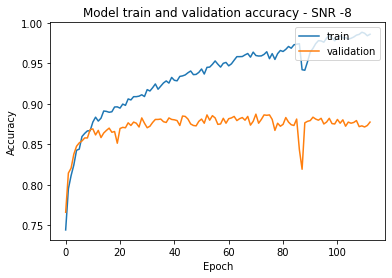

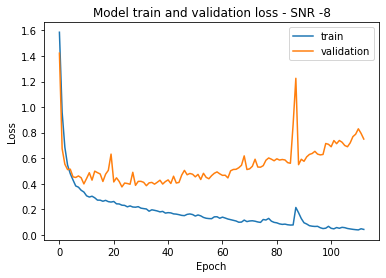

Score of SNR on low SNR model without Transfer Learning -8 = 92.16783046722412

Training SNR = -8 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 9s 514ms/step - loss: 0.2515 - accuracy: 0.9148 - val_loss: 0.2536 - val_accuracy: 0.9217
Epoch 2/200
7/7 [==============================] - 3s 499ms/step - loss: 0.2104 - accuracy: 0.9206 - val_loss: 0.2160 - val_accuracy: 0.9254
Epoch 3/200
7/7 [==============================] - 4s 555ms/step - loss: 0.1801 - accuracy: 0.9322 - val_loss: 0.2165 - val_accuracy: 0.9226
Epoch 4/200
7/7 [==============================] - 3s 494ms/step - loss: 0.1617 - accuracy: 0.9361 - val_loss: 0.2075 - val_accuracy: 0.9277
Epoch 5/200
7/7 [==============================] - 4s 504ms/step - loss: 0.1410 - accuracy: 0.9467 - val_loss: 0.2177 - val_accuracy: 0.9287
Epoch 6/200
7/7 [==============================] - 3s 497ms/step - loss: 0.1294 - accuracy: 0.9524 - val_loss: 0.2379 - val_accuracy: 0.9287
Epoch 7/200
7/7 [==

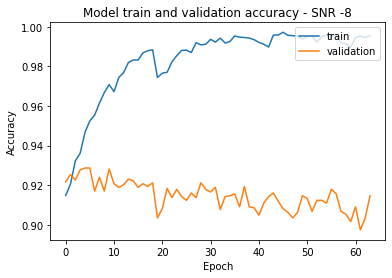

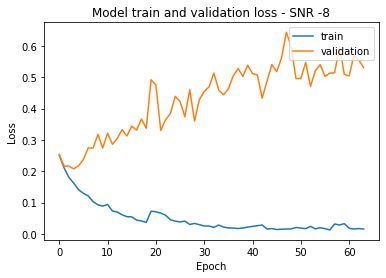

[[ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [78.97436023]
 [86.06060743]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]] [[ 0.          0.          0.          0.          0.         88.29836845
  92.26107001  0.          0.          0.        ]
 [ 0.          0.          0.          0.          0.         86.85314655
  92.12121367  0.          0.          0.        ]] [[ 0.          0.          0.          0.          0.         24.70862418
  57.48251677  0.          0.          0.        ]
 [ 0.          0.          0.          0.          0.         79.34731841
  86.80652976  0.          0.          0.        ]] [[ 0.          0.          0.          0.          0.         88.95105124
  92.16783047  0.          0.          0.        ]
 [ 0.          0.          0.          0.          0.         85.5011642
  91.65500998  0.          0.          0.        ]]

Training SNR = -6 Data

Epoch 1/200
7/7 [==============================] - 10s 717ms/step - loss

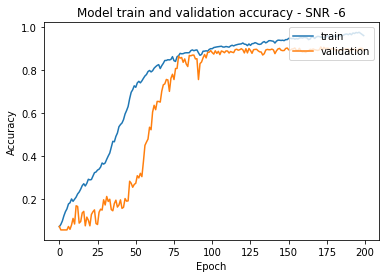

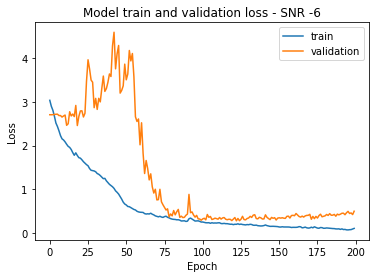


Score of SNR on All SNR model without Transfer Learning -6 = 93.61305236816406

Training SNR = -6 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 9s 499ms/step - loss: 0.2038 - accuracy: 0.9368 - val_loss: 0.1785 - val_accuracy: 0.9422
Epoch 2/200
7/7 [==============================] - 3s 503ms/step - loss: 0.1524 - accuracy: 0.9469 - val_loss: 0.1626 - val_accuracy: 0.9450
Epoch 3/200
7/7 [==============================] - 3s 503ms/step - loss: 0.1317 - accuracy: 0.9521 - val_loss: 0.1450 - val_accuracy: 0.9455
Epoch 4/200
7/7 [==============================] - 3s 495ms/step - loss: 0.1159 - accuracy: 0.9582 - val_loss: 0.1400 - val_accuracy: 0.9492
Epoch 5/200
7/7 [==============================] - 4s 504ms/step - loss: 0.1001 - accuracy: 0.9616 - val_loss: 0.1491 - val_accuracy: 0.9497
Epoch 6/200
7/7 [==============================] - 4s 504ms/step - loss: 0.0939 - accuracy: 0.9649 - val_loss: 0.1577 - val_accuracy: 0.9441
Epoch 7/200
7/7 [=

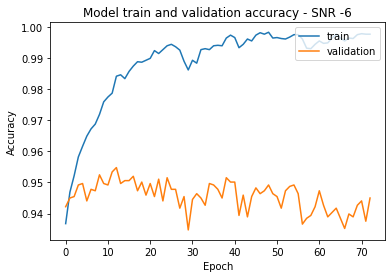

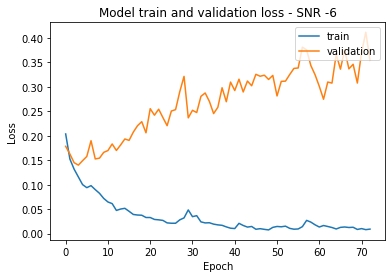

Score of SNR on High SNR model without Transfer Learning -6 = 81.63170218467712

Training SNR = -6 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 8s 507ms/step - loss: 0.7952 - accuracy: 0.8600 - val_loss: 0.6592 - val_accuracy: 0.8718
Epoch 2/200
7/7 [==============================] - 4s 559ms/step - loss: 0.5218 - accuracy: 0.8747 - val_loss: 0.3905 - val_accuracy: 0.8937
Epoch 3/200
7/7 [==============================] - 4s 506ms/step - loss: 0.3498 - accuracy: 0.8936 - val_loss: 0.2860 - val_accuracy: 0.9007
Epoch 4/200
7/7 [==============================] - 4s 501ms/step - loss: 0.3413 - accuracy: 0.8894 - val_loss: 0.2749 - val_accuracy: 0.9026
Epoch 5/200
7/7 [==============================] - 4s 503ms/step - loss: 0.2837 - accuracy: 0.9009 - val_loss: 0.2819 - val_accuracy: 0.9035
Epoch 6/200
7/7 [==============================] - 4s 502ms/step - loss: 0.2550 - accuracy: 0.9005 - val_loss: 0.2672 - val_accuracy: 0.9021
Epoch 7/200
7/7 [

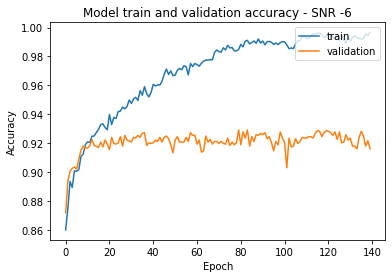

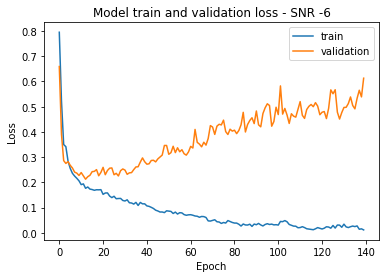

Score of SNR on low SNR model without Transfer Learning -6 = 92.86713004112244

Training SNR = -6 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 9s 523ms/step - loss: 0.1977 - accuracy: 0.9305 - val_loss: 0.1821 - val_accuracy: 0.9296
Epoch 2/200
7/7 [==============================] - 4s 507ms/step - loss: 0.1539 - accuracy: 0.9408 - val_loss: 0.1661 - val_accuracy: 0.9380
Epoch 3/200
7/7 [==============================] - 4s 504ms/step - loss: 0.1328 - accuracy: 0.9500 - val_loss: 0.1492 - val_accuracy: 0.9357
Epoch 4/200
7/7 [==============================] - 4s 504ms/step - loss: 0.1135 - accuracy: 0.9568 - val_loss: 0.1713 - val_accuracy: 0.9394
Epoch 5/200
7/7 [==============================] - 4s 509ms/step - loss: 0.1004 - accuracy: 0.9641 - val_loss: 0.1811 - val_accuracy: 0.9399
Epoch 6/200
7/7 [==============================] - 4s 552ms/step - loss: 0.0860 - accuracy: 0.9700 - val_loss: 0.2162 - val_accuracy: 0.9347
Epoch 7/200
7/7 [==

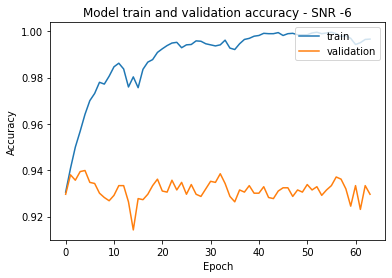

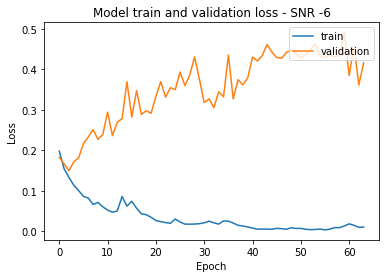

[[ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [78.97436023]
 [86.06060743]
 [88.85781169]
 [ 0.        ]
 [ 0.        ]] [[ 0.          0.          0.          0.          0.         88.29836845
  92.26107001 93.61305237  0.          0.        ]
 [ 0.          0.          0.          0.          0.         86.85314655
  92.12121367 94.0326333   0.          0.        ]] [[ 0.          0.          0.          0.          0.         24.70862418
  57.48251677 81.63170218  0.          0.        ]
 [ 0.          0.          0.          0.          0.         79.34731841
  86.80652976 91.23542905  0.          0.        ]] [[ 0.          0.          0.          0.          0.         88.95105124
  92.16783047 92.86713004  0.          0.        ]
 [ 0.          0.          0.          0.          0.         85.5011642
  91.65500998 93.79953146  0.          0.        ]]

Training SNR = -4 Data

Epoch 1/200
7/7 [==============================] - 10s 733ms/step - loss

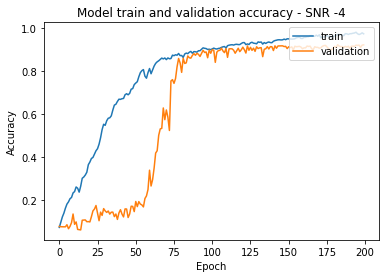

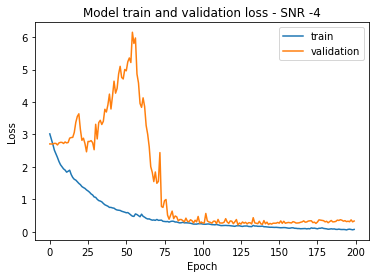


Score of SNR on All SNR model without Transfer Learning -4 = 95.99067568778992

Training SNR = -4 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 8s 517ms/step - loss: 0.1408 - accuracy: 0.9584 - val_loss: 0.1175 - val_accuracy: 0.9669
Epoch 2/200
7/7 [==============================] - 4s 505ms/step - loss: 0.1025 - accuracy: 0.9657 - val_loss: 0.1154 - val_accuracy: 0.9608
Epoch 3/200
7/7 [==============================] - 3s 498ms/step - loss: 0.0953 - accuracy: 0.9657 - val_loss: 0.0974 - val_accuracy: 0.9646
Epoch 4/200
7/7 [==============================] - 4s 511ms/step - loss: 0.0766 - accuracy: 0.9734 - val_loss: 0.1738 - val_accuracy: 0.9552
Epoch 5/200
7/7 [==============================] - 4s 554ms/step - loss: 0.0719 - accuracy: 0.9754 - val_loss: 0.1011 - val_accuracy: 0.9660
Epoch 6/200
7/7 [==============================] - 4s 512ms/step - loss: 0.0574 - accuracy: 0.9793 - val_loss: 0.1165 - val_accuracy: 0.9618
Epoch 7/200
7/7 [=

In [ ]:
for i in range(5, 8):

  iq_data_complex = np.reshape(x_data_iq_data[:,i].flatten()[::2] + 1j*x_data_iq_data[:,i].flatten()[1::2], (x_dim[0]*x_dim[2], num_samples))
  iq_data_angle_curr = normalize(np.angle(iq_data_complex))
  iq_data_angle_curr = np.reshape(iq_data_angle_curr, (x_dim[0]*x_dim[2], num_samples, 1))
  y_labels_curr = to_categorical(y_labels_data[:,i].flatten())


  X_train_curr, X_test_valid_curr, Y_train_curr, Y_test_valid_curr = train_test_split(iq_data_angle_curr, y_labels_curr, test_size=0.4)
  X_validation_curr, X_test_curr, Y_validation_curr, Y_test_curr = train_test_split(X_test_valid_curr, Y_test_valid_curr, test_size=0.5)

  scores_without_tf_angle[i] = train_data_1D(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)
  scores_tf_allsnr_angle[:,i] = train_data_on_all_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, model_folder_all, i)
  scores_tf_highsnr_angle[:,i] = train_data_on_high_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, model_folder_high, i)
  scores_tf_lowsnr_angle[:,i] = train_data_on_low_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, model_folder_low, i)

  print(scores_without_tf_angle, scores_tf_allsnr_angle, scores_tf_highsnr_angle, scores_tf_lowsnr_angle)


Training SNR = -4 Data

Epoch 1/200
7/7 [==============================] - 27s 454ms/step - loss: 3.0131 - accuracy: 0.0746 - val_loss: 2.7071 - val_accuracy: 0.0695
Epoch 2/200
7/7 [==============================] - 2s 264ms/step - loss: 2.8798 - accuracy: 0.0919 - val_loss: 2.7078 - val_accuracy: 0.0606
Epoch 3/200
7/7 [==============================] - 2s 264ms/step - loss: 2.7006 - accuracy: 0.1259 - val_loss: 2.7164 - val_accuracy: 0.0676
Epoch 4/200
7/7 [==============================] - 2s 266ms/step - loss: 2.5263 - accuracy: 0.1416 - val_loss: 2.7446 - val_accuracy: 0.0681
Epoch 5/200
7/7 [==============================] - 2s 266ms/step - loss: 2.4762 - accuracy: 0.1396 - val_loss: 2.6693 - val_accuracy: 0.0639
Epoch 6/200
7/7 [==============================] - 2s 269ms/step - loss: 2.3550 - accuracy: 0.1633 - val_loss: 2.6798 - val_accuracy: 0.0639
Epoch 7/200
7/7 [==============================] - 2s 265ms/step - loss: 2.3201 - accuracy: 0.1679 - val_loss: 2.4954 - val_accu

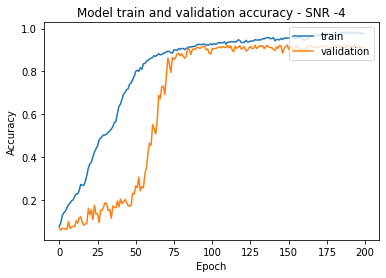

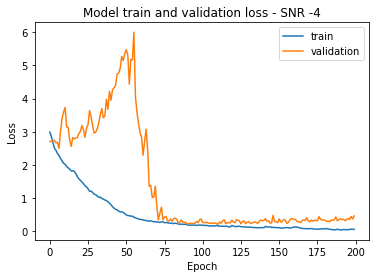


Score of SNR on All SNR model without Transfer Learning -4 = 96.03729844093323

Training SNR = -4 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 5s 274ms/step - loss: 0.1272 - accuracy: 0.9618 - val_loss: 0.1415 - val_accuracy: 0.9585
Epoch 2/200
7/7 [==============================] - 2s 272ms/step - loss: 0.0926 - accuracy: 0.9683 - val_loss: 0.1157 - val_accuracy: 0.9594
Epoch 3/200
7/7 [==============================] - 2s 271ms/step - loss: 0.0815 - accuracy: 0.9719 - val_loss: 0.1075 - val_accuracy: 0.9641
Epoch 4/200
7/7 [==============================] - 2s 274ms/step - loss: 0.0658 - accuracy: 0.9781 - val_loss: 0.1225 - val_accuracy: 0.9636
Epoch 5/200
7/7 [==============================] - 2s 275ms/step - loss: 0.0621 - accuracy: 0.9800 - val_loss: 0.1444 - val_accuracy: 0.9664
Epoch 6/200
7/7 [==============================] - 2s 276ms/step - loss: 0.0531 - accuracy: 0.9823 - val_loss: 0.1575 - val_accuracy: 0.9566
Epoch 7/200
7/7 [=

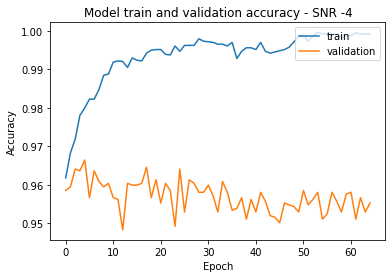

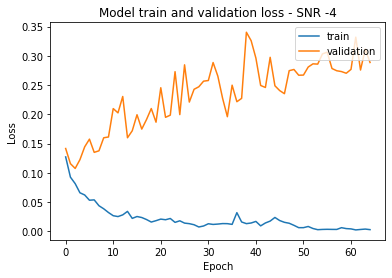

Score of SNR on High SNR model without Transfer Learning -4 = 91.60839319229126

Training SNR = -4 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 6s 274ms/step - loss: 0.3635 - accuracy: 0.9280 - val_loss: 0.2383 - val_accuracy: 0.9413
Epoch 2/200
7/7 [==============================] - 2s 274ms/step - loss: 0.2325 - accuracy: 0.9363 - val_loss: 0.1898 - val_accuracy: 0.9403
Epoch 3/200
7/7 [==============================] - 2s 274ms/step - loss: 0.1859 - accuracy: 0.9392 - val_loss: 0.1686 - val_accuracy: 0.9408
Epoch 4/200
7/7 [==============================] - 2s 292ms/step - loss: 0.1705 - accuracy: 0.9431 - val_loss: 0.1702 - val_accuracy: 0.9436
Epoch 5/200
7/7 [==============================] - 2s 275ms/step - loss: 0.1511 - accuracy: 0.9455 - val_loss: 0.1755 - val_accuracy: 0.9441
Epoch 6/200
7/7 [==============================] - 2s 274ms/step - loss: 0.1289 - accuracy: 0.9509 - val_loss: 0.1760 - val_accuracy: 0.9436
Epoch 7/200
7/7 [

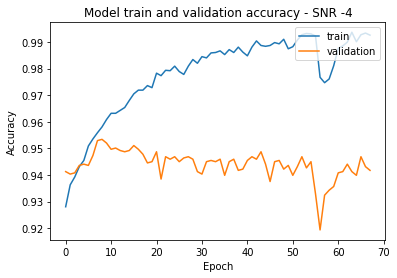

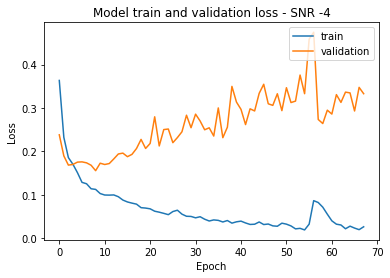

Score of SNR on low SNR model without Transfer Learning -4 = 93.28671097755432

Training SNR = -4 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 6s 274ms/step - loss: 0.1623 - accuracy: 0.9464 - val_loss: 0.1465 - val_accuracy: 0.9455
Epoch 2/200
7/7 [==============================] - 2s 272ms/step - loss: 0.1199 - accuracy: 0.9546 - val_loss: 0.2356 - val_accuracy: 0.9254
Epoch 3/200
7/7 [==============================] - 2s 273ms/step - loss: 0.1103 - accuracy: 0.9601 - val_loss: 0.1504 - val_accuracy: 0.9464
Epoch 4/200
7/7 [==============================] - 2s 275ms/step - loss: 0.0834 - accuracy: 0.9703 - val_loss: 0.1821 - val_accuracy: 0.9497
Epoch 5/200
7/7 [==============================] - 2s 276ms/step - loss: 0.0726 - accuracy: 0.9753 - val_loss: 0.1563 - val_accuracy: 0.9543
Epoch 6/200
7/7 [==============================] - 2s 277ms/step - loss: 0.0607 - accuracy: 0.9809 - val_loss: 0.1499 - val_accuracy: 0.9538
Epoch 7/200
7/7 [==

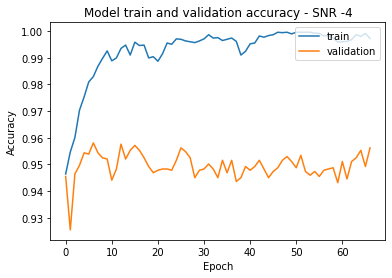

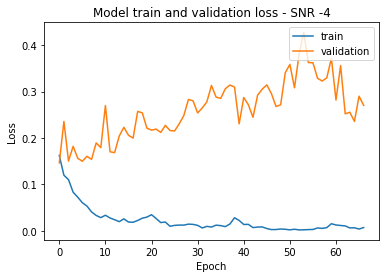

[[ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [90.76923132]
 [ 0.        ]] [[ 0.          0.          0.          0.          0.          0.
   0.          0.         96.03729844  0.        ]
 [ 0.          0.          0.          0.          0.          0.
   0.          0.         96.17715478  0.        ]] [[ 0.          0.          0.          0.          0.          0.
   0.          0.         91.60839319  0.        ]
 [ 0.          0.          0.          0.          0.          0.
   0.          0.         93.37995052  0.        ]] [[ 0.          0.          0.          0.          0.          0.
   0.          0.         93.28671098  0.        ]
 [ 0.          0.          0.          0.          0.          0.
   0.          0.         94.54545379  0.        ]]

Training SNR = -2 Data

Epoch 1/200
7/7 [==============================] - 7s 428ms/step - loss: 3.0075 - accuracy: 0.0730 - val_loss: 2.7047 -

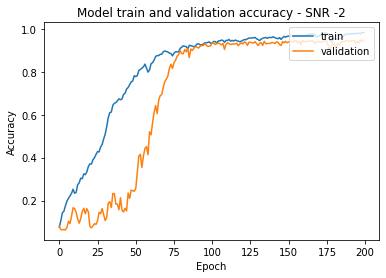

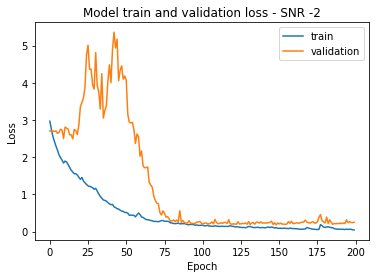


Score of SNR on All SNR model without Transfer Learning -2 = 97.24941849708557

Training SNR = -2 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 5s 273ms/step - loss: 0.1009 - accuracy: 0.9697 - val_loss: 0.0917 - val_accuracy: 0.9702
Epoch 2/200
7/7 [==============================] - 2s 274ms/step - loss: 0.0714 - accuracy: 0.9753 - val_loss: 0.0816 - val_accuracy: 0.9781
Epoch 3/200
7/7 [==============================] - 2s 273ms/step - loss: 0.0593 - accuracy: 0.9801 - val_loss: 0.0717 - val_accuracy: 0.9804
Epoch 4/200
7/7 [==============================] - 2s 274ms/step - loss: 0.0471 - accuracy: 0.9845 - val_loss: 0.0798 - val_accuracy: 0.9753
Epoch 5/200
7/7 [==============================] - 2s 273ms/step - loss: 0.0387 - accuracy: 0.9879 - val_loss: 0.1022 - val_accuracy: 0.9762
Epoch 6/200
7/7 [==============================] - 2s 274ms/step - loss: 0.0357 - accuracy: 0.9879 - val_loss: 0.1070 - val_accuracy: 0.9744
Epoch 7/200
7/7 [=

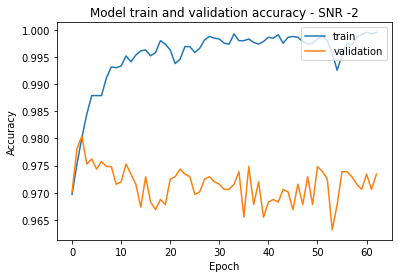

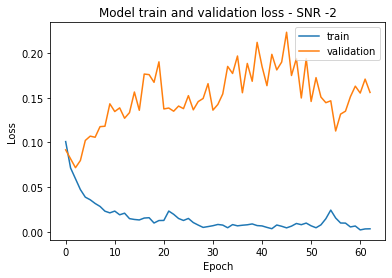

Score of SNR on High SNR model without Transfer Learning -2 = 96.13053798675537

Training SNR = -2 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 6s 273ms/step - loss: 0.2081 - accuracy: 0.9518 - val_loss: 0.1835 - val_accuracy: 0.9483
Epoch 2/200
7/7 [==============================] - 2s 274ms/step - loss: 0.1423 - accuracy: 0.9523 - val_loss: 0.1298 - val_accuracy: 0.9571
Epoch 3/200
7/7 [==============================] - 2s 276ms/step - loss: 0.1164 - accuracy: 0.9557 - val_loss: 0.1261 - val_accuracy: 0.9557
Epoch 4/200
7/7 [==============================] - 2s 275ms/step - loss: 0.0908 - accuracy: 0.9652 - val_loss: 0.1221 - val_accuracy: 0.9608
Epoch 5/200
7/7 [==============================] - 2s 273ms/step - loss: 0.0810 - accuracy: 0.9692 - val_loss: 0.1278 - val_accuracy: 0.9618
Epoch 6/200
7/7 [==============================] - 2s 274ms/step - loss: 0.0737 - accuracy: 0.9714 - val_loss: 0.1317 - val_accuracy: 0.9622
Epoch 7/200
7/7 [

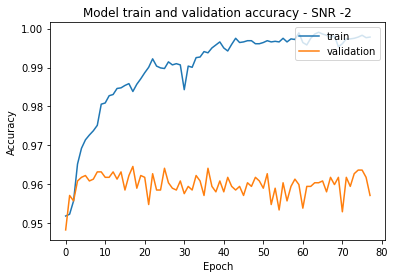

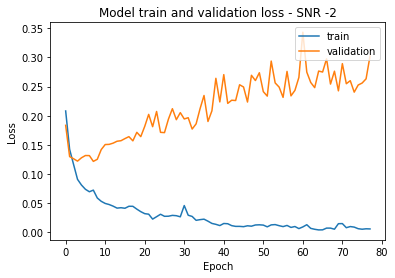

Score of SNR on low SNR model without Transfer Learning -2 = 95.33799290657043

Training SNR = -2 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 6s 276ms/step - loss: 0.1355 - accuracy: 0.9540 - val_loss: 0.1141 - val_accuracy: 0.9608
Epoch 2/200
7/7 [==============================] - 2s 272ms/step - loss: 0.1025 - accuracy: 0.9633 - val_loss: 0.1140 - val_accuracy: 0.9618
Epoch 3/200
7/7 [==============================] - 2s 274ms/step - loss: 0.0857 - accuracy: 0.9681 - val_loss: 0.1166 - val_accuracy: 0.9622
Epoch 4/200
7/7 [==============================] - 2s 276ms/step - loss: 0.0723 - accuracy: 0.9764 - val_loss: 0.1132 - val_accuracy: 0.9636
Epoch 5/200
7/7 [==============================] - 2s 277ms/step - loss: 0.0571 - accuracy: 0.9828 - val_loss: 0.1406 - val_accuracy: 0.9646
Epoch 6/200
7/7 [==============================] - 2s 277ms/step - loss: 0.0484 - accuracy: 0.9849 - val_loss: 0.1221 - val_accuracy: 0.9669
Epoch 7/200
7/7 [==

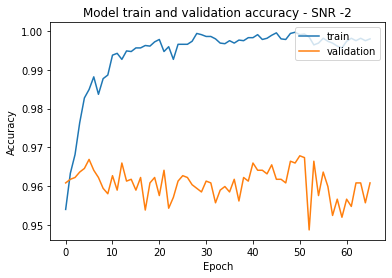

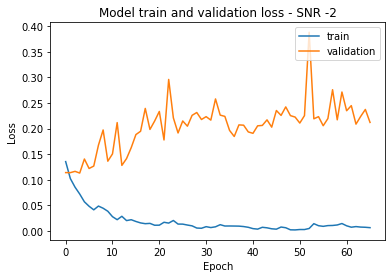

[[ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [90.76923132]
 [93.70629191]] [[ 0.          0.          0.          0.          0.          0.
   0.          0.         96.03729844 97.2494185 ]
 [ 0.          0.          0.          0.          0.          0.
   0.          0.         96.17715478 97.94871807]] [[ 0.          0.          0.          0.          0.          0.
   0.          0.         91.60839319 96.13053799]
 [ 0.          0.          0.          0.          0.          0.
   0.          0.         93.37995052 95.9440589 ]] [[ 0.          0.          0.          0.          0.          0.
   0.          0.         93.28671098 95.33799291]
 [ 0.          0.          0.          0.          0.          0.
   0.          0.         94.54545379 96.36363387]]


In [ ]:
for i in range(8, 10):

  iq_data_complex = np.reshape(x_data_iq_data[:,i].flatten()[::2] + 1j*x_data_iq_data[:,i].flatten()[1::2], (x_dim[0]*x_dim[2], num_samples))
  iq_data_angle_curr = normalize(np.angle(iq_data_complex))
  iq_data_angle_curr = np.reshape(iq_data_angle_curr, (x_dim[0]*x_dim[2], num_samples, 1))
  y_labels_curr = to_categorical(y_labels_data[:,i].flatten())


  X_train_curr, X_test_valid_curr, Y_train_curr, Y_test_valid_curr = train_test_split(iq_data_angle_curr, y_labels_curr, test_size=0.4)
  X_validation_curr, X_test_curr, Y_validation_curr, Y_test_curr = train_test_split(X_test_valid_curr, Y_test_valid_curr, test_size=0.5)

  scores_without_tf_angle[i] = train_data_1D(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)
  scores_tf_allsnr_angle[:,i] = train_data_on_all_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, model_folder_all, i)
  scores_tf_highsnr_angle[:,i] = train_data_on_high_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, model_folder_high, i)
  scores_tf_lowsnr_angle[:,i] = train_data_on_low_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, model_folder_low, i)

  print(scores_without_tf_angle, scores_tf_allsnr_angle, scores_tf_highsnr_angle, scores_tf_lowsnr_angle)

## IQ A/P

In [13]:
scores_without_tf_ap = np.zeros(shape=(10,1))
scores_tf_allsnr_ap = np.zeros(shape=(2,10))
scores_tf_highsnr_ap = np.zeros(shape=(2,10))
scores_tf_lowsnr_ap = np.zeros(shape=(2,10))

In [14]:
model_folder_all = "/gdrive/My Drive/Trained Models/iq/iq_ap_allSNR.tf"
model_folder_high = "/gdrive/My Drive/Trained Models/iq/iq_ap_highSNR.tf"
model_folder_low = "/gdrive/My Drive/Trained Models/iq/iq_ap_lowSNR.tf"


Training SNR = -20 Data

Epoch 1/200
7/7 [==============================] - 28s 454ms/step - loss: 3.0641 - accuracy: 0.0667 - val_loss: 2.7081 - val_accuracy: 0.0601
Epoch 2/200
7/7 [==============================] - 2s 265ms/step - loss: 2.9635 - accuracy: 0.0665 - val_loss: 2.7081 - val_accuracy: 0.0657
Epoch 3/200
7/7 [==============================] - 2s 263ms/step - loss: 2.9011 - accuracy: 0.0688 - val_loss: 2.7089 - val_accuracy: 0.0629
Epoch 4/200
7/7 [==============================] - 2s 264ms/step - loss: 2.8687 - accuracy: 0.0741 - val_loss: 2.7104 - val_accuracy: 0.0573
Epoch 5/200
7/7 [==============================] - 2s 266ms/step - loss: 2.8527 - accuracy: 0.0687 - val_loss: 2.7135 - val_accuracy: 0.0583
Epoch 6/200
7/7 [==============================] - 2s 268ms/step - loss: 2.8254 - accuracy: 0.0670 - val_loss: 2.7180 - val_accuracy: 0.0550
Epoch 7/200
7/7 [==============================] - 2s 269ms/step - loss: 2.7994 - accuracy: 0.0687 - val_loss: 2.7212 - val_acc

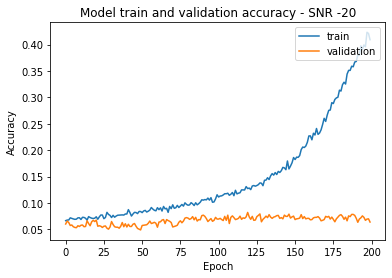

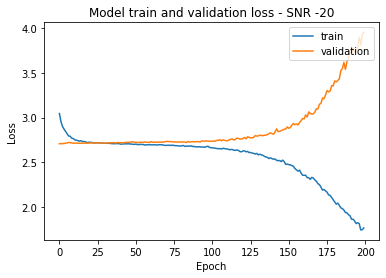


Score of SNR on All SNR model without Transfer Learning -20 = 46.666666865348816

Training SNR = -20 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 6s 285ms/step - loss: 6.2348 - accuracy: 0.2042 - val_loss: 2.1726 - val_accuracy: 0.4196
Epoch 2/200
7/7 [==============================] - 2s 284ms/step - loss: 4.9676 - accuracy: 0.2733 - val_loss: 1.9725 - val_accuracy: 0.4322
Epoch 3/200
7/7 [==============================] - 2s 286ms/step - loss: 4.2513 - accuracy: 0.3108 - val_loss: 2.0270 - val_accuracy: 0.4098
Epoch 4/200
7/7 [==============================] - 2s 289ms/step - loss: 3.7651 - accuracy: 0.3239 - val_loss: 1.9743 - val_accuracy: 0.4154
Epoch 5/200
7/7 [==============================] - 2s 289ms/step - loss: 3.3046 - accuracy: 0.3411 - val_loss: 1.9980 - val_accuracy: 0.3921
Epoch 6/200
7/7 [==============================] - 2s 291ms/step - loss: 3.0001 - accuracy: 0.3464 - val_loss: 2.0118 - val_accuracy: 0.3930
Epoch 7/200
7/7

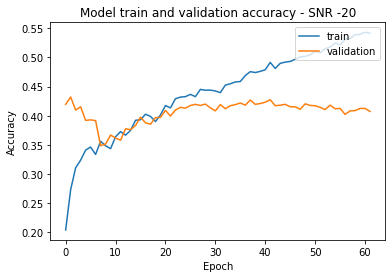

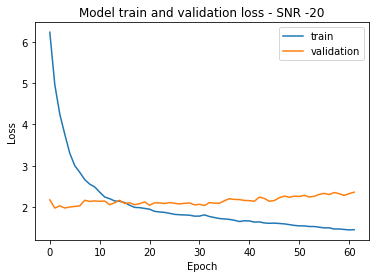

Score of SNR on High SNR model without Transfer Learning -20 = 5.827505886554718

Training SNR = -20 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 6s 287ms/step - loss: 8.9455 - accuracy: 0.0777 - val_loss: 19.6174 - val_accuracy: 0.0657
Epoch 2/200
7/7 [==============================] - 2s 287ms/step - loss: 7.1327 - accuracy: 0.0744 - val_loss: 20.2395 - val_accuracy: 0.0615
Epoch 3/200
7/7 [==============================] - 2s 287ms/step - loss: 5.9305 - accuracy: 0.0797 - val_loss: 17.4730 - val_accuracy: 0.0639
Epoch 4/200
7/7 [==============================] - 2s 289ms/step - loss: 5.4414 - accuracy: 0.0660 - val_loss: 16.3993 - val_accuracy: 0.0732
Epoch 5/200
7/7 [==============================] - 2s 293ms/step - loss: 5.7627 - accuracy: 0.0695 - val_loss: 19.3240 - val_accuracy: 0.0709
Epoch 6/200
7/7 [==============================] - 2s 292ms/step - loss: 7.7715 - accuracy: 0.0713 - val_loss: 24.5283 - val_accuracy: 0.0699
Epoch 7/2

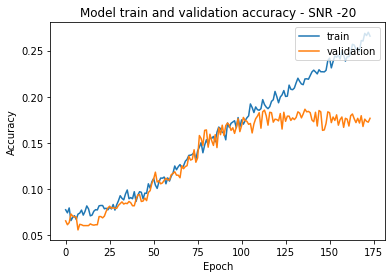

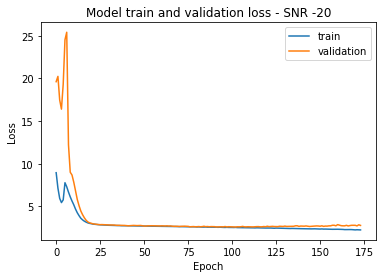

Score of SNR on low SNR model without Transfer Learning -20 = 49.27738904953003

Training SNR = -20 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 6s 286ms/step - loss: 4.4587 - accuracy: 0.2639 - val_loss: 2.1284 - val_accuracy: 0.4494
Epoch 2/200
7/7 [==============================] - 2s 286ms/step - loss: 3.5941 - accuracy: 0.3086 - val_loss: 2.0674 - val_accuracy: 0.4252
Epoch 3/200
7/7 [==============================] - 2s 289ms/step - loss: 3.0311 - accuracy: 0.3582 - val_loss: 2.0037 - val_accuracy: 0.4387
Epoch 4/200
7/7 [==============================] - 2s 293ms/step - loss: 2.6891 - accuracy: 0.3759 - val_loss: 2.0381 - val_accuracy: 0.4210
Epoch 5/200
7/7 [==============================] - 2s 293ms/step - loss: 2.4035 - accuracy: 0.3921 - val_loss: 2.1277 - val_accuracy: 0.4140
Epoch 6/200
7/7 [==============================] - 2s 296ms/step - loss: 2.2263 - accuracy: 0.3961 - val_loss: 2.0582 - val_accuracy: 0.4266
Epoch 7/200
7/7 [

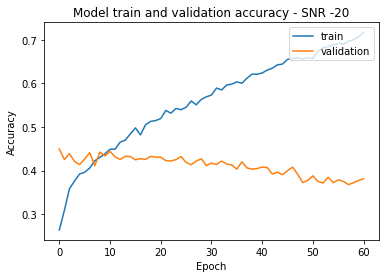

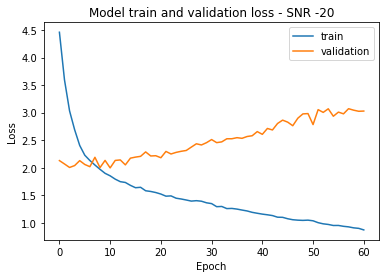

[[6.57342672]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]] [[46.66666687  0.          0.          0.          0.          0.
   0.          0.          0.          0.        ]
 [41.02564156  0.          0.          0.          0.          0.
   0.          0.          0.          0.        ]] [[ 5.82750589  0.          0.          0.          0.          0.
   0.          0.          0.          0.        ]
 [16.41025692  0.          0.          0.          0.          0.
   0.          0.          0.          0.        ]] [[49.27738905  0.          0.          0.          0.          0.
   0.          0.          0.          0.        ]
 [37.7622366   0.          0.          0.          0.          0.
   0.          0.          0.          0.        ]]

Training SNR = -18 Data

Epoch 1/200
7/7 [==============================] - 7s 439ms/step - loss: 3.0984 - accuracy: 0.0699 - val_loss: 2.7082 - val_accu

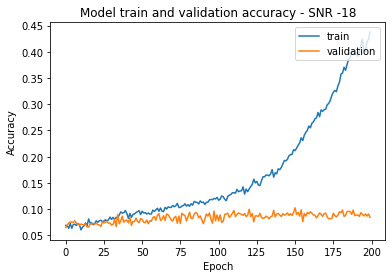

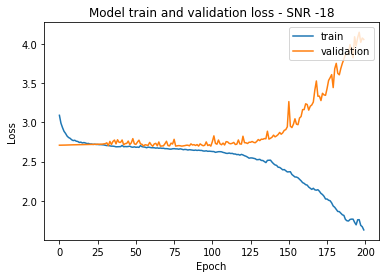


Score of SNR on All SNR model without Transfer Learning -18 = 54.68531250953674

Training SNR = -18 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 6s 289ms/step - loss: 4.6352 - accuracy: 0.3312 - val_loss: 1.8412 - val_accuracy: 0.4550
Epoch 2/200
7/7 [==============================] - 2s 286ms/step - loss: 3.0459 - accuracy: 0.4496 - val_loss: 1.7264 - val_accuracy: 0.4816
Epoch 3/200
7/7 [==============================] - 2s 288ms/step - loss: 2.6281 - accuracy: 0.4671 - val_loss: 1.6138 - val_accuracy: 0.4979
Epoch 4/200
7/7 [==============================] - 2s 289ms/step - loss: 2.3165 - accuracy: 0.4814 - val_loss: 1.5796 - val_accuracy: 0.5170
Epoch 5/200
7/7 [==============================] - 2s 289ms/step - loss: 2.0800 - accuracy: 0.5088 - val_loss: 1.5745 - val_accuracy: 0.5254
Epoch 6/200
7/7 [==============================] - 2s 291ms/step - loss: 1.9519 - accuracy: 0.5150 - val_loss: 1.5845 - val_accuracy: 0.5319
Epoch 7/200
7/7 

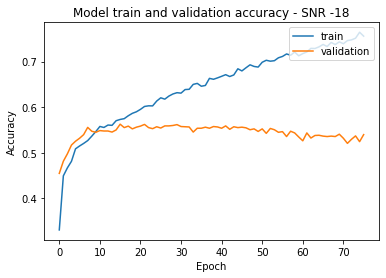

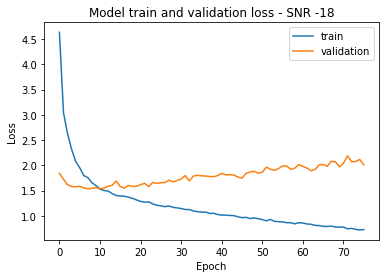

Score of SNR on High SNR model without Transfer Learning -18 = 6.247086077928543

Training SNR = -18 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 6s 288ms/step - loss: 8.4991 - accuracy: 0.0956 - val_loss: 20.4982 - val_accuracy: 0.0704
Epoch 2/200
7/7 [==============================] - 2s 288ms/step - loss: 6.8077 - accuracy: 0.0991 - val_loss: 22.2719 - val_accuracy: 0.0695
Epoch 3/200
7/7 [==============================] - 2s 288ms/step - loss: 5.9627 - accuracy: 0.0926 - val_loss: 20.0855 - val_accuracy: 0.0713
Epoch 4/200
7/7 [==============================] - 2s 290ms/step - loss: 5.2716 - accuracy: 0.0946 - val_loss: 16.1767 - val_accuracy: 0.0685
Epoch 5/200
7/7 [==============================] - 2s 294ms/step - loss: 5.2418 - accuracy: 0.0858 - val_loss: 24.3533 - val_accuracy: 0.0760
Epoch 6/200
7/7 [==============================] - 2s 295ms/step - loss: 6.9117 - accuracy: 0.0766 - val_loss: 23.2210 - val_accuracy: 0.0737
Epoch 7/2

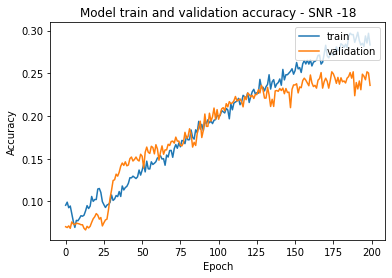

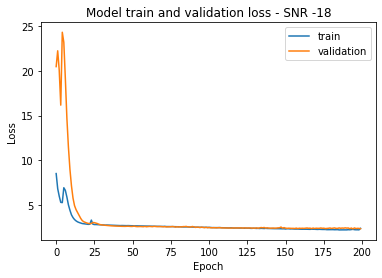

Score of SNR on low SNR model without Transfer Learning -18 = 52.773892879486084

Training SNR = -18 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 6s 290ms/step - loss: 3.3301 - accuracy: 0.3952 - val_loss: 2.0990 - val_accuracy: 0.4471
Epoch 2/200
7/7 [==============================] - 2s 285ms/step - loss: 2.4169 - accuracy: 0.4549 - val_loss: 1.6721 - val_accuracy: 0.5175
Epoch 3/200
7/7 [==============================] - 2s 287ms/step - loss: 2.1152 - accuracy: 0.4862 - val_loss: 1.5662 - val_accuracy: 0.5333
Epoch 4/200
7/7 [==============================] - 2s 287ms/step - loss: 1.9183 - accuracy: 0.5040 - val_loss: 1.6183 - val_accuracy: 0.5301
Epoch 5/200
7/7 [==============================] - 2s 290ms/step - loss: 1.7414 - accuracy: 0.5243 - val_loss: 1.6279 - val_accuracy: 0.5413
Epoch 6/200
7/7 [==============================] - 2s 289ms/step - loss: 1.6433 - accuracy: 0.5285 - val_loss: 1.6512 - val_accuracy: 0.5417
Epoch 7/200
7/7 

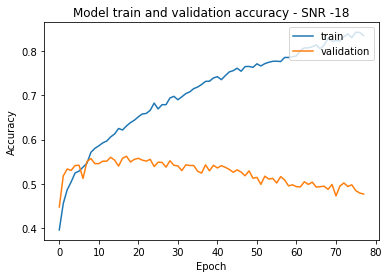

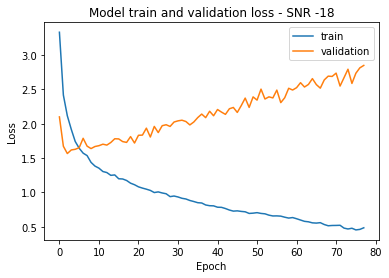

[[6.57342672]
 [8.25174823]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]] [[46.66666687 54.68531251  0.          0.          0.          0.
   0.          0.          0.          0.        ]
 [41.02564156 54.63869572  0.          0.          0.          0.
   0.          0.          0.          0.        ]] [[ 5.82750589  6.24708608  0.          0.          0.          0.
   0.          0.          0.          0.        ]
 [16.41025692 25.87412596  0.          0.          0.          0.
   0.          0.          0.          0.        ]] [[49.27738905 52.77389288  0.          0.          0.          0.
   0.          0.          0.          0.        ]
 [37.7622366  46.75990641  0.          0.          0.          0.
   0.          0.          0.          0.        ]]

Training SNR = -16 Data

Epoch 1/200
7/7 [==============================] - 7s 450ms/step - loss: 3.0965 - accuracy: 0.0683 - val_loss: 2.7079 - val_accu

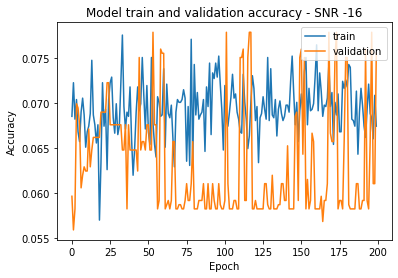

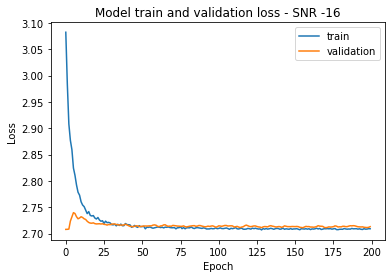


Score of SNR on All SNR model without Transfer Learning -16 = 63.54312300682068

Training SNR = -16 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 6s 289ms/step - loss: 2.7726 - accuracy: 0.5063 - val_loss: 1.5493 - val_accuracy: 0.5590
Epoch 2/200
7/7 [==============================] - 2s 289ms/step - loss: 1.7677 - accuracy: 0.6270 - val_loss: 1.2275 - val_accuracy: 0.6009
Epoch 3/200
7/7 [==============================] - 2s 288ms/step - loss: 1.4502 - accuracy: 0.6435 - val_loss: 1.1153 - val_accuracy: 0.6415
Epoch 4/200
7/7 [==============================] - 2s 292ms/step - loss: 1.3127 - accuracy: 0.6508 - val_loss: 1.0682 - val_accuracy: 0.6578
Epoch 5/200
7/7 [==============================] - 2s 294ms/step - loss: 1.1933 - accuracy: 0.6629 - val_loss: 1.0464 - val_accuracy: 0.6741
Epoch 6/200
7/7 [==============================] - 2s 290ms/step - loss: 1.1000 - accuracy: 0.6777 - val_loss: 1.0729 - val_accuracy: 0.6695
Epoch 7/200
7/7 

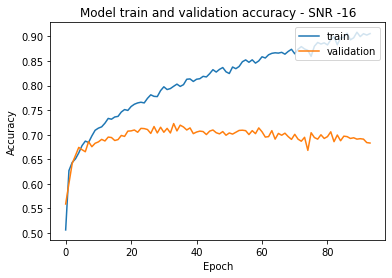

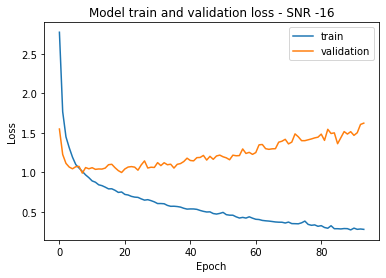

Score of SNR on High SNR model without Transfer Learning -16 = 6.899766623973846

Training SNR = -16 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 6s 287ms/step - loss: 7.8525 - accuracy: 0.1161 - val_loss: 19.7062 - val_accuracy: 0.0788
Epoch 2/200
7/7 [==============================] - 2s 287ms/step - loss: 6.5783 - accuracy: 0.1372 - val_loss: 20.8725 - val_accuracy: 0.0807
Epoch 3/200
7/7 [==============================] - 2s 288ms/step - loss: 5.5680 - accuracy: 0.1423 - val_loss: 21.1757 - val_accuracy: 0.0886
Epoch 4/200
7/7 [==============================] - 2s 288ms/step - loss: 4.6497 - accuracy: 0.1594 - val_loss: 16.6923 - val_accuracy: 0.0848
Epoch 5/200
7/7 [==============================] - 2s 290ms/step - loss: 4.2206 - accuracy: 0.1706 - val_loss: 17.0607 - val_accuracy: 0.0825
Epoch 6/200
7/7 [==============================] - 2s 293ms/step - loss: 4.1773 - accuracy: 0.1784 - val_loss: 13.3646 - val_accuracy: 0.0918
Epoch 7/2

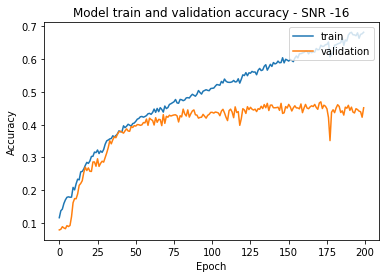

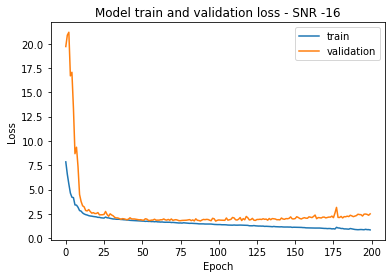

Score of SNR on low SNR model without Transfer Learning -16 = 59.34731960296631

Training SNR = -16 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 6s 286ms/step - loss: 1.9376 - accuracy: 0.5821 - val_loss: 1.5286 - val_accuracy: 0.5814
Epoch 2/200
7/7 [==============================] - 2s 287ms/step - loss: 1.4079 - accuracy: 0.6233 - val_loss: 1.3069 - val_accuracy: 0.5991
Epoch 3/200
7/7 [==============================] - 2s 286ms/step - loss: 1.2646 - accuracy: 0.6291 - val_loss: 1.2684 - val_accuracy: 0.6289
Epoch 4/200
7/7 [==============================] - 2s 287ms/step - loss: 1.1343 - accuracy: 0.6600 - val_loss: 1.2633 - val_accuracy: 0.6373
Epoch 5/200
7/7 [==============================] - 2s 287ms/step - loss: 1.0668 - accuracy: 0.6732 - val_loss: 1.2617 - val_accuracy: 0.6513
Epoch 6/200
7/7 [==============================] - 2s 289ms/step - loss: 1.0028 - accuracy: 0.6887 - val_loss: 1.2077 - val_accuracy: 0.6545
Epoch 7/200
7/7 [

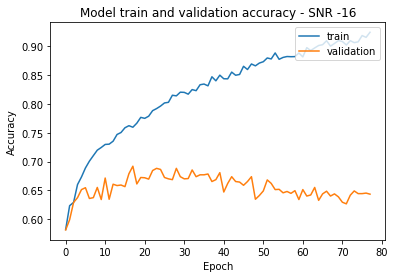

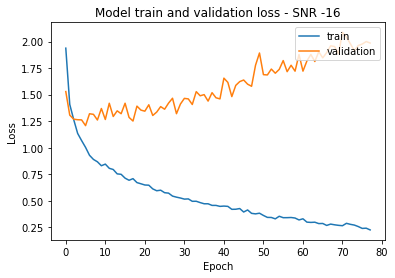

[[6.57342672]
 [8.25174823]
 [5.54778539]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]] [[46.66666687 54.68531251 63.54312301  0.          0.          0.
   0.          0.          0.          0.        ]
 [41.02564156 54.63869572 68.71795058  0.          0.          0.
   0.          0.          0.          0.        ]] [[ 5.82750589  6.24708608  6.89976662  0.          0.          0.
   0.          0.          0.          0.        ]
 [16.41025692 25.87412596 43.49650443  0.          0.          0.
   0.          0.          0.          0.        ]] [[49.27738905 52.77389288 59.3473196   0.          0.          0.
   0.          0.          0.          0.        ]
 [37.7622366  46.75990641 63.03030252  0.          0.          0.
   0.          0.          0.          0.        ]]


In [ ]:
for i in range(0, 3):

  iq_data_complex = np.reshape(x_data_iq_data[:,i].flatten()[::2] + 1j*x_data_iq_data[:,i].flatten()[1::2], (x_dim[0]*x_dim[2], num_samples))
  iq_data_angle_curr = normalize(np.angle(iq_data_complex))
  iq_data_abs_curr = scale(np.absolute(iq_data_complex))
  iq_data_ap_curr = np.zeros(shape=(x_dim[0]*x_dim[2], num_samples, 2))

  for k in range(x_dim[0]*x_dim[2]):
    for j in range(num_samples):
      iq_data_ap_curr[k][j][0] = iq_data_abs_curr[k][j]
      iq_data_ap_curr[k][j][1] = iq_data_angle_curr[k][j]

  y_labels_curr = to_categorical(y_labels_data[:,i].flatten())

  X_train_curr, X_test_valid_curr, Y_train_curr, Y_test_valid_curr = train_test_split(iq_data_ap_curr, y_labels_curr, test_size=0.4)
  X_validation_curr, X_test_curr, Y_validation_curr, Y_test_curr = train_test_split(X_test_valid_curr, Y_test_valid_curr, test_size=0.5)

  scores_without_tf_ap[i] = train_data_2D(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)
  scores_tf_allsnr_ap[:,i] = train_data_on_all_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, model_folder_all, i)
  scores_tf_highsnr_ap[:,i] = train_data_on_high_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, model_folder_high, i)
  scores_tf_lowsnr_ap[:,i] = train_data_on_low_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, model_folder_low, i)

  print(scores_without_tf_ap, scores_tf_allsnr_ap, scores_tf_highsnr_ap, scores_tf_lowsnr_ap)


Training SNR = -10 Data

Epoch 1/200
7/7 [==============================] - 8s 443ms/step - loss: 3.0753 - accuracy: 0.0706 - val_loss: 2.7076 - val_accuracy: 0.0615
Epoch 2/200
7/7 [==============================] - 2s 281ms/step - loss: 2.9673 - accuracy: 0.0736 - val_loss: 2.7072 - val_accuracy: 0.0601
Epoch 3/200
7/7 [==============================] - 2s 283ms/step - loss: 2.8822 - accuracy: 0.0860 - val_loss: 2.7061 - val_accuracy: 0.0699
Epoch 4/200
7/7 [==============================] - 2s 284ms/step - loss: 2.7099 - accuracy: 0.1069 - val_loss: 2.6785 - val_accuracy: 0.0699
Epoch 5/200
7/7 [==============================] - 2s 285ms/step - loss: 2.5912 - accuracy: 0.1252 - val_loss: 2.6438 - val_accuracy: 0.0755
Epoch 6/200
7/7 [==============================] - 2s 285ms/step - loss: 2.5226 - accuracy: 0.1223 - val_loss: 2.4980 - val_accuracy: 0.1161
Epoch 7/200
7/7 [==============================] - 2s 289ms/step - loss: 2.4461 - accuracy: 0.1440 - val_loss: 2.6946 - val_accu

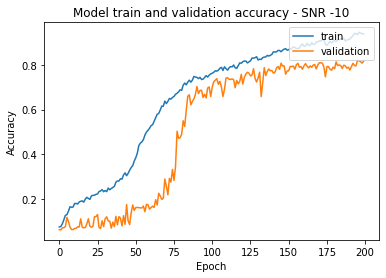

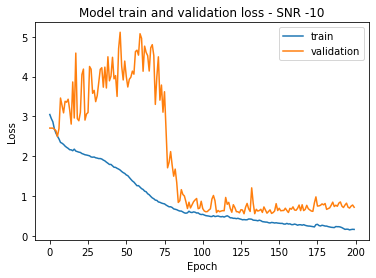


Score of SNR on All SNR model without Transfer Learning -10 = 74.68531727790833

Training SNR = -10 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 6s 287ms/step - loss: 0.3784 - accuracy: 0.8967 - val_loss: 0.8432 - val_accuracy: 0.7538
Epoch 2/200
7/7 [==============================] - 2s 286ms/step - loss: 0.2643 - accuracy: 0.8996 - val_loss: 0.7640 - val_accuracy: 0.7716
Epoch 3/200
7/7 [==============================] - 2s 287ms/step - loss: 0.2411 - accuracy: 0.9071 - val_loss: 0.7081 - val_accuracy: 0.7800
Epoch 4/200
7/7 [==============================] - 2s 287ms/step - loss: 0.2111 - accuracy: 0.9186 - val_loss: 0.6966 - val_accuracy: 0.7949
Epoch 5/200
7/7 [==============================] - 2s 289ms/step - loss: 0.1932 - accuracy: 0.9259 - val_loss: 0.7042 - val_accuracy: 0.8112
Epoch 6/200
7/7 [==============================] - 2s 292ms/step - loss: 0.1790 - accuracy: 0.9352 - val_loss: 0.6207 - val_accuracy: 0.8242
Epoch 7/200
7/7 

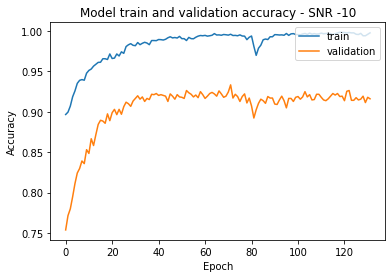

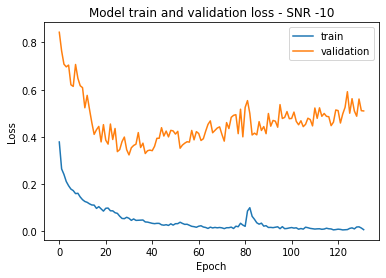

Score of SNR on High SNR model without Transfer Learning -10 = 10.90909093618393

Training SNR = -10 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 6s 289ms/step - loss: 3.5408 - accuracy: 0.4603 - val_loss: 5.4569 - val_accuracy: 0.4312
Epoch 2/200
7/7 [==============================] - 2s 286ms/step - loss: 1.9855 - accuracy: 0.6089 - val_loss: 6.2696 - val_accuracy: 0.3730
Epoch 3/200
7/7 [==============================] - 2s 289ms/step - loss: 1.3552 - accuracy: 0.6716 - val_loss: 4.9392 - val_accuracy: 0.4503
Epoch 4/200
7/7 [==============================] - 2s 289ms/step - loss: 1.1463 - accuracy: 0.6872 - val_loss: 3.5585 - val_accuracy: 0.5198
Epoch 5/200
7/7 [==============================] - 2s 290ms/step - loss: 0.9129 - accuracy: 0.7058 - val_loss: 1.9292 - val_accuracy: 0.6783
Epoch 6/200
7/7 [==============================] - 2s 292ms/step - loss: 0.8106 - accuracy: 0.7350 - val_loss: 1.1894 - val_accuracy: 0.7249
Epoch 7/200
7/7

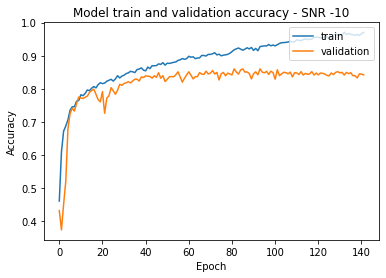

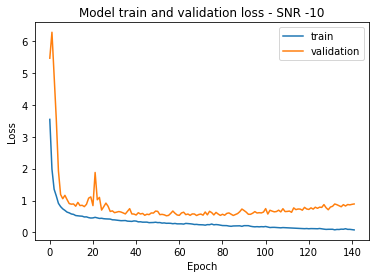

Score of SNR on low SNR model without Transfer Learning -10 = 73.51981401443481

Training SNR = -10 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 6s 288ms/step - loss: 0.3542 - accuracy: 0.8864 - val_loss: 0.9354 - val_accuracy: 0.7478
Epoch 2/200
7/7 [==============================] - 2s 289ms/step - loss: 0.2719 - accuracy: 0.8909 - val_loss: 0.8772 - val_accuracy: 0.7702
Epoch 3/200
7/7 [==============================] - 2s 289ms/step - loss: 0.2394 - accuracy: 0.9097 - val_loss: 0.9100 - val_accuracy: 0.7646
Epoch 4/200
7/7 [==============================] - 2s 289ms/step - loss: 0.2101 - accuracy: 0.9221 - val_loss: 0.7512 - val_accuracy: 0.8107
Epoch 5/200
7/7 [==============================] - 2s 290ms/step - loss: 0.1912 - accuracy: 0.9248 - val_loss: 0.6978 - val_accuracy: 0.8219
Epoch 6/200
7/7 [==============================] - 2s 295ms/step - loss: 0.1790 - accuracy: 0.9332 - val_loss: 0.7130 - val_accuracy: 0.8121
Epoch 7/200
7/7 [

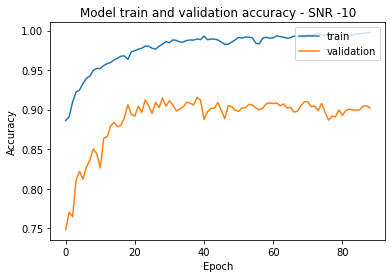

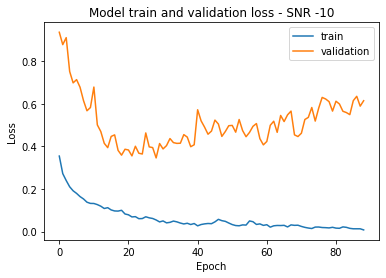

[[ 6.57342672]
 [ 8.25174823]
 [ 5.54778539]
 [ 0.        ]
 [ 0.        ]
 [80.88577986]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]] [[46.66666687 54.68531251 63.54312301  0.          0.         74.68531728
   0.          0.          0.          0.        ]
 [41.02564156 54.63869572 68.71795058  0.          0.         91.84148908
   0.          0.          0.          0.        ]] [[ 5.82750589  6.24708608  6.89976662  0.          0.         10.90909094
   0.          0.          0.          0.        ]
 [16.41025692 25.87412596 43.49650443  0.          0.         84.1958046
   0.          0.          0.          0.        ]] [[49.27738905 52.77389288 59.3473196   0.          0.         73.51981401
   0.          0.          0.          0.        ]
 [37.7622366  46.75990641 63.03030252  0.          0.         88.95105124
   0.          0.          0.          0.        ]]

Training SNR = -8 Data

Epoch 1/200
7/7 [==============================] - 8s 453ms/step - loss:

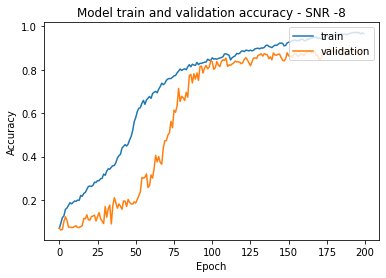

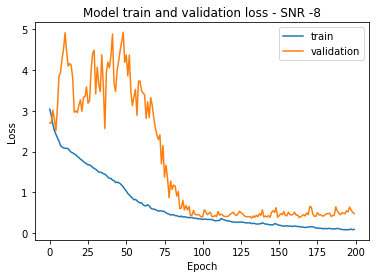


Score of SNR on All SNR model without Transfer Learning -8 = 74.35897588729858

Training SNR = -8 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 6s 286ms/step - loss: 0.2162 - accuracy: 0.9277 - val_loss: 0.8118 - val_accuracy: 0.7646
Epoch 2/200
7/7 [==============================] - 2s 284ms/step - loss: 0.1697 - accuracy: 0.9344 - val_loss: 0.8203 - val_accuracy: 0.7781
Epoch 3/200
7/7 [==============================] - 2s 287ms/step - loss: 0.1491 - accuracy: 0.9453 - val_loss: 0.6984 - val_accuracy: 0.8000
Epoch 4/200
7/7 [==============================] - 2s 287ms/step - loss: 0.1345 - accuracy: 0.9481 - val_loss: 0.6986 - val_accuracy: 0.8149
Epoch 5/200
7/7 [==============================] - 2s 287ms/step - loss: 0.1135 - accuracy: 0.9579 - val_loss: 0.6491 - val_accuracy: 0.8317
Epoch 6/200
7/7 [==============================] - 2s 291ms/step - loss: 0.0982 - accuracy: 0.9650 - val_loss: 0.6561 - val_accuracy: 0.8359
Epoch 7/200
7/7 [=

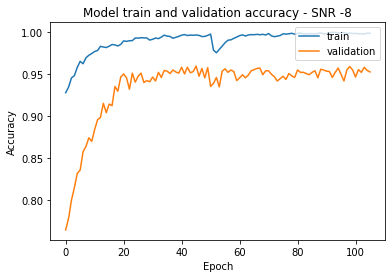

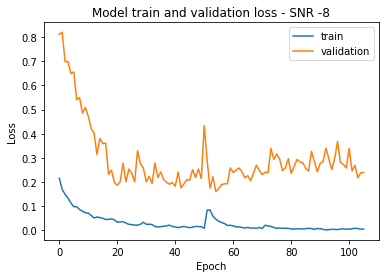

Score of SNR on High SNR model without Transfer Learning -8 = 32.72727131843567

Training SNR = -8 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 6s 287ms/step - loss: 1.9099 - accuracy: 0.6914 - val_loss: 1.3900 - val_accuracy: 0.7753
Epoch 2/200
7/7 [==============================] - 2s 287ms/step - loss: 0.8249 - accuracy: 0.8042 - val_loss: 1.5636 - val_accuracy: 0.7865
Epoch 3/200
7/7 [==============================] - 2s 285ms/step - loss: 0.5847 - accuracy: 0.8264 - val_loss: 2.1712 - val_accuracy: 0.7445
Epoch 4/200
7/7 [==============================] - 2s 289ms/step - loss: 0.4717 - accuracy: 0.8423 - val_loss: 1.4588 - val_accuracy: 0.7981
Epoch 5/200
7/7 [==============================] - 2s 290ms/step - loss: 0.4342 - accuracy: 0.8558 - val_loss: 0.8304 - val_accuracy: 0.8415
Epoch 6/200
7/7 [==============================] - 2s 289ms/step - loss: 0.3857 - accuracy: 0.8626 - val_loss: 0.5375 - val_accuracy: 0.8676
Epoch 7/200
7/7 [

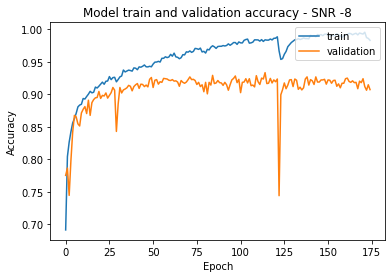

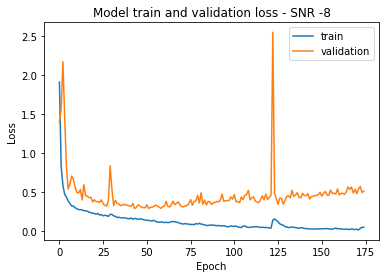

Score of SNR on low SNR model without Transfer Learning -8 = 73.7062931060791

Training SNR = -8 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 6s 287ms/step - loss: 0.2362 - accuracy: 0.9127 - val_loss: 0.9224 - val_accuracy: 0.7855
Epoch 2/200
7/7 [==============================] - 2s 287ms/step - loss: 0.1784 - accuracy: 0.9268 - val_loss: 0.9172 - val_accuracy: 0.7930
Epoch 3/200
7/7 [==============================] - 2s 287ms/step - loss: 0.1666 - accuracy: 0.9350 - val_loss: 0.7797 - val_accuracy: 0.8065
Epoch 4/200
7/7 [==============================] - 2s 289ms/step - loss: 0.1476 - accuracy: 0.9420 - val_loss: 0.8131 - val_accuracy: 0.8214
Epoch 5/200
7/7 [==============================] - 2s 286ms/step - loss: 0.1354 - accuracy: 0.9484 - val_loss: 0.6664 - val_accuracy: 0.8392
Epoch 6/200
7/7 [==============================] - 2s 290ms/step - loss: 0.1227 - accuracy: 0.9551 - val_loss: 0.4612 - val_accuracy: 0.8653
Epoch 7/200
7/7 [===

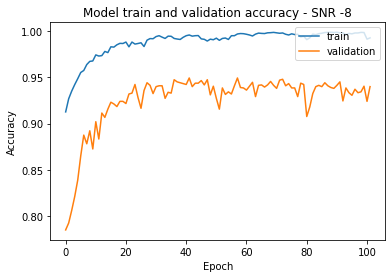

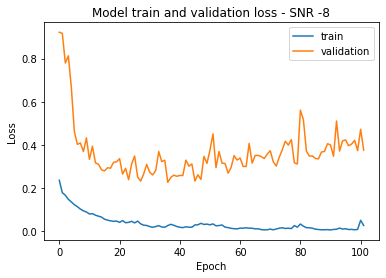

[[ 6.57342672]
 [ 8.25174823]
 [ 5.54778539]
 [ 0.        ]
 [ 0.        ]
 [80.88577986]
 [88.62470984]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]] [[46.66666687 54.68531251 63.54312301  0.          0.         74.68531728
  74.35897589  0.          0.          0.        ]
 [41.02564156 54.63869572 68.71795058  0.          0.         91.84148908
  94.73193288  0.          0.          0.        ]] [[ 5.82750589  6.24708608  6.89976662  0.          0.         10.90909094
  32.72727132  0.          0.          0.        ]
 [16.41025692 25.87412596 43.49650443  0.          0.         84.1958046
  90.06993175  0.          0.          0.        ]] [[49.27738905 52.77389288 59.3473196   0.          0.         73.51981401
  73.70629311  0.          0.          0.        ]
 [37.7622366  46.75990641 63.03030252  0.          0.         88.95105124
  92.5874114   0.          0.          0.        ]]

Training SNR = -6 Data

Epoch 1/200
7/7 [==============================] - 7s 450ms/step - loss:

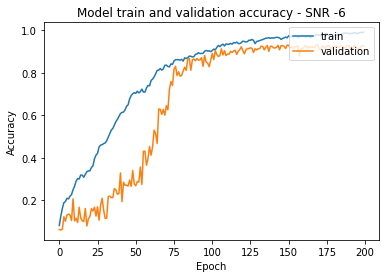

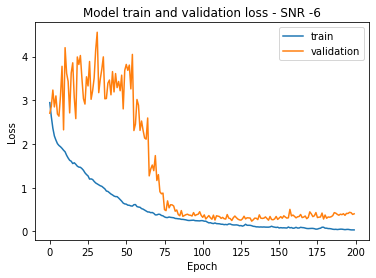


Score of SNR on All SNR model without Transfer Learning -6 = 74.5920717716217

Training SNR = -6 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 6s 288ms/step - loss: 0.1380 - accuracy: 0.9500 - val_loss: 0.8317 - val_accuracy: 0.7702
Epoch 2/200
7/7 [==============================] - 2s 286ms/step - loss: 0.1111 - accuracy: 0.9568 - val_loss: 0.7626 - val_accuracy: 0.7893
Epoch 3/200
7/7 [==============================] - 2s 289ms/step - loss: 0.0965 - accuracy: 0.9652 - val_loss: 0.7902 - val_accuracy: 0.7935
Epoch 4/200
7/7 [==============================] - 2s 289ms/step - loss: 0.0759 - accuracy: 0.9719 - val_loss: 0.7137 - val_accuracy: 0.8196
Epoch 5/200
7/7 [==============================] - 2s 290ms/step - loss: 0.0691 - accuracy: 0.9772 - val_loss: 0.6437 - val_accuracy: 0.8359
Epoch 6/200
7/7 [==============================] - 2s 291ms/step - loss: 0.0604 - accuracy: 0.9798 - val_loss: 0.5991 - val_accuracy: 0.8485
Epoch 7/200
7/7 [==

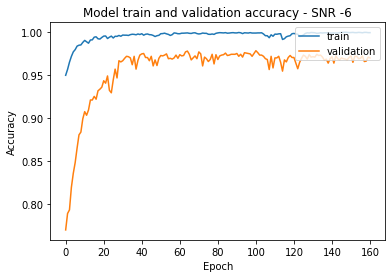

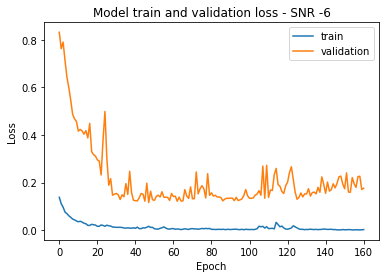

Score of SNR on High SNR model without Transfer Learning -6 = 70.44289112091064

Training SNR = -6 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 6s 285ms/step - loss: 0.8643 - accuracy: 0.8553 - val_loss: 1.0137 - val_accuracy: 0.8452
Epoch 2/200
7/7 [==============================] - 2s 284ms/step - loss: 0.3902 - accuracy: 0.9097 - val_loss: 0.7443 - val_accuracy: 0.8648
Epoch 3/200
7/7 [==============================] - 2s 286ms/step - loss: 0.3008 - accuracy: 0.9150 - val_loss: 0.9046 - val_accuracy: 0.8420
Epoch 4/200
7/7 [==============================] - 2s 288ms/step - loss: 0.2457 - accuracy: 0.9166 - val_loss: 0.5201 - val_accuracy: 0.8793
Epoch 5/200
7/7 [==============================] - 2s 289ms/step - loss: 0.1993 - accuracy: 0.9315 - val_loss: 0.3018 - val_accuracy: 0.9203
Epoch 6/200
7/7 [==============================] - 2s 288ms/step - loss: 0.1830 - accuracy: 0.9375 - val_loss: 0.3107 - val_accuracy: 0.9235
Epoch 7/200
7/7 [

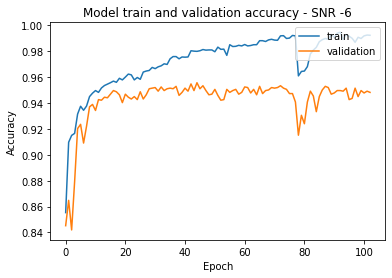

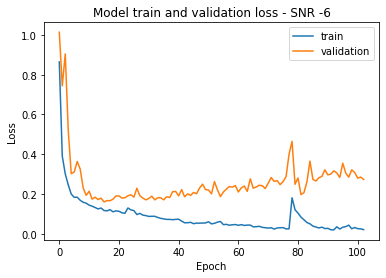

Score of SNR on low SNR model without Transfer Learning -6 = 74.31235313415527

Training SNR = -6 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 6s 286ms/step - loss: 0.1775 - accuracy: 0.9338 - val_loss: 0.8410 - val_accuracy: 0.7907
Epoch 2/200
7/7 [==============================] - 2s 285ms/step - loss: 0.1272 - accuracy: 0.9521 - val_loss: 0.7311 - val_accuracy: 0.8233
Epoch 3/200
7/7 [==============================] - 2s 287ms/step - loss: 0.1116 - accuracy: 0.9590 - val_loss: 0.5366 - val_accuracy: 0.8569
Epoch 4/200
7/7 [==============================] - 2s 289ms/step - loss: 0.0865 - accuracy: 0.9675 - val_loss: 0.4503 - val_accuracy: 0.8793
Epoch 5/200
7/7 [==============================] - 2s 290ms/step - loss: 0.0757 - accuracy: 0.9740 - val_loss: 0.4342 - val_accuracy: 0.8830
Epoch 6/200
7/7 [==============================] - 2s 291ms/step - loss: 0.0696 - accuracy: 0.9759 - val_loss: 0.4351 - val_accuracy: 0.8872
Epoch 7/200
7/7 [==

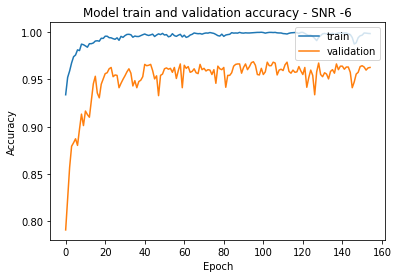

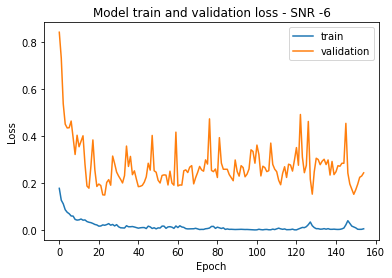

[[ 6.57342672]
 [ 8.25174823]
 [ 5.54778539]
 [ 0.        ]
 [ 0.        ]
 [80.88577986]
 [88.62470984]
 [91.74824953]
 [ 0.        ]
 [ 0.        ]] [[46.66666687 54.68531251 63.54312301  0.          0.         74.68531728
  74.35897589 74.59207177  0.          0.        ]
 [41.02564156 54.63869572 68.71795058  0.          0.         91.84148908
  94.73193288 97.01631665  0.          0.        ]] [[ 5.82750589  6.24708608  6.89976662  0.          0.         10.90909094
  32.72727132 70.44289112  0.          0.        ]
 [16.41025692 25.87412596 43.49650443  0.          0.         84.1958046
  90.06993175 94.63869333  0.          0.        ]] [[49.27738905 52.77389288 59.3473196   0.          0.         73.51981401
  73.70629311 74.31235313  0.          0.        ]
 [37.7622366  46.75990641 63.03030252  0.          0.         88.95105124
  92.5874114  96.03729844  0.          0.        ]]


In [ ]:
for i in range(5, 8):

  iq_data_complex = np.reshape(x_data_iq_data[:,i].flatten()[::2] + 1j*x_data_iq_data[:,i].flatten()[1::2], (x_dim[0]*x_dim[2], num_samples))
  iq_data_angle_curr = normalize(np.angle(iq_data_complex))
  iq_data_abs_curr = scale(np.absolute(iq_data_complex))
  iq_data_ap_curr = np.zeros(shape=(x_dim[0]*x_dim[2], num_samples, 2))

  for k in range(x_dim[0]*x_dim[2]):
    for j in range(num_samples):
      iq_data_ap_curr[k][j][0] = iq_data_abs_curr[k][j]
      iq_data_ap_curr[k][j][1] = iq_data_angle_curr[k][j]

  y_labels_curr = to_categorical(y_labels_data[:,i].flatten())

  X_train_curr, X_test_valid_curr, Y_train_curr, Y_test_valid_curr = train_test_split(iq_data_ap_curr, y_labels_curr, test_size=0.4)
  X_validation_curr, X_test_curr, Y_validation_curr, Y_test_curr = train_test_split(X_test_valid_curr, Y_test_valid_curr, test_size=0.5)

  scores_without_tf_ap[i] = train_data_2D(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)
  scores_tf_allsnr_ap[:,i] = train_data_on_all_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, model_folder_all, i)
  scores_tf_highsnr_ap[:,i] = train_data_on_high_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, model_folder_high, i)
  scores_tf_lowsnr_ap[:,i] = train_data_on_low_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, model_folder_low, i)

  print(scores_without_tf_ap, scores_tf_allsnr_ap, scores_tf_highsnr_ap, scores_tf_lowsnr_ap)


Training SNR = -4 Data

Epoch 1/200
7/7 [==============================] - 28s 459ms/step - loss: 2.9884 - accuracy: 0.0764 - val_loss: 2.7019 - val_accuracy: 0.0727
Epoch 2/200
7/7 [==============================] - 2s 270ms/step - loss: 2.6827 - accuracy: 0.1239 - val_loss: 2.6916 - val_accuracy: 0.0723
Epoch 3/200
7/7 [==============================] - 2s 271ms/step - loss: 2.3957 - accuracy: 0.1554 - val_loss: 3.1116 - val_accuracy: 0.0783
Epoch 4/200
7/7 [==============================] - 2s 272ms/step - loss: 2.1560 - accuracy: 0.1896 - val_loss: 3.5297 - val_accuracy: 0.0760
Epoch 5/200
7/7 [==============================] - 2s 275ms/step - loss: 2.0625 - accuracy: 0.2021 - val_loss: 2.6367 - val_accuracy: 0.1273
Epoch 6/200
7/7 [==============================] - 2s 275ms/step - loss: 2.0093 - accuracy: 0.2011 - val_loss: 3.2591 - val_accuracy: 0.1007
Epoch 7/200
7/7 [==============================] - 2s 279ms/step - loss: 1.9505 - accuracy: 0.1981 - val_loss: 2.8826 - val_accu

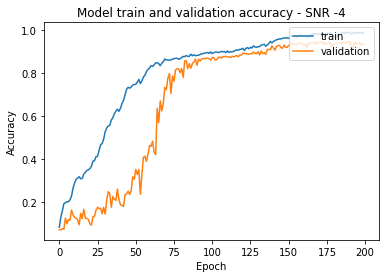

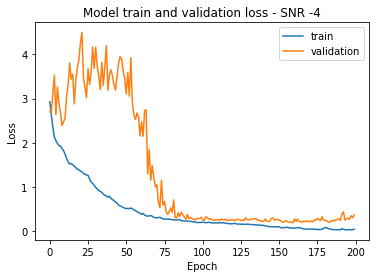


Score of SNR on All SNR model without Transfer Learning -4 = 75.47785639762878

Training SNR = -4 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 6s 286ms/step - loss: 0.1079 - accuracy: 0.9643 - val_loss: 0.8948 - val_accuracy: 0.7711
Epoch 2/200
7/7 [==============================] - 2s 285ms/step - loss: 0.0685 - accuracy: 0.9750 - val_loss: 0.8685 - val_accuracy: 0.7925
Epoch 3/200
7/7 [==============================] - 2s 284ms/step - loss: 0.0562 - accuracy: 0.9809 - val_loss: 0.9159 - val_accuracy: 0.8033
Epoch 4/200
7/7 [==============================] - 2s 288ms/step - loss: 0.0461 - accuracy: 0.9879 - val_loss: 0.7638 - val_accuracy: 0.8247
Epoch 5/200
7/7 [==============================] - 2s 290ms/step - loss: 0.0337 - accuracy: 0.9890 - val_loss: 0.6702 - val_accuracy: 0.8406
Epoch 6/200
7/7 [==============================] - 2s 294ms/step - loss: 0.0293 - accuracy: 0.9924 - val_loss: 0.6341 - val_accuracy: 0.8587
Epoch 7/200
7/7 [=

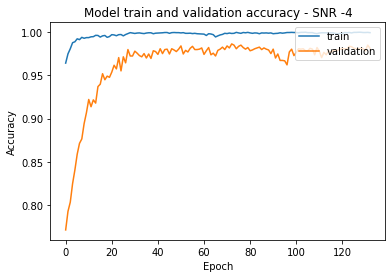

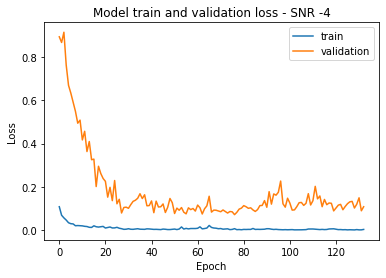

Score of SNR on High SNR model without Transfer Learning -4 = 90.81584811210632

Training SNR = -4 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 6s 284ms/step - loss: 0.2801 - accuracy: 0.9425 - val_loss: 0.2891 - val_accuracy: 0.9501
Epoch 2/200
7/7 [==============================] - 2s 283ms/step - loss: 0.1719 - accuracy: 0.9551 - val_loss: 0.2402 - val_accuracy: 0.9478
Epoch 3/200
7/7 [==============================] - 2s 286ms/step - loss: 0.1389 - accuracy: 0.9576 - val_loss: 0.1916 - val_accuracy: 0.9548
Epoch 4/200
7/7 [==============================] - 2s 285ms/step - loss: 0.1089 - accuracy: 0.9611 - val_loss: 0.1169 - val_accuracy: 0.9669
Epoch 5/200
7/7 [==============================] - 2s 288ms/step - loss: 0.0970 - accuracy: 0.9664 - val_loss: 0.1218 - val_accuracy: 0.9655
Epoch 6/200
7/7 [==============================] - 2s 288ms/step - loss: 0.0851 - accuracy: 0.9702 - val_loss: 0.1243 - val_accuracy: 0.9674
Epoch 7/200
7/7 [

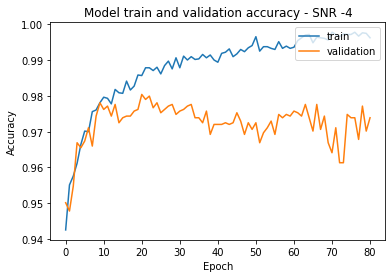

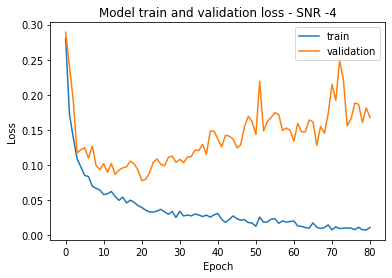

Score of SNR on low SNR model without Transfer Learning -4 = 75.0582754611969

Training SNR = -4 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 6s 286ms/step - loss: 0.1724 - accuracy: 0.9392 - val_loss: 0.9498 - val_accuracy: 0.7893
Epoch 2/200
7/7 [==============================] - 2s 285ms/step - loss: 0.1062 - accuracy: 0.9633 - val_loss: 0.9427 - val_accuracy: 0.8089
Epoch 3/200
7/7 [==============================] - 2s 286ms/step - loss: 0.0883 - accuracy: 0.9695 - val_loss: 0.8042 - val_accuracy: 0.8378
Epoch 4/200
7/7 [==============================] - 2s 289ms/step - loss: 0.0680 - accuracy: 0.9770 - val_loss: 0.7019 - val_accuracy: 0.8517
Epoch 5/200
7/7 [==============================] - 2s 289ms/step - loss: 0.0632 - accuracy: 0.9784 - val_loss: 0.6315 - val_accuracy: 0.8620
Epoch 6/200
7/7 [==============================] - 2s 290ms/step - loss: 0.0489 - accuracy: 0.9840 - val_loss: 0.4561 - val_accuracy: 0.8951
Epoch 7/200
7/7 [===

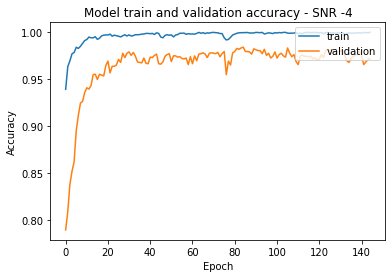

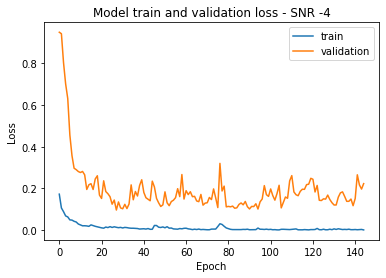

[[ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [93.98601651]
 [ 0.        ]] [[ 0.          0.          0.          0.          0.          0.
   0.          0.         75.4778564   0.        ]
 [ 0.          0.          0.          0.          0.          0.
   0.          0.         98.60140085  0.        ]] [[ 0.          0.          0.          0.          0.          0.
   0.          0.         90.81584811  0.        ]
 [ 0.          0.          0.          0.          0.          0.
   0.          0.         97.29603529  0.        ]] [[ 0.          0.          0.          0.          0.          0.
   0.          0.         75.05827546  0.        ]
 [ 0.          0.          0.          0.          0.          0.
   0.          0.         97.52913713  0.        ]]

Training SNR = -2 Data

Epoch 1/200
7/7 [==============================] - 7s 444ms/step - loss: 2.9617 - accuracy: 0.0888 - val_loss: 2.7041 -

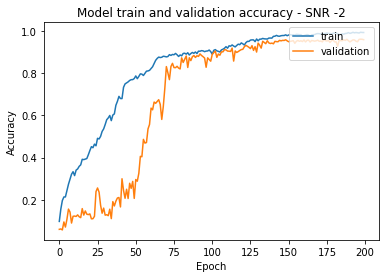

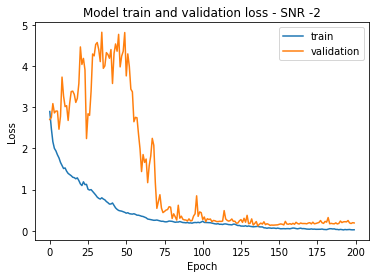


Score of SNR on All SNR model without Transfer Learning -2 = 75.99067687988281

Training SNR = -2 Data on a pre-trained All SNR model

Epoch 1/200
7/7 [==============================] - 6s 287ms/step - loss: 0.0670 - accuracy: 0.9772 - val_loss: 0.9873 - val_accuracy: 0.7478
Epoch 2/200
7/7 [==============================] - 2s 288ms/step - loss: 0.0451 - accuracy: 0.9841 - val_loss: 0.9416 - val_accuracy: 0.7846
Epoch 3/200
7/7 [==============================] - 2s 285ms/step - loss: 0.0327 - accuracy: 0.9904 - val_loss: 0.9212 - val_accuracy: 0.7916
Epoch 4/200
7/7 [==============================] - 2s 287ms/step - loss: 0.0260 - accuracy: 0.9927 - val_loss: 0.9452 - val_accuracy: 0.7823
Epoch 5/200
7/7 [==============================] - 2s 289ms/step - loss: 0.0195 - accuracy: 0.9939 - val_loss: 0.8748 - val_accuracy: 0.8121
Epoch 6/200
7/7 [==============================] - 2s 289ms/step - loss: 0.0206 - accuracy: 0.9939 - val_loss: 0.8383 - val_accuracy: 0.8303
Epoch 7/200
7/7 [=

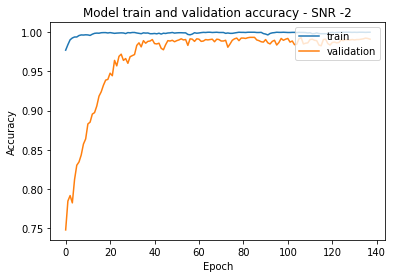

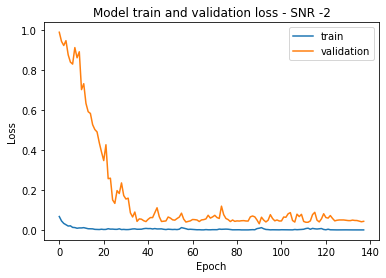

Score of SNR on High SNR model without Transfer Learning -2 = 96.73659801483154

Training SNR = -2 Data on a pre-trained High SNR model

Epoch 1/200
7/7 [==============================] - 6s 289ms/step - loss: 0.0821 - accuracy: 0.9782 - val_loss: 0.1163 - val_accuracy: 0.9734
Epoch 2/200
7/7 [==============================] - 2s 289ms/step - loss: 0.0517 - accuracy: 0.9828 - val_loss: 0.0925 - val_accuracy: 0.9744
Epoch 3/200
7/7 [==============================] - 2s 289ms/step - loss: 0.0431 - accuracy: 0.9857 - val_loss: 0.0893 - val_accuracy: 0.9758
Epoch 4/200
7/7 [==============================] - 2s 291ms/step - loss: 0.0423 - accuracy: 0.9862 - val_loss: 0.0722 - val_accuracy: 0.9753
Epoch 5/200
7/7 [==============================] - 2s 290ms/step - loss: 0.0391 - accuracy: 0.9854 - val_loss: 0.0741 - val_accuracy: 0.9781
Epoch 6/200
7/7 [==============================] - 2s 294ms/step - loss: 0.0319 - accuracy: 0.9891 - val_loss: 0.0847 - val_accuracy: 0.9795
Epoch 7/200
7/7 [

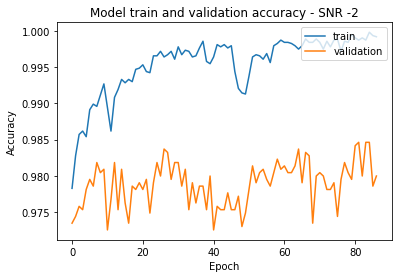

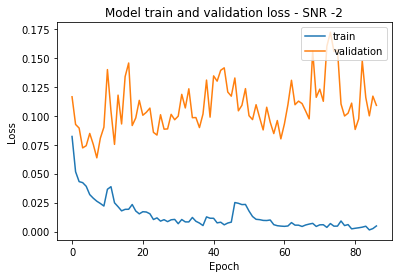

Score of SNR on low SNR model without Transfer Learning -2 = 76.08391642570496

Training SNR = -2 Data on a pre-trained Low SNR model

Epoch 1/200
7/7 [==============================] - 6s 287ms/step - loss: 0.1210 - accuracy: 0.9566 - val_loss: 0.9137 - val_accuracy: 0.7828
Epoch 2/200
7/7 [==============================] - 2s 287ms/step - loss: 0.0707 - accuracy: 0.9745 - val_loss: 0.8362 - val_accuracy: 0.8145
Epoch 3/200
7/7 [==============================] - 2s 290ms/step - loss: 0.0534 - accuracy: 0.9829 - val_loss: 0.7338 - val_accuracy: 0.8368
Epoch 4/200
7/7 [==============================] - 2s 290ms/step - loss: 0.0418 - accuracy: 0.9866 - val_loss: 0.5621 - val_accuracy: 0.8723
Epoch 5/200
7/7 [==============================] - 2s 291ms/step - loss: 0.0321 - accuracy: 0.9916 - val_loss: 0.5226 - val_accuracy: 0.8895
Epoch 6/200
7/7 [==============================] - 2s 294ms/step - loss: 0.0284 - accuracy: 0.9915 - val_loss: 0.5024 - val_accuracy: 0.8956
Epoch 7/200
7/7 [==

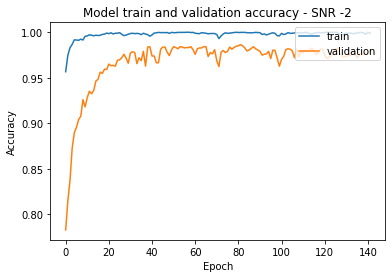

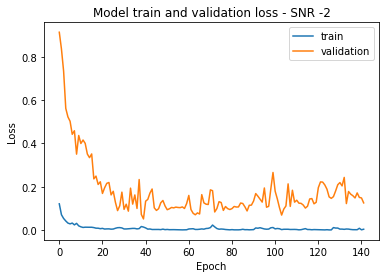

[[ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [93.98601651]
 [95.24475336]] [[ 0.          0.          0.          0.          0.          0.
   0.          0.         75.4778564  75.99067688]
 [ 0.          0.          0.          0.          0.          0.
   0.          0.         98.60140085 99.20746088]] [[ 0.          0.          0.          0.          0.          0.
   0.          0.         90.81584811 96.73659801]
 [ 0.          0.          0.          0.          0.          0.
   0.          0.         97.29603529 98.50816131]] [[ 0.          0.          0.          0.          0.          0.
   0.          0.         75.05827546 76.08391643]
 [ 0.          0.          0.          0.          0.          0.
   0.          0.         97.52913713 98.46153855]]


In [15]:
for i in range(8, 10):

  iq_data_complex = np.reshape(x_data_iq_data[:,i].flatten()[::2] + 1j*x_data_iq_data[:,i].flatten()[1::2], (x_dim[0]*x_dim[2], num_samples))
  iq_data_angle_curr = normalize(np.angle(iq_data_complex))
  iq_data_abs_curr = scale(np.absolute(iq_data_complex))
  iq_data_ap_curr = np.zeros(shape=(x_dim[0]*x_dim[2], num_samples, 2))

  for k in range(x_dim[0]*x_dim[2]):
    for j in range(num_samples):
      iq_data_ap_curr[k][j][0] = iq_data_abs_curr[k][j]
      iq_data_ap_curr[k][j][1] = iq_data_angle_curr[k][j]

  y_labels_curr = to_categorical(y_labels_data[:,i].flatten())

  X_train_curr, X_test_valid_curr, Y_train_curr, Y_test_valid_curr = train_test_split(iq_data_ap_curr, y_labels_curr, test_size=0.4)
  X_validation_curr, X_test_curr, Y_validation_curr, Y_test_curr = train_test_split(X_test_valid_curr, Y_test_valid_curr, test_size=0.5)

  scores_without_tf_ap[i] = train_data_2D(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, i)
  scores_tf_allsnr_ap[:,i] = train_data_on_all_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, model_folder_all, i)
  scores_tf_highsnr_ap[:,i] = train_data_on_high_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, model_folder_high, i)
  scores_tf_lowsnr_ap[:,i] = train_data_on_low_snr_model(X_train_curr, Y_train_curr, X_validation_curr, Y_validation_curr, X_test_curr, Y_test_curr, model_folder_low, i)

  print(scores_without_tf_ap, scores_tf_allsnr_ap, scores_tf_highsnr_ap, scores_tf_lowsnr_ap)

# Graphs and Results

## IQ 2D

In [ ]:
scores_without_tf_2d = [26.57342553, 42.51748323, 59.67366099, 72.96037078, 83.21678042, 86.71328425, 92.49417186, 94.40559149, 96.41025662, 96.96969986]
scores_tf_allsnr_2d = [[14.87179548, 21.72494233, 42.98368394, 66.57342911, 84.42890644, 90.30302763, 93.75291467, 95.6643343, 96.82983756, 97.71561623, 0,0,0,0,0,0,0,0,0,0],
                       [32.5874120, 47.4592059,  65.87412357, 77.57575512, 85.59440374, 87.31935024, 91.84148908, 94.63869333, 96.92307711, 98.22843671]]
scores_tf_highsnr_2d = [[7.36596733, 6.75990656, 8.76456872, 12.63403296, 26.06060505, 54.91841435, 83.82284641, 95.01165748, 97.94871807, 98.83449674, 0,0,0,0,0,0,0,0,0,0],
                        [25.82750618, 39.95338082, 58.22843909, 74.07925129, 84.0093255, 86.66666746, 90.53612947, 92.02797413, 94.12587285, 97.57575989]]
scores_tf_lowsnr_2d = [[35.19813418, 49.60373044, 72.02796936, 82.19113946, 87.0862484, 87.0862484, 89.13753033, 91.1421895, 91.00233316, 92.49417186, 0,0,0,0,0,0,0,0,0,0],
                        [34.21911299, 49.93006885, 68.2051301, 78.18182111, 85.59440374, 87.55244613, 92.63403416, 95.85081339, 96.96969986, 97.76223898]]

In [ ]:
for i in range(10, 21):

  x_data_iq_curr = np.reshape(x_data_iq_data[:,i], (total_num_snapshots, x_dim[3], x_dim[4]))
  x_data_iq_curr = normalize(x_data_iq_curr)
  y_data_iq_curr = to_categorical(y_labels[:,i].flatten())

  X_train_curr, X_test_valid_curr, Y_train_curr, Y_test_valid_curr = train_test_split(x_data_iq_curr, y_data_iq_curr, test_size=0.4)
  X_validation_curr, X_test_curr, Y_validation_curr, Y_test_curr = train_test_split(X_test_valid_curr, Y_test_valid_curr, test_size=0.5)

  model_folder_all = "/gdrive/My Drive/Trained Models/IQ/iq_2d_allSNR.tf"
  model_folder_high = "/gdrive/My Drive/Trained Models/IQ/iq_2d_highSNR.tf"
  model_folder_low = "/gdrive/My Drive/Trained Models/IQ/iq_2d_lowSNR.tf"

  score = model_folder_all.evaluate(X_test_curr, Y_test_curr, verbose=0)
  scores_tf_allsnr_abs[0][i] = score[1]*100

  score = model_folder_high.evaluate(X_test_curr, Y_test_curr, verbose=0)
  scores_tf_highsnr_abs[0][i] = score[1]*100

  score = model_folder_low.evaluate(X_test_curr, Y_test_curr, verbose=0)
  scores_tf_lowsnr_abs[0][i] = score[1]*100

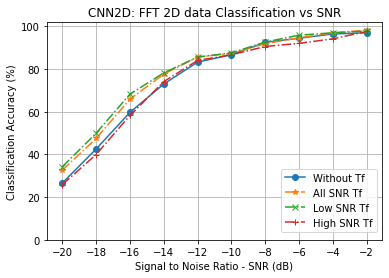

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

x = np.linspace(-20, -2, 10)
plt.plot(x,scores_without_tf_2d,'-o', x, scores_tf_allsnr_2d[1],'-.*', x, scores_tf_lowsnr_2d[1],'-.x', x, scores_tf_highsnr_2d[1], '-.+')
plt.title('LSTM2D: IQ 2D data Classification vs SNR')
plt.xlabel('Signal to Noise Ratio - SNR (dB)')
plt.ylabel('Classification Accuracy (%)')
plt.legend(['Without Tf','All SNR Tf','Low SNR Tf', 'High SNR Tf'], loc='best', bbox_to_anchor=(1,0.35))
plt.xticks(x)
plt.yticks([0,20,40,60,80,100])
plt.rcParams.update({'font.size': 10})
plt.grid()
plt.show()

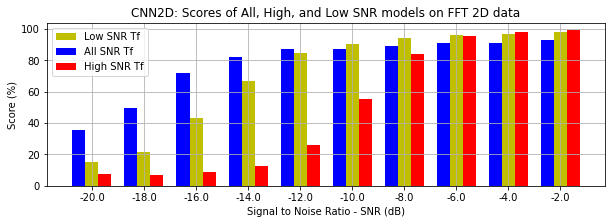

In [ ]:
y = [scores_tf_allsnr_2d[0], scores_tf_lowsnr_2d[0], scores_tf_highsnr_2d[0]]
r = np.arange(20)
width = 0.25  
f = plt.figure()
f.set_figwidth(12)
f.set_figheight(3)
plt.bar(r, y[0], color = 'y', width = width)
plt.bar(r - width, y[1], color = 'b', width = width)
plt.bar(r + width, y[2], color = 'r', width = width)
plt.xlabel('Signal to Noise Ratio - SNR (dB)')
plt.ylabel('Score (%)')
plt.title('LSTM2D: Scores of All, High, and Low SNR models on FFT 2D data')
plt.legend(['Low SNR Tf','All SNR Tf', 'High SNR Tf'])
x = np.linspace(-20, -2, 10)
plt.yticks([0,20,40,60,80,100])
plt.xticks(r, x)
plt.grid()
plt.show()

## IQ Phase

In [ ]:
for i in range(10, 21):

  iq_data_complex = np.reshape(x_data_iq_data[:,10:21].flatten()[::2] + 1j*x_data_iq_data[:,10:21].flatten()[1::2], (total_num_snapshots, num_samples))
  iq_data_angle_curr = normalize(np.angle(iq_data_complex))
  iq_data_angle_curr = np.reshape(iq_data_angle_curr, (x_dim[0]*x_dim[2], num_samples, 1))
  y_labels = to_categorical(y_labels_data[:,10:21].flatten())

  X_train_curr, X_test_valid_curr, Y_train_curr, Y_test_valid_curr = train_test_split(iq_data_angle_curr, y_labels_curr, test_size=0.4)
  X_validation_curr, X_test_curr, Y_validation_curr, Y_test_curr = train_test_split(X_test_valid_curr, Y_test_valid_curr, test_size=0.5)

  model_folder_all = "/gdrive/My Drive/Trained Models/IQ/iq_angle_allSNR.tf"
  model_folder_high = "/gdrive/My Drive/Trained Models/IQ/iq_angle_highSNR.tf"
  model_folder_low = "/gdrive/My Drive/Trained Models/IQ/iq_angle_lowSNR.tf"

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

x = np.linspace(-20, -2, 10)
plt.plot(x,scores_without_tf_abs,'-o', x, scores_tf_allsnr_abs[1],'-.*', x, scores_tf_lowsnr_abs[1],'-.x', x, scores_tf_highsnr_abs[1], '-.+')
plt.title('CNN1D: FFT Amplitude data Classification vs SNR')
plt.xlabel('Signal to Noise Ratio - SNR (dB)')
plt.ylabel('Classification Accuracy (%)')
plt.legend(['Without Tf','All SNR Tf','Low SNR Tf', 'High SNR Tf'], loc='best', bbox_to_anchor=(1,0.35))
plt.xticks(x)
plt.yticks([0,20,40,60,80,100])
plt.rcParams.update({'font.size': 10})
plt.grid()
plt.show()

In [ ]:
y = [scores_tf_allsnr_abs[0], scores_tf_lowsnr_abs[0], scores_tf_highsnr_abs[0]]
r = np.arange(10)
width = 0.25  
f = plt.figure()
f.set_figwidth(10)
f.set_figheight(3)
plt.bar(r, y[0], color = 'y', width = width)
plt.bar(r - width, y[1], color = 'b', width = width)
plt.bar(r + width, y[2], color = 'r', width = width)
plt.xlabel('Signal to Noise Ratio - SNR (dB)')
plt.ylabel('Score (%)')
plt.title('CNN1D: Scores of All, High, and Low SNR models on FFT Amplitude data')
plt.legend(['Low SNR Tf','All SNR Tf', 'High SNR Tf'])
x = np.linspace(-20, -2, 10)
plt.yticks([0,20,40,60,80,100])
plt.xticks(r, x)
plt.grid()
plt.show()